<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/Norway/Marine/Marine_1H_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "MHGNONOK"
data_resample = '1H'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [0]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-09-06 00:23:24,630 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-09-06 00:23:24,631 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for MHGNONOK
2019-09-06 00:23:35,355 - numexpr.utils - INFO - NumExpr defaulting to 2 threads.
2019-09-06 00:27:07,893 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-09-06 00:34:46,086 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-09-06 00:38:47,142 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-09-06 00:42:40,487 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-09-06 00:46:42,853 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-09-06 00:50:37,827 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-09-06 00:54:39,659 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-09

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02 08:00:00,1.39198,1.39397,1.37347,1.38347,3.283744
2018-01-02 09:00:00,1.38348,1.38948,1.37897,1.37998,2.885913
2018-01-02 10:00:00,1.38047,1.38798,1.37865,1.38248,2.275778
2018-01-02 11:00:00,1.38247,1.38398,1.37748,1.38048,1.588163
2018-01-02 12:00:00,1.38048,1.38287,1.37597,1.37897,2.017779
2018-01-02 13:00:00,1.37898,1.38237,1.37147,1.37198,2.222640
2018-01-02 14:00:00,1.37198,1.37547,1.36547,1.36748,3.053570
2018-01-02 15:00:00,1.36787,1.37198,1.36397,1.37097,1.210314
2018-01-03 08:00:00,1.37597,1.37748,1.35197,1.35538,2.105685


,Open,High,Low,Close,Volume
count,1983.000000,1983.000000,1983.000000,1983.000000,1983.000000
mean,1.718217,1.724238,1.712431,1.718595,4.110450
std,0.194790,0.195214,0.194133,0.194617,2.213452
min,1.293480,1.302480,1.291880,1.299980,0.440000
25%,1.597425,1.603475,1.591375,1.600175,2.432579
50%,1.721470,1.728470,1.715870,1.721170,3.750000
75%,1.870670,1.875725,1.864425,1.870970,5.320000
max,2.072980,2.073980,2.067870,2.073970,16.660000


25

In [0]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,1983
Total Missing (%),0.0%
Total size in memory,54.3 KiB
Average record size in memory,28.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [0]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_1

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_1

36

In [0]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,1041
Number of observations,1933
Total Missing (%),0.0%
Total size in memory,15.3 MiB
Average record size in memory,8.1 KiB
Numeric,96
Categorical,0
Boolean,31
Date,1
Text (Unique),0
Rejected,913


In [0]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_1

139952

In [0]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp3ksf66b_
  JVM stdout: /tmp/tmp3ksf66b_/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp3ksf66b_/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 18 days
H2O cluster name:,H2O_from_python_unknownUser_5ulc7w
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.728876,0.692113,0.328833,0.467626,0.218674
1,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.714885,0.626195,0.325240,0.466430,0.217557
2,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.714068,0.631697,0.328071,0.469135,0.220087
3,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.712217,0.637955,0.332970,0.473674,0.224367
4,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.709713,0.686960,0.367814,0.473619,0.224315
5,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.699913,0.627833,0.361716,0.468116,0.219132
6,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.693489,0.702311,0.379573,0.498046,0.248050
7,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.657666,1.062835,0.426176,0.570199,0.325126
8,DeepLearning_1_AutoML_20190906_011837,0.657666,0.702835,0.409952,0.498921,0.248922
9,DeepLearning_grid_1_AutoML_20190906_011837_mod...,0.618467,1.594060,0.386868,0.578748,0.334950


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.003013
1,CDL3BLACKCROWS,0.872865,0.872865,0.002630
2,CDLIDENTICAL3CROWS,0.855666,0.855666,0.002578
3,CDLRISEFALL3METHODS,0.842643,0.842643,0.002539
4,CDLEVENINGSTAR,0.840492,0.840492,0.002533
5,CDLSTICKSANDWICH,0.830701,0.830701,0.002503
6,CDLDARKCLOUDCOVER,0.829350,0.829350,0.002499
7,CDLMORNINGDOJISTAR,0.808449,0.808449,0.002436
8,CDLCLOSINGMARUBOZU,0.774415,0.774415,0.002334
9,CDLSTALLEDPATTERN,0.766575,0.766575,0.002310


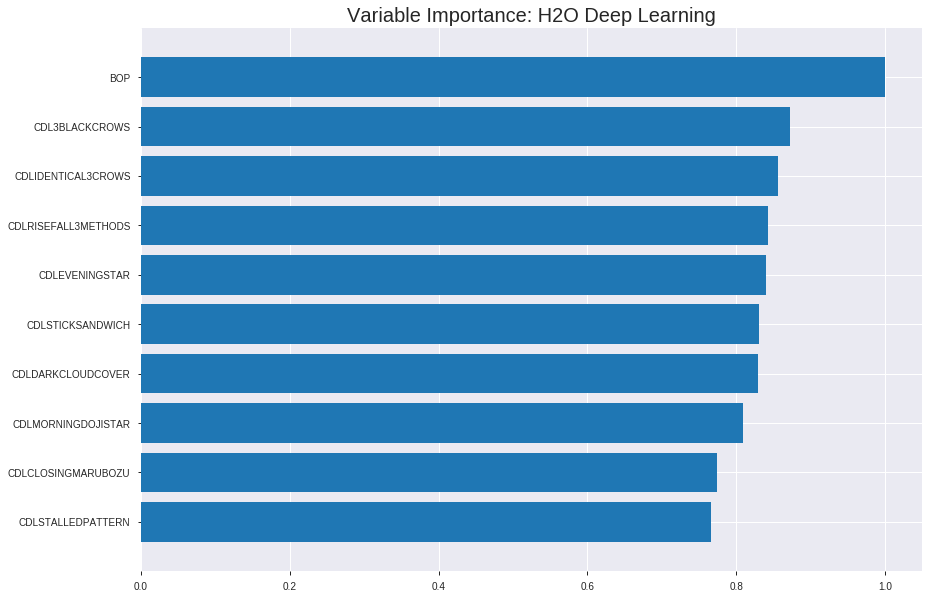

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190906_011837_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.08194580455050264
RMSE: 0.28626177626519167
LogLoss: 0.2626833924038391
Mean Per-Class Error: 0.11236895804246383
AUC: 0.9580347925575402
pr_auc: 0.8931153803926548
Gini: 0.9160695851150804
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4316721687844387: 


,0,1,Error,Rate
0,623.0,80.0,0.1138,(80.0/703.0)
1,72.0,577.0,0.1109,(72.0/649.0)
Total,695.0,657.0,0.1124,(152.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4316722,0.8836141,211.0
max f2,0.2309722,0.9169396,273.0
max f0point5,0.7926941,0.9082290,106.0
max accuracy,0.4316722,0.8875740,211.0
max precision,0.9999317,1.0,0.0
max recall,0.0021589,1.0,394.0
max specificity,0.9999317,1.0,0.0
max absolute_mcc,0.4316722,0.7749496,211.0
max min_per_class_accuracy,0.4316722,0.8862020,211.0
max mean_per_class_accuracy,0.4316722,0.8876310,211.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 46.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9999676,2.0832049,2.0832049,1.0,0.9999874,1.0,0.9999874,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9999300,2.0832049,2.0832049,1.0,0.9999499,1.0,0.9999687,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.9998166,2.0832049,2.0832049,1.0,0.9998839,1.0,0.9999418,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.9996102,2.0832049,2.0832049,1.0,0.9997217,1.0,0.9998857,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.9993332,2.0832049,2.0832049,1.0,0.9994535,1.0,0.9998031,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.9963920,2.0832049,2.0832049,1.0,0.9979975,1.0,0.9989003,0.1047766,0.2095532,108.3204931,108.3204931
,7,0.1501479,0.9916182,2.0832049,2.0832049,1.0,0.9943154,1.0,0.9973871,0.1032357,0.3127889,108.3204931,108.3204931
,8,0.2004438,0.9796873,2.0832049,2.0832049,1.0,0.9863504,1.0,0.9946177,0.1047766,0.4175655,108.3204931,108.3204931
,9,0.3002959,0.9143097,1.9906180,2.0524187,0.9555556,0.9556686,0.9852217,0.9816667,0.1987673,0.6163328,99.0618045,105.2418651
,10,0.4001479,0.6942587,1.6202705,1.9445813,0.7777778,0.8203563,0.9334566,0.9414136,0.1617874,0.7781202,62.0270502,94.4581312




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.22312317489725023
RMSE: 0.4723591587947144
LogLoss: 0.6813140807295713
Mean Per-Class Error: 0.27758064516129033
AUC: 0.773736559139785
pr_auc: 0.7288908412801014
Gini: 0.54747311827957
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1461842856651046: 


,0,1,Error,Rate
0,118.0,82.0,0.41,(82.0/200.0)
1,27.0,159.0,0.1452,(27.0/186.0)
Total,145.0,241.0,0.2824,(109.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1461843,0.7447307,240.0
max f2,0.0221891,0.8448118,344.0
max f0point5,0.2574899,0.7016632,193.0
max accuracy,0.1461843,0.7176166,240.0
max precision,0.9998080,1.0,0.0
max recall,0.0028947,1.0,380.0
max specificity,0.9998080,1.0,0.0
max absolute_mcc,0.1461843,0.4589671,240.0
max min_per_class_accuracy,0.2639690,0.705,190.0
max mean_per_class_accuracy,0.1461843,0.7224194,240.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 35.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9917539,2.0752688,2.0752688,1.0,0.9956664,1.0,0.9956664,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9706572,2.0752688,2.0752688,1.0,0.9817940,1.0,0.9887302,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9622148,1.5564516,1.9023297,0.75,0.9688004,0.9166667,0.9820869,0.0161290,0.0591398,55.6451613,90.2329749
,4,0.0414508,0.9570608,1.0376344,1.6861559,0.5,0.9600395,0.8125,0.9765751,0.0107527,0.0698925,3.7634409,68.6155914
,5,0.0518135,0.9476082,1.0376344,1.5564516,0.5,0.9523638,0.75,0.9717328,0.0107527,0.0806452,3.7634409,55.6451613
,6,0.1010363,0.8806021,1.8568195,1.7027847,0.8947368,0.9166504,0.8205128,0.9448978,0.0913978,0.1720430,85.6819468,70.2784671
,7,0.1502591,0.7679854,1.6383701,1.6816834,0.7894737,0.8229209,0.8103448,0.9049398,0.0806452,0.2526882,63.8370119,68.1683352
,8,0.2020725,0.6642861,1.3489247,1.5963606,0.65,0.7233772,0.7692308,0.8583853,0.0698925,0.3225806,34.8924731,59.6360629
,9,0.3005181,0.5309066,1.3653084,1.5206711,0.6578947,0.5947463,0.7327586,0.7720208,0.1344086,0.4569892,36.5308432,52.0671116
,10,0.4015544,0.3972338,1.3303005,1.4727714,0.6410256,0.4697934,0.7096774,0.6959765,0.1344086,0.5913978,33.0300524,47.2771419



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 01:24:51,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-09-06 01:24:55,7.157 sec,151 obs/sec,0.5081361,1,687.0,0.6616292,6.4306639,-0.7538104,0.5563017,0.4687448,1.4880035,0.5199704,0.6941652,16.3028536,-0.9300000,0.6247043,0.5967950,2.0752688,0.4326425
,2019-09-06 01:25:20,31.362 sec,157 obs/sec,3.0806213,6,4165.0,0.5909683,2.0687479,-0.3992063,0.6808790,0.6666003,1.9344046,0.4378698,0.6941464,6.5714382,-0.9298957,0.6694624,0.6501066,2.0752688,0.4766839
,2019-09-06 01:25:42,53.902 sec,163 obs/sec,5.6531065,11,7643.0,0.4822286,0.8687153,0.0683362,0.7966847,0.7754356,2.0832049,0.3076923,0.5619848,1.3958968,-0.2649715,0.7180108,0.6846113,1.5564516,0.3186528
,2019-09-06 01:26:07,1 min 18.698 sec,170 obs/sec,8.7463018,17,11825.0,0.4937892,0.9395779,0.0231306,0.7568620,0.6809488,1.9344046,0.2988166,0.6993377,3.1105729,-0.9588698,0.7038575,0.6726378,2.0752688,0.3782383
,2019-09-06 01:26:31,1 min 42.626 sec,176 obs/sec,11.8535503,23,16026.0,0.4226496,0.5790903,0.2843275,0.8383189,0.7901598,1.9344046,0.2507396,0.4790786,0.7454862,0.0807254,0.7463978,0.7023113,2.0752688,0.3056995
,2019-09-06 01:26:57,2 min 9.042 sec,181 obs/sec,15.4593195,30,20901.0,0.4498423,0.7574267,0.1892744,0.8097138,0.8006725,2.0832049,0.2847633,0.5997265,1.1838921,-0.4405824,0.7462097,0.7195928,2.0752688,0.3419689
,2019-09-06 01:27:20,2 min 31.431 sec,185 obs/sec,18.5747041,36,25113.0,0.4573804,0.7617672,0.1618757,0.8271627,0.8245523,2.0832049,0.2677515,0.6660920,2.4939471,-0.7770517,0.6627957,0.6398596,2.0752688,0.3937824
,2019-09-06 01:27:46,2 min 57.783 sec,187 obs/sec,22.1775148,43,29984.0,0.3965786,0.5258990,0.3698963,0.8829494,0.8648360,2.0832049,0.2085799,0.5532099,1.1694027,-0.2257771,0.7718011,0.7491975,1.5564516,0.3445596
,2019-09-06 01:28:11,3 min 22.469 sec,191 obs/sec,25.7337278,50,34792.0,0.3678503,0.4377931,0.4578798,0.8988070,0.8525256,2.0832049,0.1834320,0.5284054,0.8638056,-0.1183200,0.6821505,0.6461021,2.0752688,0.3756477


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0030133
CDL3BLACKCROWS,0.8728654,0.8728654,0.0026302
CDLIDENTICAL3CROWS,0.8556655,0.8556655,0.0025784
CDLRISEFALL3METHODS,0.8426427,0.8426427,0.0025391
CDLEVENINGSTAR,0.8404924,0.8404924,0.0025327
---,---,---,---
BBANDS_upperband_12_6_2,0.2796726,0.2796726,0.0008427
BBANDS_upperband_14_4_5,0.2792411,0.2792411,0.0008414
BBANDS_upperband_24_5_2,0.2789192,0.2789192,0.0008405
MAVP_12_7,0.2773561,0.2773561,0.0008358



See the whole table with table.as_data_frame()


('accuracy', 0.6958762886597938)

('F1', 0.6728971962616822)

('auc', 0.7288763066202091)

('logloss', 0.6921125872195616)

('mean_per_class_error', 0.3091245644599303)

('rmse', 0.4676261047956198)

('mse', 0.21867417388632396)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


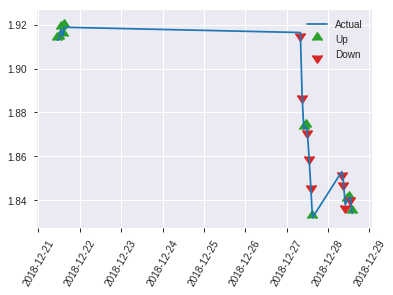


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.21867417388632396
RMSE: 0.4676261047956198
LogLoss: 0.6921125872195616
Mean Per-Class Error: 0.3091245644599303
AUC: 0.7288763066202091
pr_auc: 0.6243288450718614
Gini: 0.45775261324041816
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.16764032557844563: 


,0,1,Error,Rate
0,52.0,60.0,0.5357,(60.0/112.0)
1,10.0,72.0,0.122,(10.0/82.0)
Total,62.0,132.0,0.3608,(70.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1676403,0.6728972,131.0
max f2,0.0209820,0.7920792,176.0
max f0point5,0.4377782,0.6398104,84.0
max accuracy,0.4377782,0.6958763,84.0
max precision,0.9999104,1.0,0.0
max recall,0.0021225,1.0,189.0
max specificity,0.9999104,1.0,0.0
max absolute_mcc,0.4377782,0.3800785,84.0
max min_per_class_accuracy,0.4216310,0.6829268,89.0
max mean_per_class_accuracy,0.4377782,0.6908754,84.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 41.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9792275,1.1829268,1.1829268,0.5,0.9982203,0.5,0.9982203,0.0121951,0.0121951,18.2926829,18.2926829
,2,0.0206186,0.9677771,2.3658537,1.7743902,1.0,0.9745206,0.75,0.9863705,0.0243902,0.0365854,136.5853659,77.4390244
,3,0.0309278,0.9548657,1.1829268,1.5772358,0.5,0.9663072,0.6666667,0.9796827,0.0121951,0.0487805,18.2926829,57.7235772
,4,0.0412371,0.9483207,2.3658537,1.7743902,1.0,0.9515432,0.75,0.9726478,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.9081560,2.3658537,1.8926829,1.0,0.9342863,0.8,0.9649755,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.8467427,1.8926829,1.8926829,0.8,0.8764913,0.8,0.9207334,0.0975610,0.1951220,89.2682927,89.2682927
,7,0.1494845,0.7949199,1.3143631,1.7132044,0.5555556,0.8201693,0.7241379,0.8895239,0.0609756,0.2560976,31.4363144,71.3204373
,8,0.2010309,0.7378151,1.1829268,1.5772358,0.5,0.7735408,0.6666667,0.8597846,0.0609756,0.3170732,18.2926829,57.7235772
,9,0.2989691,0.6208142,1.2451861,1.4684609,0.5263158,0.6704976,0.6206897,0.7977768,0.1219512,0.4390244,24.5186136,46.8460892
,10,0.4020619,0.4561516,1.5378049,1.4862414,0.65,0.5600319,0.6282051,0.7368166,0.1585366,0.5975610,53.7804878,48.6241401


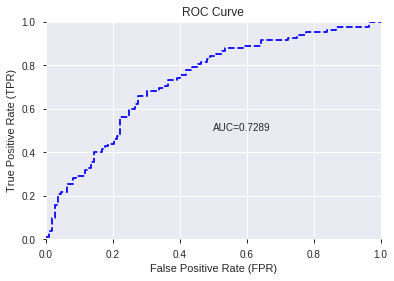

This function is available for GLM models only


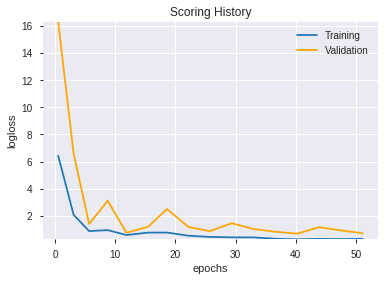

--2019-09-06 01:54:19--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.83.24
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.83.24|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  14.2MB/s    in 27s     

2019-09-06 01:54:47 (13.0 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unkno

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190906_011837_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190906_011837_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [10]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190906_015542_model_8,0.729203,0.643091,0.305314,0.462210,0.213638
1,DeepLearning_grid_1_AutoML_20190906_015542_model_7,0.721254,0.789453,0.321537,0.488805,0.238931
2,DeepLearning_grid_1_AutoML_20190906_015542_model_6,0.713088,0.639946,0.334495,0.465462,0.216654
3,DeepLearning_grid_1_AutoML_20190906_015542_model_9,0.712652,0.621161,0.365309,0.464140,0.215426
4,DeepLearning_grid_1_AutoML_20190906_015542_model_5,0.712435,0.638951,0.332861,0.464841,0.216077
5,DeepLearning_grid_1_AutoML_20190906_015542_model_2,0.696429,0.773414,0.360845,0.490908,0.240991
6,DeepLearning_grid_1_AutoML_20190906_015542_model_3,0.694795,0.772936,0.349085,0.487296,0.237457
7,DeepLearning_grid_1_AutoML_20190906_015542_model_1,0.691529,0.958738,0.323606,0.502526,0.252532
8,DeepLearning_grid_1_AutoML_20190906_015542_model_4,0.690113,0.799624,0.371407,0.508160,0.258227
9,DeepLearning_1_AutoML_20190906_015542,0.657012,0.701162,0.418881,0.494912,0.244938


,variable,relative_importance,scaled_importance,percentage
0,CDLCLOSINGMARUBOZU,1.000000,1.000000,0.038367
1,BOP,0.937721,0.937721,0.035978
2,CDLSHORTLINE,0.762468,0.762468,0.029254
3,hour,0.747361,0.747361,0.028674
4,HT_TRENDMODE,0.687155,0.687155,0.026364
5,HT_PHASOR_inphase,0.644800,0.644800,0.024739
6,DIV,0.632540,0.632540,0.024269
7,TRANGE,0.627722,0.627722,0.024084
8,CDLEVENINGSTAR,0.627403,0.627403,0.024072
9,CORREL_8,0.626728,0.626728,0.024046


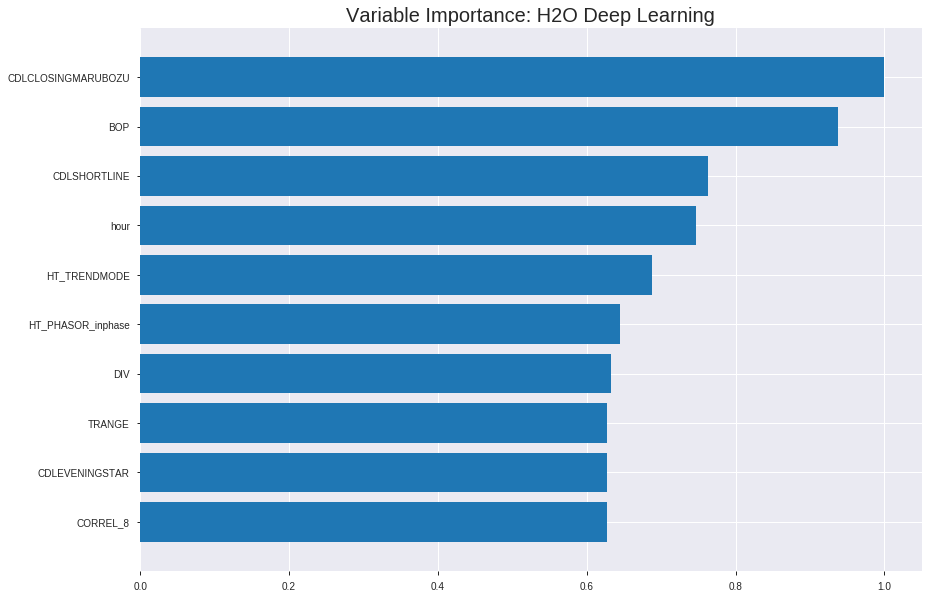

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190906_015542_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.17350797761377462
RMSE: 0.416542888084498
LogLoss: 0.5108648835993413
Mean Per-Class Error: 0.2546657841037858
AUC: 0.8240536376129596
pr_auc: 0.813431726207701
Gini: 0.6481072752259192
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49354478298107013: 


,0,1,Error,Rate
0,455.0,248.0,0.3528,(248.0/703.0)
1,113.0,536.0,0.1741,(113.0/649.0)
Total,568.0,784.0,0.267,(361.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4935448,0.7480809,212.0
max f2,0.1699451,0.8604589,333.0
max f0point5,0.5853014,0.7543186,157.0
max accuracy,0.5282966,0.7463018,187.0
max precision,0.9966222,1.0,0.0
max recall,0.0987414,1.0,356.0
max specificity,0.9966222,1.0,0.0
max absolute_mcc,0.5282966,0.4914160,187.0
max min_per_class_accuracy,0.5212729,0.7411402,192.0
max mean_per_class_accuracy,0.5282966,0.7453342,187.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 51.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9797782,2.0832049,2.0832049,1.0,0.9886207,1.0,0.9886207,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9716120,2.0832049,2.0832049,1.0,0.9761512,1.0,0.9823860,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.9641300,2.0832049,2.0832049,1.0,0.9682022,1.0,0.9778887,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.9525901,2.0832049,2.0832049,1.0,0.9576731,1.0,0.9727429,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.9451376,1.9229584,2.0525696,0.9230769,0.9489778,0.9852941,0.9681995,0.0184900,0.1032357,92.2958398,105.2569564
,6,0.1005917,0.8981188,1.7768513,1.9147104,0.8529412,0.9221014,0.9191176,0.9451505,0.0893683,0.1926040,77.6851264,91.4710414
,7,0.1501479,0.8286058,1.8344640,1.8882252,0.8805970,0.8622429,0.9064039,0.9177869,0.0909091,0.2835131,83.4464043,88.8225159
,8,0.2004438,0.7814182,1.6849452,1.8372176,0.8088235,0.8059875,0.8819188,0.8897339,0.0847458,0.3682589,68.4945165,83.7217633
,9,0.3002959,0.6474762,1.5431148,1.7394248,0.7407407,0.7094571,0.8349754,0.8297896,0.1540832,0.5223421,54.3114763,73.9424807
,10,0.4001479,0.5551103,1.2344918,1.6134249,0.5925926,0.5971549,0.7744917,0.7717384,0.1232666,0.6456086,23.4491811,61.3424891




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.17734366836959764
RMSE: 0.4211219162779321
LogLoss: 0.5273414891972823
Mean Per-Class Error: 0.2492741935483871
AUC: 0.8153494623655914
pr_auc: 0.7888914738365089
Gini: 0.6306989247311827
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42954378517094793: 


,0,1,Error,Rate
0,123.0,77.0,0.385,(77.0/200.0)
1,23.0,163.0,0.1237,(23.0/186.0)
Total,146.0,240.0,0.2591,(100.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4295438,0.7652582,239.0
max f2,0.3648662,0.8595285,273.0
max f0point5,0.5333092,0.7403189,172.0
max accuracy,0.4848362,0.7487047,210.0
max precision,0.9916557,1.0,0.0
max recall,0.0337019,1.0,361.0
max specificity,0.9916557,1.0,0.0
max absolute_mcc,0.4295438,0.5062618,239.0
max min_per_class_accuracy,0.5132939,0.73,189.0
max mean_per_class_accuracy,0.4848362,0.7507258,210.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 49.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9810962,2.0752688,2.0752688,1.0,0.9861332,1.0,0.9861332,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9738351,2.0752688,2.0752688,1.0,0.9800163,1.0,0.9830748,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9615111,2.0752688,2.0752688,1.0,0.9672655,1.0,0.9778050,0.0215054,0.0645161,107.5268817,107.5268817
,4,0.0414508,0.9600410,2.0752688,2.0752688,1.0,0.9604964,1.0,0.9734778,0.0215054,0.0860215,107.5268817,107.5268817
,5,0.0518135,0.9533118,1.5564516,1.9715054,0.75,0.9559574,0.95,0.9699738,0.0161290,0.1021505,55.6451613,97.1505376
,6,0.1010363,0.8998769,1.9660441,1.9688448,0.9473684,0.9301638,0.9487179,0.9505792,0.0967742,0.1989247,96.6044143,96.8844775
,7,0.1502591,0.8248277,1.3106961,1.7532443,0.6315789,0.8604069,0.8448276,0.9210400,0.0645161,0.2634409,31.0696095,75.3244346
,8,0.2020725,0.7504550,1.5564516,1.7027847,0.75,0.7859337,0.8205128,0.8863973,0.0806452,0.3440860,55.6451613,70.2784671
,9,0.3005181,0.6362395,1.5291454,1.6459029,0.7368421,0.7015714,0.7931034,0.8258509,0.1505376,0.4946237,52.9145444,64.5902855
,10,0.4015544,0.5505963,1.2770885,1.5531044,0.6153846,0.5857210,0.7483871,0.7654311,0.1290323,0.6236559,27.7088503,55.3104405



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:01:22,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-09-06 02:01:24,1 min 18.946 sec,607 obs/sec,0.7928994,1,1072.0,0.4839525,0.6749340,0.0616631,0.7666527,0.7419082,1.7856042,0.3321006,0.4835112,0.6702038,0.0636358,0.7948118,0.7599623,2.0752688,0.2875648
,2019-09-06 02:01:34,1 min 29.123 sec,875 obs/sec,7.0931953,9,9590.0,0.4412670,0.5748764,0.2198892,0.7947702,0.7822606,2.0832049,0.3372781,0.4361266,0.5631876,0.2381723,0.8146774,0.7866092,2.0752688,0.2797927
,2019-09-06 02:01:44,1 min 39.150 sec,964 obs/sec,14.2144970,18,19218.0,0.4204801,0.5214481,0.2916561,0.8113314,0.7971253,2.0832049,0.2855030,0.4262654,0.5422855,0.2722340,0.8085753,0.7853103,2.0752688,0.2772021
,2019-09-06 02:01:55,1 min 50.170 sec,1036 obs/sec,22.9792899,29,31068.0,0.4165429,0.5108649,0.3048592,0.8240536,0.8134317,2.0832049,0.2670118,0.4211219,0.5273415,0.2896909,0.8153495,0.7888915,2.0752688,0.2590674
,2019-09-06 02:02:06,2 min 0.469 sec,1091 obs/sec,31.6915680,40,42847.0,0.4067663,0.4909413,0.3371072,0.8362784,0.8269132,2.0832049,0.2781065,0.4258158,0.5420921,0.2737683,0.8043548,0.7760306,2.0752688,0.2642487
,2019-09-06 02:02:16,2 min 10.639 sec,1126 obs/sec,40.3698225,51,54580.0,0.3974097,0.4681940,0.3672528,0.8512045,0.8418242,2.0832049,0.2707101,0.4280065,0.5648650,0.2662765,0.8071237,0.7584357,1.5564516,0.2538860
,2019-09-06 02:02:26,2 min 21.464 sec,1159 obs/sec,49.8032544,63,67334.0,0.4009853,0.4746863,0.3558155,0.8686687,0.8610243,2.0832049,0.2322485,0.4550099,0.6204964,0.1707731,0.7876344,0.7195654,1.0376344,0.2772021
,2019-09-06 02:02:28,2 min 22.485 sec,1159 obs/sec,49.8032544,63,67334.0,0.4165429,0.5108649,0.3048592,0.8240536,0.8134317,2.0832049,0.2670118,0.4211219,0.5273415,0.2896909,0.8153495,0.7888915,2.0752688,0.2590674


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLCLOSINGMARUBOZU,1.0,1.0,0.0383672
BOP,0.9377210,0.9377210,0.0359777
CDLSHORTLINE,0.7624677,0.7624677,0.0292537
hour,0.7473612,0.7473612,0.0286742
HT_TRENDMODE,0.6871551,0.6871551,0.0263642
---,---,---,---
CDLDOJISTAR,0.3759671,0.3759671,0.0144248
CDL3INSIDE,0.3659534,0.3659534,0.0140406
CDLMORNINGDOJISTAR,0.3628200,0.3628200,0.0139204
CDLINVERTEDHAMMER,0.3578276,0.3578276,0.0137288



See the whole table with table.as_data_frame()


('accuracy', 0.6752577319587629)

('F1', 0.6862745098039217)

('auc', 0.7292029616724739)

('logloss', 0.6430913309125734)

('mean_per_class_error', 0.30531358885017423)

('rmse', 0.4622101397935904)

('mse', 0.21363821332801036)

deeplearning prediction progress: |███████████████████████████████████████| 100%


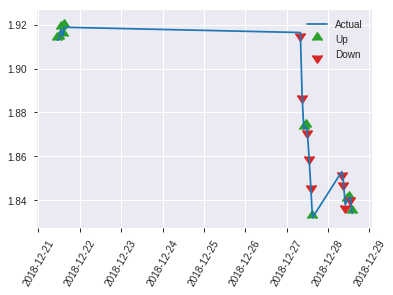


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.21363821332801036
RMSE: 0.4622101397935904
LogLoss: 0.6430913309125734
Mean Per-Class Error: 0.30531358885017423
AUC: 0.7292029616724739
pr_auc: 0.6342940664736744
Gini: 0.4584059233449478
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40696808697440834: 


,0,1,Error,Rate
0,60.0,52.0,0.4643,(52.0/112.0)
1,12.0,70.0,0.1463,(12.0/82.0)
Total,72.0,122.0,0.3299,(64.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4069681,0.6862745,121.0
max f2,0.1489104,0.7991803,159.0
max f0point5,0.4330234,0.6178707,110.0
max accuracy,0.4413723,0.6752577,106.0
max precision,0.9766908,1.0,0.0
max recall,0.0022442,1.0,191.0
max specificity,0.9766908,1.0,0.0
max absolute_mcc,0.4069681,0.3981396,121.0
max min_per_class_accuracy,0.4782551,0.6517857,92.0
max mean_per_class_accuracy,0.4069681,0.6946864,121.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 45.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9714122,1.1829268,1.1829268,0.5,0.9762583,0.5,0.9762583,0.0121951,0.0121951,18.2926829,18.2926829
,2,0.0206186,0.9659944,2.3658537,1.7743902,1.0,0.9708910,0.75,0.9735746,0.0243902,0.0365854,136.5853659,77.4390244
,3,0.0309278,0.9616542,2.3658537,1.9715447,1.0,0.9644993,0.8333333,0.9705495,0.0243902,0.0609756,136.5853659,97.1544715
,4,0.0412371,0.9603186,1.1829268,1.7743902,0.5,0.9608770,0.75,0.9681314,0.0121951,0.0731707,18.2926829,77.4390244
,5,0.0515464,0.9448908,2.3658537,1.8926829,1.0,0.9594181,0.8,0.9663887,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.8583722,1.8926829,1.8926829,0.8,0.9074005,0.8,0.9368946,0.0975610,0.1951220,89.2682927,89.2682927
,7,0.1494845,0.7861838,1.8401084,1.8763667,0.7777778,0.8167551,0.7931034,0.8996100,0.0853659,0.2804878,84.0108401,87.6366695
,8,0.2010309,0.6543018,0.7097561,1.5772358,0.3,0.7388260,0.6666667,0.8583833,0.0365854,0.3170732,-29.0243902,57.7235772
,9,0.2989691,0.5398447,1.1206675,1.4276703,0.4736842,0.5684941,0.6034483,0.7634196,0.1097561,0.4268293,12.0667522,42.7670311
,10,0.4020619,0.4993788,1.5378049,1.4559099,0.65,0.5206934,0.6153846,0.7011821,0.1585366,0.5853659,53.7804878,45.5909944


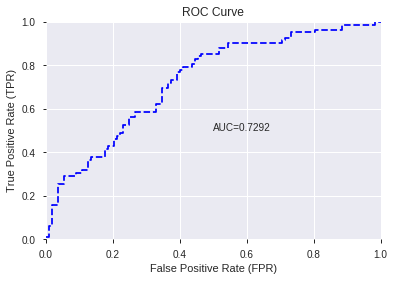

This function is available for GLM models only


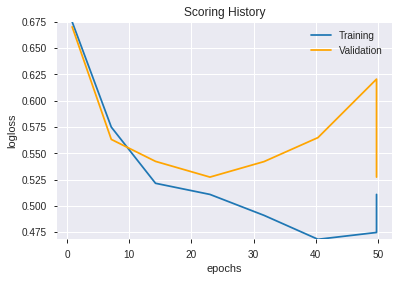

--2019-09-06 02:03:45--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.160.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.160.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190906_015542_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190906_015542_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLCLOSINGMARUBOZU',
 'BOP',
 'CDLSHORTLINE',
 'hour',
 'HT_TRENDMODE',
 'HT_PHASOR_inphase',
 'DIV',
 'TRANGE',
 'CDLEVENINGSTAR',
 'CORREL_8',
 'weekday_name',
 'Volume',
 'CDLSPINNINGTOP',
 'CDLSTALLEDPATTERN',
 'SUB',
 'TAN',
 'CDLTAKURI',
 'CDLHAMMER',
 'CDLLONGLINE',
 'CDLDRAGONFLYDOJI',
 'CDLHARAMI',
 'CDLRICKSHAWMAN',
 'CDLIDENTICAL3CROWS',
 'CDLRISEFALL3METHODS',
 'CDLGRAVESTONEDOJI',
 'CDL3BLACKCROWS',
 'CDLTASUKIGAP',
 'CDLENGULFING',
 'CDLHIKKAKE',
 'CDLMARUBOZU',
 'CDLHARAMICROSS',
 'CDLMORNINGSTAR',
 'is_month_start',
 'CDLSTICKSANDWICH',
 'CDLHOMINGPIGEON',
 'CDLSHOOTINGSTAR',
 'CDLGAPSIDESIDEWHITE',
 'CDLSEPARATINGLINES',
 'CDLADVANCEBLOCK',
 'CDLTHRUSTING',
 'CDLDARKCLOUDCOVER',
 'CDLHANGINGMAN',
 'is_month_end',
 'CDLHIKKAKEMOD',
 'CDLMATCHINGLOW',
 'CDLDOJISTAR',
 'CDL3INSIDE',
 'CDLMORNINGDOJISTAR',
 'CDLINVERTEDHAMMER',
 'CDL3LINESTRIKE']

In [11]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190906_020442_model_1,0.72855,0.601235,0.293554,0.454913,0.206945


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.810757,1.000000,0.152435
1,CDLCLOSINGMARUBOZU,0.518198,0.639153,0.097429
2,CDLSTALLEDPATTERN,0.268643,0.331349,0.050509
3,TAN,0.258455,0.318782,0.048594
4,CDLHAMMER,0.217470,0.268231,0.040888
5,CDLTAKURI,0.196896,0.242855,0.037020
6,DIV,0.172828,0.213169,0.032494
7,hour,0.168491,0.207820,0.031679
8,CDLMORNINGSTAR,0.168121,0.207363,0.031610
9,Volume,0.142552,0.175826,0.026802


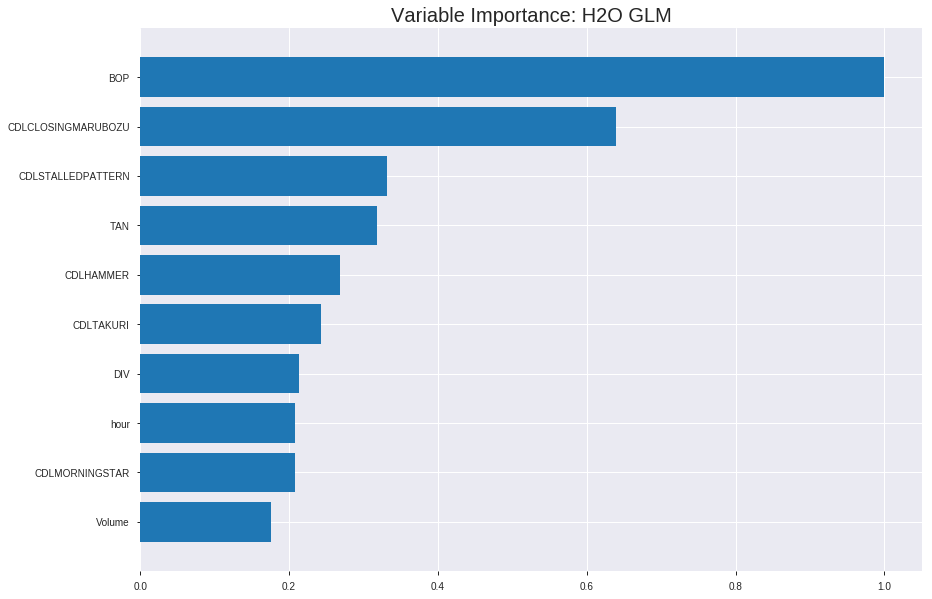

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190906_020442_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18593195288419423
RMSE: 0.4311982756043839
LogLoss: 0.5494455885382857
Null degrees of freedom: 1351
Residual degrees of freedom: 1301
Null deviance: 1872.112597686563
Residual deviance: 1485.7008714075243
AIC: 1587.7008714075243
AUC: 0.7920008241150078
pr_auc: 0.7690779799148849
Gini: 0.5840016482300157
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32520014621483373: 


,0,1,Error,Rate
0,333.0,370.0,0.5263,(370.0/703.0)
1,62.0,587.0,0.0955,(62.0/649.0)
Total,395.0,957.0,0.3195,(432.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3252001,0.7310087,272.0
max f2,0.1376562,0.8396547,352.0
max f0point5,0.6061716,0.7187113,139.0
max accuracy,0.4937193,0.7174556,191.0
max precision,0.9946103,1.0,0.0
max recall,0.0598607,1.0,380.0
max specificity,0.9946103,1.0,0.0
max absolute_mcc,0.4937193,0.4335940,191.0
max min_per_class_accuracy,0.4749460,0.7072419,199.0
max mean_per_class_accuracy,0.4937193,0.7165307,191.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9483589,1.6368039,1.6368039,0.7857143,0.9676563,0.7857143,0.9676563,0.0169492,0.0169492,63.6803874,63.6803874
,2,0.0207101,0.9329993,2.0832049,1.8600044,1.0,0.9401779,0.8928571,0.9539171,0.0215716,0.0385208,108.3204931,86.0004402
,3,0.0303254,0.9123876,2.0832049,1.9307753,1.0,0.9199058,0.9268293,0.9431330,0.0200308,0.0585516,108.3204931,93.0775302
,4,0.0406805,0.8943761,1.9344046,1.9316991,0.9285714,0.9035998,0.9272727,0.9330700,0.0200308,0.0785824,93.4404578,93.1699118
,5,0.0502959,0.8869421,1.7627119,1.8993927,0.8461538,0.8905649,0.9117647,0.9249440,0.0169492,0.0955316,76.2711864,89.9392731
,6,0.1005917,0.8283215,1.7768513,1.8381220,0.8529412,0.8595395,0.8823529,0.8922418,0.0893683,0.1848998,77.6851264,83.8121998
,7,0.1501479,0.7662826,1.7411862,1.8061284,0.8358209,0.7994632,0.8669951,0.8616203,0.0862866,0.2711864,74.1186211,80.6128413
,8,0.2004438,0.7059247,1.5930391,1.7526595,0.7647059,0.7388856,0.8413284,0.8308234,0.0801233,0.3513097,59.3039065,75.2659499
,9,0.3002959,0.6317799,1.4659590,1.6573281,0.7037037,0.6673280,0.7955665,0.7764591,0.1463790,0.4976888,46.5959025,65.7328061
,10,0.4001479,0.5536719,1.1727672,1.5364118,0.5629630,0.5912642,0.7375231,0.7302460,0.1171032,0.6147920,17.2767220,53.6411770




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1835355874005481
RMSE: 0.4284105360522172
LogLoss: 0.5445522085826078
Null degrees of freedom: 385
Residual degrees of freedom: 335
Null deviance: 534.6069507592587
Residual deviance: 420.3943050257732
AIC: 522.3943050257732
AUC: 0.8000268817204301
pr_auc: 0.7840440261340734
Gini: 0.6000537634408603
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32757101240697156: 


,0,1,Error,Rate
0,109.0,91.0,0.455,(91.0/200.0)
1,20.0,166.0,0.1075,(20.0/186.0)
Total,129.0,257.0,0.2876,(111.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3275710,0.7494357,256.0
max f2,0.2091452,0.8451369,314.0
max f0point5,0.6423563,0.7395498,108.0
max accuracy,0.5823994,0.7253886,139.0
max precision,0.9928043,1.0,0.0
max recall,0.0474715,1.0,376.0
max specificity,0.9928043,1.0,0.0
max absolute_mcc,0.3275710,0.4634058,256.0
max min_per_class_accuracy,0.4629565,0.7150538,188.0
max mean_per_class_accuracy,0.5392960,0.7225806,159.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 46.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9436845,2.0752688,2.0752688,1.0,0.9674487,1.0,0.9674487,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9273808,2.0752688,2.0752688,1.0,0.9363278,1.0,0.9518883,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9002271,2.0752688,2.0752688,1.0,0.9137700,1.0,0.9391822,0.0215054,0.0645161,107.5268817,107.5268817
,4,0.0414508,0.8894999,1.5564516,1.9455645,0.75,0.8933188,0.9375,0.9277164,0.0161290,0.0806452,55.6451613,94.5564516
,5,0.0518135,0.8775178,2.0752688,1.9715054,1.0,0.8838145,0.95,0.9189360,0.0215054,0.1021505,107.5268817,97.1505376
,6,0.1010363,0.8178075,1.6383701,1.8092087,0.7894737,0.8469631,0.8717949,0.8838723,0.0806452,0.1827957,63.8370119,80.9208712
,7,0.1502591,0.7540634,1.8568195,1.8248053,0.8947368,0.7833827,0.8793103,0.8509533,0.0913978,0.2741935,85.6819468,82.4805339
,8,0.2020725,0.7084537,1.7639785,1.8092087,0.85,0.7270226,0.8717949,0.8191762,0.0913978,0.3655914,76.3978495,80.9208712
,9,0.3005181,0.6311072,1.4745331,1.6995736,0.7105263,0.6694729,0.8189655,0.7701355,0.1451613,0.5107527,47.4533107,69.9573600
,10,0.4015544,0.5478798,1.1174524,1.5531044,0.5384615,0.5895731,0.7483871,0.7247036,0.1129032,0.6236559,11.7452440,55.3104405



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-09-06 02:04:42,0.000 sec,2,.19E2,51,1.3699509,1.3682448
,2019-09-06 02:04:42,0.027 sec,4,.12E2,51,1.3617362,1.3589162
,2019-09-06 02:04:42,0.052 sec,6,.72E1,51,1.3496011,1.3451418
,2019-09-06 02:04:42,0.077 sec,8,.45E1,51,1.3324330,1.3256541
,2019-09-06 02:04:43,0.093 sec,10,.28E1,51,1.3096308,1.2998057
---,---,---,---,---,---,---,---
,2019-09-06 02:04:43,0.276 sec,38,.35E-2,51,1.0982126,1.0893321
,2019-09-06 02:04:43,0.289 sec,39,.22E-2,51,1.0978477,1.0896269
,2019-09-06 02:04:43,0.298 sec,40,.14E-2,51,1.0976280,1.0898957
,2019-09-06 02:04:43,0.308 sec,41,.85E-3,51,1.0974928,1.0900932



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6855670103092784)

('F1', 0.6934673366834171)

('auc', 0.7285496515679443)

('logloss', 0.6012347046383374)

('mean_per_class_error', 0.2935540069686411)

('rmse', 0.4549125171066972)

('mse', 0.20694539822035107)

glm prediction progress: |████████████████████████████████████████████████| 100%


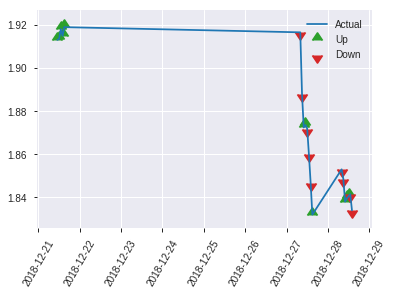


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20694539822035107
RMSE: 0.4549125171066972
LogLoss: 0.6012347046383374
Null degrees of freedom: 193
Residual degrees of freedom: 143
Null deviance: 266.85311025686934
Residual deviance: 233.27906539967492
AIC: 335.2790653996749
AUC: 0.7285496515679443
pr_auc: 0.6601360467221407
Gini: 0.45709930313588854
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35388726121591174: 


,0,1,Error,Rate
0,64.0,48.0,0.4286,(48.0/112.0)
1,13.0,69.0,0.1585,(13.0/82.0)
Total,77.0,117.0,0.3144,(61.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3538873,0.6934673,116.0
max f2,0.2029093,0.8041237,156.0
max f0point5,0.3538873,0.6272727,116.0
max accuracy,0.3538873,0.6855670,116.0
max precision,0.9549296,1.0,0.0
max recall,0.0261607,1.0,190.0
max specificity,0.9549296,1.0,0.0
max absolute_mcc,0.3538873,0.4168829,116.0
max min_per_class_accuracy,0.4474358,0.6463415,88.0
max mean_per_class_accuracy,0.3538873,0.7064460,116.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 43.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9242139,2.3658537,2.3658537,1.0,0.9529468,1.0,0.9529468,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9088858,2.3658537,2.3658537,1.0,0.9155649,1.0,0.9342559,0.0243902,0.0487805,136.5853659,136.5853659
,3,0.0309278,0.8987144,2.3658537,2.3658537,1.0,0.9076323,1.0,0.9253813,0.0243902,0.0731707,136.5853659,136.5853659
,4,0.0412371,0.8948631,1.1829268,2.0701220,0.5,0.8958089,0.875,0.9179882,0.0121951,0.0853659,18.2926829,107.0121951
,5,0.0515464,0.8835573,2.3658537,2.1292683,1.0,0.8921777,0.9,0.9128261,0.0243902,0.1097561,136.5853659,112.9268293
,6,0.1030928,0.8049042,2.1292683,2.1292683,0.9,0.8423681,0.9,0.8775971,0.1097561,0.2195122,112.9268293,112.9268293
,7,0.1494845,0.7025618,1.0514905,1.7947855,0.4444444,0.7380100,0.7586207,0.8342770,0.0487805,0.2682927,5.1490515,79.4785534
,8,0.2010309,0.6264787,0.9463415,1.5772358,0.4,0.6591705,0.6666667,0.7893779,0.0487805,0.3170732,-5.3658537,57.7235772
,9,0.2989691,0.5486903,1.3697047,1.5092515,0.5789474,0.5844785,0.6379310,0.7222557,0.1341463,0.4512195,36.9704750,50.9251472
,10,0.4020619,0.4833139,1.1829268,1.4255785,0.5,0.5159238,0.6025641,0.6693501,0.1219512,0.5731707,18.2926829,42.5578487


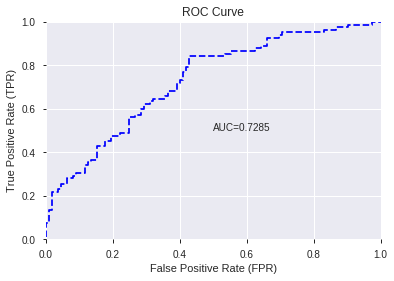

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


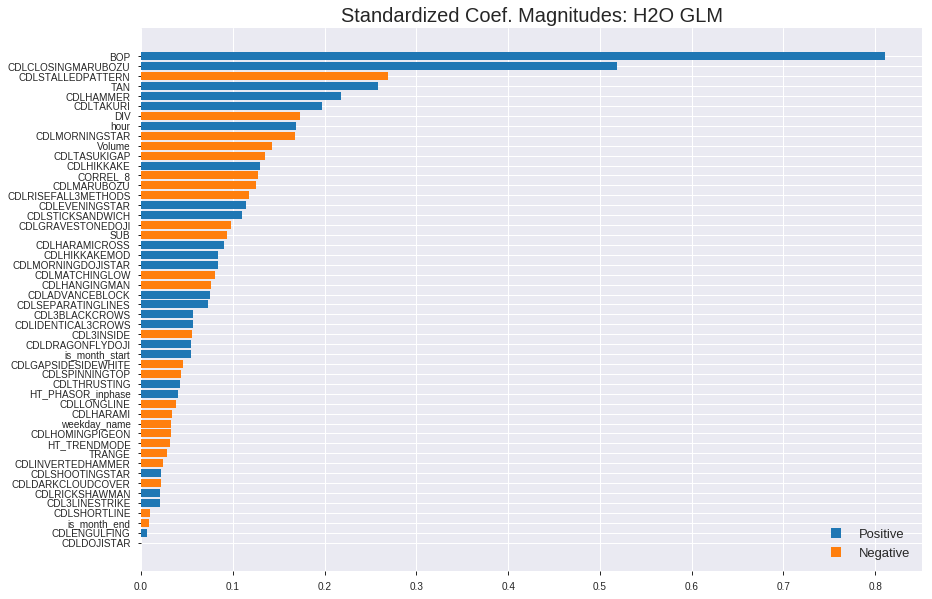

'log_likelihood'
--2019-09-06 02:04:52--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.81.8
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.81.8|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190906_020442_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190906_020442_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLSTALLEDPATTERN',
 'TAN',
 'CDLHAMMER',
 'CDLTAKURI',
 'DIV',
 'hour',
 'CDLMORNINGSTAR',
 'Volume',
 'CDLTASUKIGAP',
 'CDLHIKKAKE',
 'CORREL_8',
 'CDLMARUBOZU',
 'CDLRISEFALL3METHODS',
 'CDLEVENINGSTAR',
 'CDLSTICKSANDWICH',
 'CDLGRAVESTONEDOJI',
 'SUB',
 'CDLHARAMICROSS',
 'CDLHIKKAKEMOD',
 'CDLMORNINGDOJISTAR',
 'CDLMATCHINGLOW',
 'CDLHANGINGMAN',
 'CDLADVANCEBLOCK',
 'CDLSEPARATINGLINES',
 'CDL3BLACKCROWS',
 'CDLIDENTICAL3CROWS',
 'CDL3INSIDE',
 'CDLDRAGONFLYDOJI',
 'is_month_start',
 'CDLGAPSIDESIDEWHITE',
 'CDLSPINNINGTOP',
 'CDLTHRUSTING',
 'HT_PHASOR_inphase',
 'CDLLONGLINE',
 'CDLHARAMI',
 'weekday_name',
 'CDLHOMINGPIGEON',
 'HT_TRENDMODE',
 'TRANGE',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLDARKCLOUDCOVER',
 'CDLRICKSHAWMAN',
 'CDL3LINESTRIKE',
 'CDLSHORTLINE',
 'is_month_end',
 'CDLENGULFING',
 'CDLDOJISTAR']

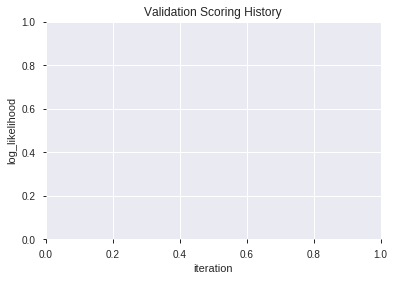

In [12]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190906_020549_model_3,0.718532,0.618768,0.340157,0.463591,0.214916
1,XGBoost_grid_1_AutoML_20190906_020549_model_1,0.718206,0.619456,0.340157,0.463355,0.214698
2,XGBoost_grid_1_AutoML_20190906_020549_model_5,0.713632,0.646666,0.302918,0.474282,0.224943
3,XGBoost_grid_1_AutoML_20190906_020549_model_2,0.712435,0.622355,0.326437,0.464452,0.215716
4,XGBoost_1_AutoML_20190906_020549,0.711672,0.631931,0.343423,0.467998,0.219022
5,XGBoost_grid_1_AutoML_20190906_020549_model_6,0.711346,0.623665,0.351154,0.463898,0.215201
6,XGBoost_3_AutoML_20190906_020549,0.702417,0.631748,0.326873,0.468814,0.219787
7,XGBoost_grid_1_AutoML_20190906_020549_model_7,0.700893,0.645686,0.361280,0.474339,0.224998
8,XGBoost_2_AutoML_20190906_020549,0.688480,0.640486,0.356381,0.473975,0.224653
9,XGBoost_grid_1_AutoML_20190906_020549_model_4,0.683471,0.641345,0.361280,0.474757,0.225394


,variable,relative_importance,scaled_importance,percentage
0,BOP,1248.309692,1.000000,0.229208
1,DIV,575.162109,0.460753,0.105608
2,TAN,573.769958,0.459638,0.105352
3,TRANGE,365.431030,0.292741,0.067098
4,CORREL_8,363.978851,0.291577,0.066832
5,CDLCLOSINGMARUBOZU,352.654175,0.282505,0.064752
6,HT_PHASOR_inphase,302.078094,0.241990,0.055466
7,hour,292.470825,0.234293,0.053702
8,Volume,292.400452,0.234237,0.053689
9,SUB,258.067017,0.206733,0.047385


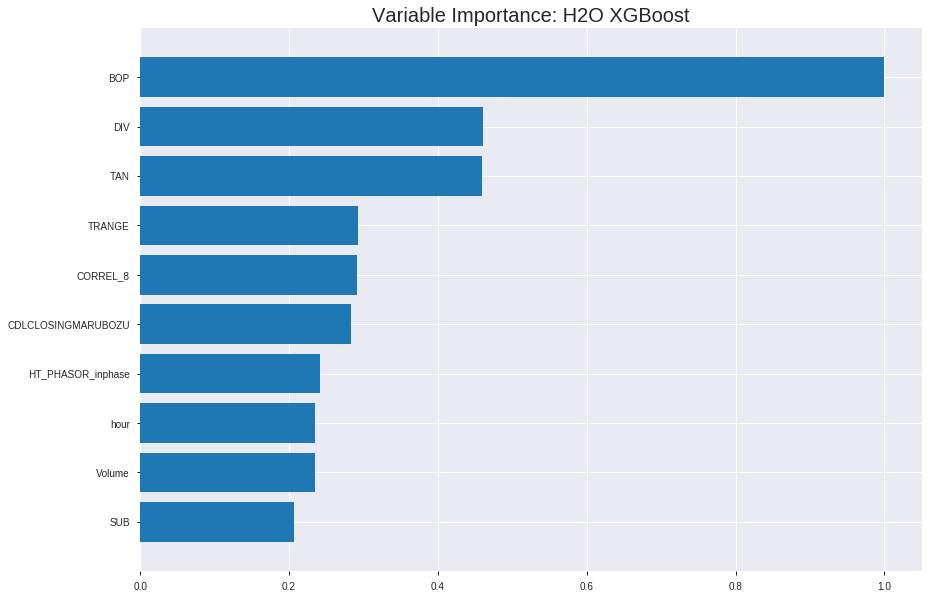

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190906_020549_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14472599356603333
RMSE: 0.3804286970853189
LogLoss: 0.45574270708558795
Mean Per-Class Error: 0.18721986117168987
AUC: 0.8930491597752972
pr_auc: 0.8832268016878416
Gini: 0.7860983195505944
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4593636095523834: 


,0,1,Error,Rate
0,550.0,153.0,0.2176,(153.0/703.0)
1,103.0,546.0,0.1587,(103.0/649.0)
Total,653.0,699.0,0.1893,(256.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4593636,0.8100890,215.0
max f2,0.2896818,0.8762170,297.0
max f0point5,0.5581296,0.8324459,168.0
max accuracy,0.5486886,0.8150888,173.0
max precision,0.9520848,1.0,0.0
max recall,0.1692146,1.0,354.0
max specificity,0.9520848,1.0,0.0
max absolute_mcc,0.5486886,0.6333203,173.0
max min_per_class_accuracy,0.4878067,0.8104777,201.0
max mean_per_class_accuracy,0.5193523,0.8127801,186.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9193886,2.0832049,2.0832049,1.0,0.9345120,1.0,0.9345120,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9073463,2.0832049,2.0832049,1.0,0.9138556,1.0,0.9241838,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.8943040,2.0832049,2.0832049,1.0,0.9015329,1.0,0.9170018,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.8816253,2.0832049,2.0832049,1.0,0.8852900,1.0,0.9089297,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.8691014,2.0832049,2.0832049,1.0,0.8752310,1.0,0.9024873,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.8207461,1.9912988,2.0372519,0.9558824,0.8446860,0.9779412,0.8735867,0.1001541,0.2049307,99.1298831,103.7251881
,7,0.1501479,0.7690868,1.8655567,1.9805840,0.8955224,0.7943322,0.9507389,0.8474288,0.0924499,0.2973806,86.5556654,98.0583998
,8,0.2004438,0.7248494,1.8993927,1.9602113,0.9117647,0.7493467,0.9409594,0.8228178,0.0955316,0.3929122,89.9392731,96.0211282
,9,0.3002959,0.6377012,1.6974262,1.8728320,0.8148148,0.6799404,0.8990148,0.7753093,0.1694915,0.5624037,69.7426240,87.2832019
,10,0.4001479,0.5577317,1.5894082,1.8021070,0.7629630,0.5971594,0.8650647,0.7308541,0.1587057,0.7211094,58.9408206,80.2107038




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1734778867014219
RMSE: 0.4165067666934379
LogLoss: 0.5252813688240497
Mean Per-Class Error: 0.24521505376344088
AUC: 0.8230913978494624
pr_auc: 0.7686706709879668
Gini: 0.6461827956989248
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35038870573043823: 


,0,1,Error,Rate
0,126.0,74.0,0.37,(74.0/200.0)
1,24.0,162.0,0.129,(24.0/186.0)
Total,150.0,236.0,0.2539,(98.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3503887,0.7677725,235.0
max f2,0.2142456,0.8540076,303.0
max f0point5,0.5320691,0.7566586,159.0
max accuracy,0.4459562,0.7538860,198.0
max precision,0.9381143,1.0,0.0
max recall,0.0803744,1.0,377.0
max specificity,0.9381143,1.0,0.0
max absolute_mcc,0.3503887,0.5135463,235.0
max min_per_class_accuracy,0.4619856,0.7473118,188.0
max mean_per_class_accuracy,0.4459562,0.7547849,198.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 46.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9108164,1.5564516,1.5564516,0.75,0.9265580,0.75,0.9265580,0.0161290,0.0161290,55.6451613,55.6451613
,2,0.0207254,0.8982979,1.5564516,1.5564516,0.75,0.9045287,0.75,0.9155433,0.0161290,0.0322581,55.6451613,55.6451613
,3,0.0310881,0.8819673,1.5564516,1.5564516,0.75,0.8911636,0.75,0.9074168,0.0161290,0.0483871,55.6451613,55.6451613
,4,0.0414508,0.8651029,2.0752688,1.6861559,1.0,0.8732053,0.8125,0.8988639,0.0215054,0.0698925,107.5268817,68.6155914
,5,0.0518135,0.8535153,1.5564516,1.6602151,0.75,0.8575604,0.8,0.8906032,0.0161290,0.0860215,55.6451613,66.0215054
,6,0.1010363,0.7977607,1.9660441,1.8092087,0.9473684,0.8236942,0.8717949,0.8580065,0.0967742,0.1827957,96.6044143,80.9208712
,7,0.1502591,0.7586946,1.6383701,1.7532443,0.7894737,0.7802746,0.8448276,0.8325426,0.0806452,0.2634409,63.8370119,75.3244346
,8,0.2020725,0.7252072,1.5564516,1.7027847,0.75,0.7402581,0.8205128,0.8088799,0.0806452,0.3440860,55.6451613,70.2784671
,9,0.3005181,0.6460771,1.8022071,1.7353541,0.8684211,0.6840602,0.8362069,0.7679907,0.1774194,0.5215054,80.2207131,73.5354097
,10,0.4015544,0.5362548,1.2238765,1.6066597,0.5897436,0.5986185,0.7741935,0.7253744,0.1236559,0.6451613,22.3876482,60.6659729



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:06:05,2.337 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5199704,0.5,0.6931472,0.5,0.0,1.0,0.5181347
,2019-09-06 02:06:05,2.395 sec,5.0,0.4743983,0.6428970,0.8133336,0.8002529,2.0832049,0.2803254,0.4723394,0.6389613,0.8215591,0.7733285,1.5564516,0.2331606
,2019-09-06 02:06:05,2.443 sec,10.0,0.4571155,0.6094883,0.8298378,0.8151168,2.0832049,0.2596154,0.4581865,0.6115272,0.8203629,0.7801060,2.0752688,0.2616580
,2019-09-06 02:06:05,2.491 sec,15.0,0.4424003,0.5808665,0.8410094,0.8271899,2.0832049,0.2492604,0.4436249,0.5831617,0.8247043,0.7858258,2.0752688,0.2383420
,2019-09-06 02:06:05,2.547 sec,20.0,0.4304386,0.5571547,0.8462269,0.8368354,2.0832049,0.25,0.4349815,0.5657041,0.8213844,0.7700958,1.5564516,0.2512953
,2019-09-06 02:06:05,2.613 sec,25.0,0.4207189,0.5376362,0.8539388,0.8418638,2.0832049,0.2426036,0.4279106,0.5511275,0.8259543,0.7779628,1.5564516,0.2564767
,2019-09-06 02:06:05,2.668 sec,30.0,0.4145686,0.5248877,0.8568539,0.8462179,2.0832049,0.2233728,0.4230063,0.5410689,0.8294489,0.7865776,2.0752688,0.2590674
,2019-09-06 02:06:05,2.729 sec,35.0,0.4086902,0.5128356,0.8625098,0.8517992,2.0832049,0.2152367,0.4212730,0.5370331,0.8282258,0.7839387,2.0752688,0.2512953
,2019-09-06 02:06:05,2.781 sec,40.0,0.4047916,0.5045095,0.8657164,0.8552346,2.0832049,0.2181953,0.4190797,0.5324358,0.8291129,0.7834827,2.0752688,0.2538860
,2019-09-06 02:06:05,2.840 sec,45.0,0.3991564,0.4931106,0.8720222,0.8622196,2.0832049,0.2189349,0.4182192,0.5302474,0.8274194,0.7774765,1.5564516,0.2383420


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1248.3096924,1.0,0.2292076
DIV,575.1621094,0.4607527,0.1056080
TAN,573.7699585,0.4596375,0.1053524
TRANGE,365.4310303,0.2927407,0.0670984
CORREL_8,363.9788513,0.2915774,0.0668317
---,---,---,---
CDLENGULFING,11.4629211,0.0091828,0.0021048
CDLHANGINGMAN,7.5882740,0.0060788,0.0013933
is_month_end,3.6872106,0.0029538,0.0006770
CDLHARAMICROSS,3.6132209,0.0028945,0.0006634



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6752577319587629)

('F1', 0.672566371681416)

('auc', 0.7185322299651568)

('logloss', 0.6187683041543005)

('mean_per_class_error', 0.3155487804878049)

('rmse', 0.4635908071218106)

('mse', 0.2149164364478518)

xgboost prediction progress: |████████████████████████████████████████████| 100%


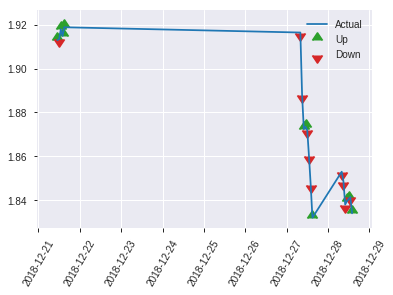


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2149164364478518
RMSE: 0.4635908071218106
LogLoss: 0.6187683041543005
Mean Per-Class Error: 0.3155487804878049
AUC: 0.7185322299651568
pr_auc: 0.6038268845061007
Gini: 0.4370644599303135
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24645066261291504: 


,0,1,Error,Rate
0,44.0,68.0,0.6071,(68.0/112.0)
1,6.0,76.0,0.0732,(6.0/82.0)
Total,50.0,144.0,0.3814,(74.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2464507,0.6725664,143.0
max f2,0.1980506,0.8074534,154.0
max f0point5,0.3766719,0.6174089,102.0
max accuracy,0.3811484,0.6752577,100.0
max precision,0.9298251,1.0,0.0
max recall,0.1107816,1.0,181.0
max specificity,0.9298251,1.0,0.0
max absolute_mcc,0.3228440,0.3693743,114.0
max min_per_class_accuracy,0.4101056,0.6696429,91.0
max mean_per_class_accuracy,0.3766719,0.6844512,102.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 41.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9175415,2.3658537,2.3658537,1.0,0.9277814,1.0,0.9277814,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9040850,0.0,1.1829268,0.0,0.9160696,0.5,0.9219255,0.0,0.0243902,-100.0,18.2926829
,3,0.0309278,0.8998883,2.3658537,1.5772358,1.0,0.9019991,0.6666667,0.9152834,0.0243902,0.0487805,136.5853659,57.7235772
,4,0.0412371,0.8776497,1.1829268,1.4786585,0.5,0.8899015,0.625,0.9089379,0.0121951,0.0609756,18.2926829,47.8658537
,5,0.0515464,0.8716855,2.3658537,1.6560976,1.0,0.8742115,0.7,0.9019926,0.0243902,0.0853659,136.5853659,65.6097561
,6,0.1030928,0.7644826,1.6560976,1.6560976,0.7,0.8189366,0.7,0.8604646,0.0853659,0.1707317,65.6097561,65.6097561
,7,0.1494845,0.7194908,1.5772358,1.6316232,0.6666667,0.7349888,0.6896552,0.8215238,0.0731707,0.2439024,57.7235772,63.1623213
,8,0.2010309,0.6482032,1.4195122,1.5772358,0.6,0.6758644,0.6666667,0.7841753,0.0731707,0.3170732,41.9512195,57.7235772
,9,0.2989691,0.5136359,1.1206675,1.4276703,0.4736842,0.5760965,0.6034483,0.7160115,0.1097561,0.4268293,12.0667522,42.7670311
,10,0.4020619,0.4532745,1.3012195,1.3952470,0.55,0.4784530,0.5897436,0.6550991,0.1341463,0.5609756,30.1219512,39.5247029


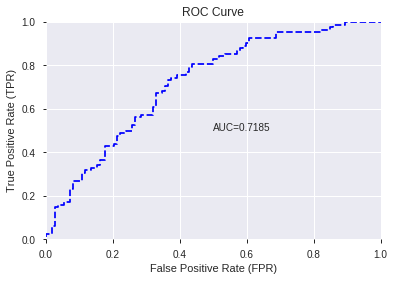

This function is available for GLM models only


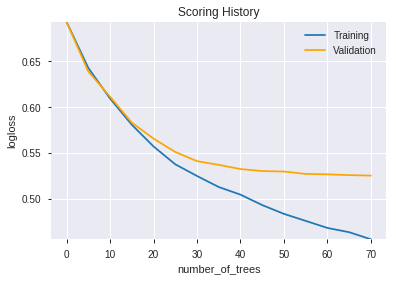

--2019-09-06 02:06:22--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.145.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.145.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190906_020549_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190906_020549_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'TAN',
 'TRANGE',
 'CORREL_8',
 'CDLCLOSINGMARUBOZU',
 'HT_PHASOR_inphase',
 'hour',
 'Volume',
 'SUB',
 'CDLHAMMER',
 'CDLLONGLINE',
 'CDLSHORTLINE',
 'weekday_name',
 'CDLTAKURI',
 'CDLHARAMI',
 'CDLDRAGONFLYDOJI',
 'CDLHIKKAKE',
 'CDLSPINNINGTOP',
 'CDLDOJISTAR',
 'CDLGRAVESTONEDOJI',
 'HT_TRENDMODE',
 'CDLMARUBOZU',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'is_month_end',
 'CDLHARAMICROSS',
 'is_month_start']

In [13]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190906_020719_model_1,0.721799,0.619784,0.330902,0.462939,0.214312


,variable,relative_importance,scaled_importance,percentage
0,BOP,4.832450e-01,1.000000e+00,2.507743e-02
1,CDLCLOSINGMARUBOZU,3.379165e-01,6.992654e-01,1.753578e-02
2,ADOSC,1.848808e-01,3.825820e-01,9.594170e-03
3,CORREL_8,1.848611e-01,3.825411e-01,9.593147e-03
4,CDLSTALLEDPATTERN,1.724535e-01,3.568655e-01,8.949269e-03
5,ULTOSC,1.713332e-01,3.545473e-01,8.891132e-03
6,CDLHAMMER,1.647971e-01,3.410219e-01,8.551950e-03
7,CDLTAKURI,1.450980e-01,3.002576e-01,7.529687e-03
8,CDLHIGHWAVE,1.446504e-01,2.993314e-01,7.506462e-03
9,Volume,1.398404e-01,2.893778e-01,7.256850e-03


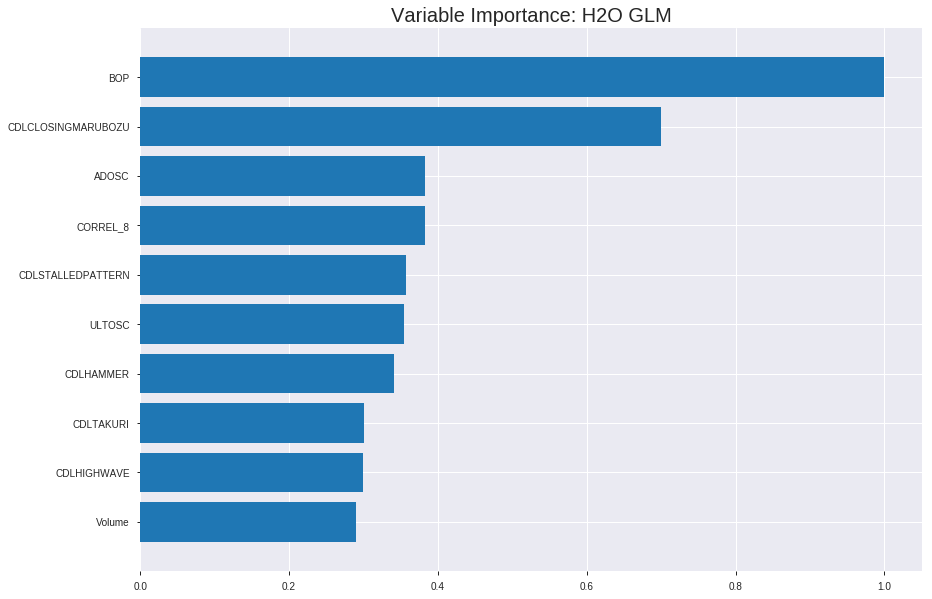

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190906_020719_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.17076951739197227
RMSE: 0.41324268582997603
LogLoss: 0.5144399817891299
Null degrees of freedom: 1351
Residual degrees of freedom: 319
Null deviance: 1872.112597686563
Residual deviance: 1391.0457107578072
AIC: 3457.0457107578072
AUC: 0.8290355881792099
pr_auc: 0.8012335584117929
Gini: 0.6580711763584197
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4069044810940676: 


,0,1,Error,Rate
0,456.0,247.0,0.3514,(247.0/703.0)
1,99.0,550.0,0.1525,(99.0/649.0)
Total,555.0,797.0,0.2559,(346.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4069045,0.7607192,235.0
max f2,0.2769741,0.8514742,296.0
max f0point5,0.5063848,0.7559081,188.0
max accuracy,0.5063848,0.7596154,188.0
max precision,0.9775284,1.0,0.0
max recall,0.0637784,1.0,379.0
max specificity,0.9775284,1.0,0.0
max absolute_mcc,0.5063848,0.5182186,188.0
max min_per_class_accuracy,0.4787484,0.7496444,202.0
max mean_per_class_accuracy,0.5042061,0.7581365,189.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9378756,1.7856042,1.7856042,0.8571429,0.9558201,0.8571429,0.9558201,0.0184900,0.0184900,78.5604226,78.5604226
,2,0.0207101,0.9217118,1.9344046,1.8600044,0.9285714,0.9296192,0.8928571,0.9427196,0.0200308,0.0385208,93.4404578,86.0004402
,3,0.0303254,0.9040243,1.7627119,1.8291555,0.8461538,0.9123905,0.8780488,0.9331031,0.0169492,0.0554700,76.2711864,82.9155549
,4,0.0406805,0.8945072,1.9344046,1.8559462,0.9285714,0.8994356,0.8909091,0.9245332,0.0200308,0.0755008,93.4404578,85.5946211
,5,0.0502959,0.8791061,2.0832049,1.8993927,1.0,0.8872607,0.9117647,0.9174075,0.0200308,0.0955316,108.3204931,89.9392731
,6,0.1005917,0.8206167,1.9606635,1.9300281,0.9411765,0.8497606,0.9264706,0.8835841,0.0986133,0.1941448,96.0663464,93.0028098
,7,0.1501479,0.7671984,1.8344640,1.8984873,0.8805970,0.7938967,0.9113300,0.8539828,0.0909091,0.2850539,83.4464043,89.8487252
,8,0.2004438,0.7206969,1.5011330,1.7987821,0.7205882,0.7406379,0.8634686,0.8255420,0.0755008,0.3605547,50.1132965,79.8782117
,9,0.3002959,0.6373143,1.4968213,1.6983764,0.7185185,0.6789466,0.8152709,0.7767972,0.1494607,0.5100154,49.6821321,69.8376434
,10,0.4001479,0.5496665,1.4196656,1.6288275,0.6814815,0.5929259,0.7818854,0.7309144,0.1417565,0.6517720,41.9665582,62.8827515




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18540854652515262
RMSE: 0.4305909271282346
LogLoss: 0.547946147155914
Null degrees of freedom: 385
Residual degrees of freedom: -647
Null deviance: 534.6069507592587
Residual deviance: 423.01442560436556
AIC: 2489.0144256043654
AUC: 0.7929569892473118
pr_auc: 0.7801043170684397
Gini: 0.5859139784946237
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35294417930668437: 


,0,1,Error,Rate
0,111.0,89.0,0.445,(89.0/200.0)
1,26.0,160.0,0.1398,(26.0/186.0)
Total,137.0,249.0,0.2979,(115.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3529442,0.7356322,248.0
max f2,0.2590880,0.8437801,292.0
max f0point5,0.5800509,0.7277628,138.0
max accuracy,0.5336955,0.7202073,165.0
max precision,0.9678137,1.0,0.0
max recall,0.0616135,1.0,379.0
max specificity,0.9678137,1.0,0.0
max absolute_mcc,0.5800509,0.4430608,138.0
max min_per_class_accuracy,0.4763259,0.72,189.0
max mean_per_class_accuracy,0.4763259,0.7202151,189.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 48.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9466066,2.0752688,2.0752688,1.0,0.9564103,1.0,0.9564103,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9197684,2.0752688,2.0752688,1.0,0.9399458,1.0,0.9481781,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9059872,2.0752688,2.0752688,1.0,0.9106301,1.0,0.9356621,0.0215054,0.0645161,107.5268817,107.5268817
,4,0.0414508,0.8969227,2.0752688,2.0752688,1.0,0.9031652,1.0,0.9275379,0.0215054,0.0860215,107.5268817,107.5268817
,5,0.0518135,0.8725624,1.5564516,1.9715054,0.75,0.8857010,0.95,0.9191705,0.0161290,0.1021505,55.6451613,97.1505376
,6,0.1010363,0.8285631,1.8568195,1.9156328,0.8947368,0.8517848,0.9230769,0.8863416,0.0913978,0.1935484,85.6819468,91.5632754
,7,0.1502591,0.7806114,1.8568195,1.8963663,0.8947368,0.8083173,0.9137931,0.8607819,0.0913978,0.2849462,85.6819468,89.6366333
,8,0.2020725,0.7338104,1.5564516,1.8092087,0.75,0.7544957,0.8717949,0.8335290,0.0806452,0.3655914,55.6451613,80.9208712
,9,0.3005181,0.6519245,1.2014714,1.6101224,0.5789474,0.6930161,0.7758621,0.7874989,0.1182796,0.4838710,20.1471420,61.0122358
,10,0.4015544,0.5526339,1.2770885,1.5263267,0.6153846,0.5918924,0.7354839,0.7382818,0.1290323,0.6129032,27.7088503,52.6326743



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-09-06 02:07:22,0.000 sec,2,.19E2,950,1.3586721,1.3546535
,2019-09-06 02:07:23,1.555 sec,4,.14E2,956,1.3511399,1.3464200
,2019-09-06 02:07:25,3.070 sec,6,.99E1,974,1.3417976,1.3364036
,2019-09-06 02:07:26,4.722 sec,8,.72E1,1007,1.3303462,1.3242729
,2019-09-06 02:07:28,6.255 sec,10,.53E1,1019,1.3165782,1.3098400
---,---,---,---,---,---,---,---
,2019-09-06 02:07:54,32.352 sec,44,.24E-1,1033,1.0180354,1.0966304
,2019-09-06 02:07:56,33.877 sec,46,.17E-1,1033,1.0078338,1.0987870
,2019-09-06 02:07:57,35.403 sec,48,.13E-1,1033,0.9981652,1.1026443
,2019-09-06 02:07:59,36.962 sec,50,.92E-2,1033,0.9888495,1.1082546



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6855670103092784)

('F1', 0.6634146341463415)

('auc', 0.7217987804878049)

('logloss', 0.6197836792318685)

('mean_per_class_error', 0.32088414634146334)

('rmse', 0.46293851627267657)

('mse', 0.2143120698487472)

glm prediction progress: |████████████████████████████████████████████████| 100%


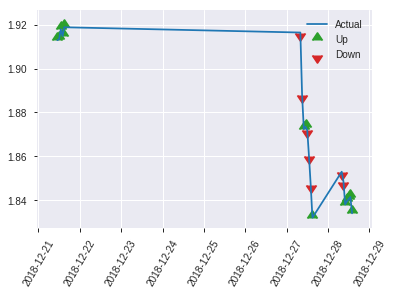


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2143120698487472
RMSE: 0.46293851627267657
LogLoss: 0.6197836792318685
Null degrees of freedom: 193
Residual degrees of freedom: -839
Null deviance: 266.85311025686934
Residual deviance: 240.47606754196497
AIC: 2306.4760675419648
AUC: 0.7217987804878049
pr_auc: 0.6323394403218034
Gini: 0.44359756097560976
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4049948496445182: 


,0,1,Error,Rate
0,57.0,55.0,0.4911,(55.0/112.0)
1,14.0,68.0,0.1707,(14.0/82.0)
Total,71.0,123.0,0.3557,(69.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4049948,0.6634146,122.0
max f2,0.1427341,0.8019802,176.0
max f0point5,0.5698813,0.6286550,64.0
max accuracy,0.5698813,0.6855670,64.0
max precision,0.9688395,1.0,0.0
max recall,0.0426291,1.0,189.0
max specificity,0.9688395,1.0,0.0
max absolute_mcc,0.4536214,0.3560119,108.0
max min_per_class_accuracy,0.5142336,0.6707317,89.0
max mean_per_class_accuracy,0.5142336,0.6791159,89.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 47.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9458695,2.3658537,2.3658537,1.0,0.9587734,1.0,0.9587734,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9182379,1.1829268,1.7743902,0.5,0.9412235,0.75,0.9499985,0.0121951,0.0365854,18.2926829,77.4390244
,3,0.0309278,0.9102216,1.1829268,1.5772358,0.5,0.9129015,0.6666667,0.9376328,0.0121951,0.0487805,18.2926829,57.7235772
,4,0.0412371,0.8956347,2.3658537,1.7743902,1.0,0.9034111,0.75,0.9290774,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.8928712,2.3658537,1.8926829,1.0,0.8950369,0.8,0.9222693,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.7999331,2.1292683,2.0109756,0.9,0.8469263,0.85,0.8845978,0.1097561,0.2073171,112.9268293,101.0975610
,7,0.1494845,0.7345789,0.7886179,1.6316232,0.3333333,0.7659036,0.6896552,0.8477616,0.0365854,0.2439024,-21.1382114,63.1623213
,8,0.2010309,0.6843712,1.4195122,1.5772358,0.6,0.7141954,0.6666667,0.8135139,0.0731707,0.3170732,41.9512195,57.7235772
,9,0.2989691,0.5936056,1.4942234,1.5500421,0.6315789,0.6221084,0.6551724,0.7508121,0.1463415,0.4634146,49.4223363,55.0042052
,10,0.4020619,0.5394202,1.0646341,1.4255785,0.45,0.5612386,0.6025641,0.7022035,0.1097561,0.5731707,6.4634146,42.5578487


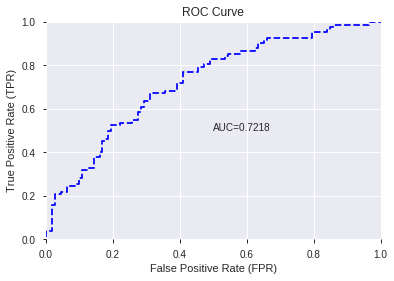

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


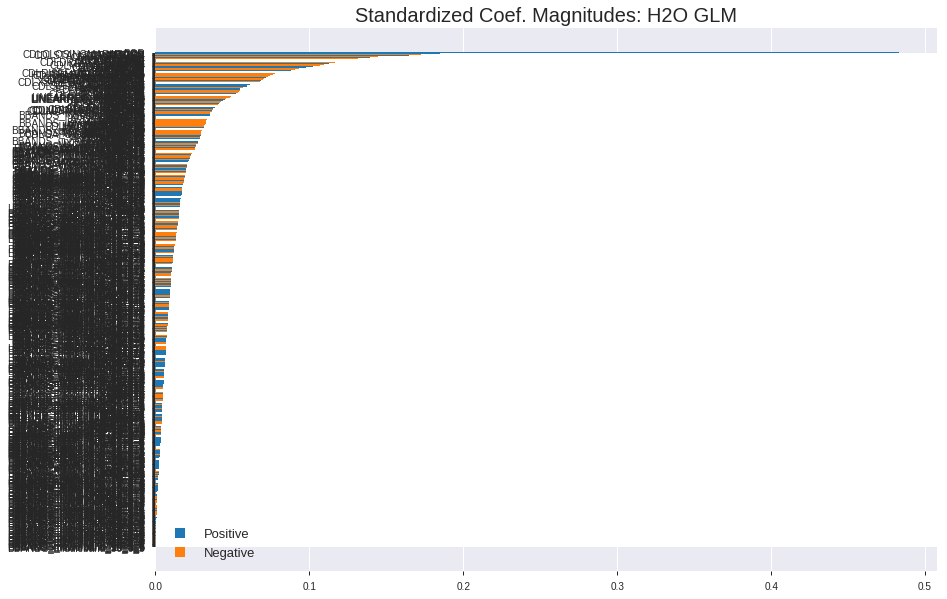

'log_likelihood'
--2019-09-06 02:08:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.35
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.35|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190906_020719_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190906_020719_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

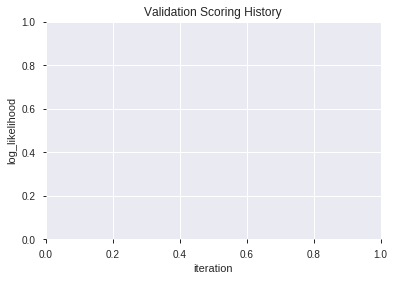

In [14]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [15]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [16]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [17]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190906_020924_model_3,0.728005,0.613370,0.339830,0.458859,0.210552
1,XGBoost_grid_1_AutoML_20190906_020924_model_7,0.707644,0.627447,0.326873,0.466958,0.218050
2,XGBoost_1_AutoML_20190906_020924,0.704159,0.628848,0.308689,0.467181,0.218258
3,XGBoost_3_AutoML_20190906_020924,0.702635,0.623444,0.311084,0.465787,0.216958
4,XGBoost_grid_1_AutoML_20190906_020924_model_6,0.696646,0.624384,0.353985,0.466154,0.217300
5,XGBoost_2_AutoML_20190906_020924,0.696320,0.628534,0.383166,0.466902,0.217997
6,XGBoost_grid_1_AutoML_20190906_020924_model_1,0.694033,0.635222,0.373040,0.470483,0.221354
7,XGBoost_grid_1_AutoML_20190906_020924_model_2,0.692509,0.624411,0.343532,0.466307,0.217442
8,XGBoost_grid_1_AutoML_20190906_020924_model_4,0.688153,0.633886,0.384364,0.470635,0.221497
9,XGBoost_grid_1_AutoML_20190906_020924_model_5,0.687936,0.631193,0.329813,0.468248,0.219256


,variable,relative_importance,scaled_importance,percentage
0,BOP,945.735168,1.000000,0.123038
1,DIV,432.092377,0.456885,0.056214
2,CDLCLOSINGMARUBOZU,237.112976,0.250718,0.030848
3,TRANGE,198.662445,0.210061,0.025845
4,STOCHF_fastk,197.222321,0.208539,0.025658
5,hour,178.232040,0.188459,0.023188
6,SUB,147.979492,0.156470,0.019252
7,WILLR_8,127.115913,0.134410,0.016537
8,Volume,114.674568,0.121254,0.014919
9,STOCHRSI_fastd,93.981682,0.099374,0.012227


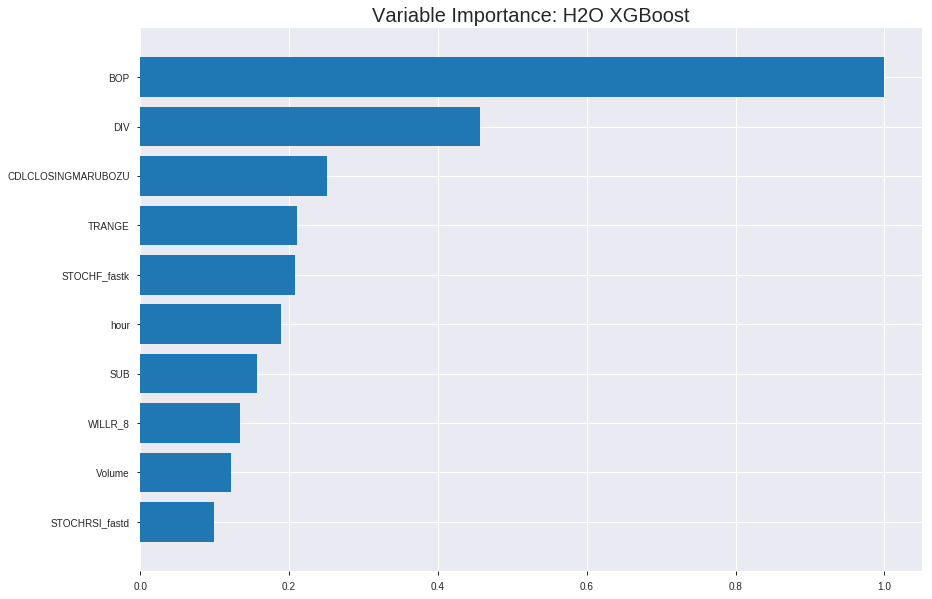

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190906_020924_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.11328427677233763
RMSE: 0.33657729687597415
LogLoss: 0.3853068272489545
Mean Per-Class Error: 0.1159251458091779
AUC: 0.9569235523740429
pr_auc: 0.9551499942989047
Gini: 0.9138471047480858
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47489994764328003: 


,0,1,Error,Rate
0,618.0,85.0,0.1209,(85.0/703.0)
1,72.0,577.0,0.1109,(72.0/649.0)
Total,690.0,662.0,0.1161,(157.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4748999,0.8802441,205.0
max f2,0.3529094,0.9168598,262.0
max f0point5,0.5835943,0.9095921,158.0
max accuracy,0.4748999,0.8838757,205.0
max precision,0.9564133,1.0,0.0
max recall,0.2232581,1.0,323.0
max specificity,0.9564133,1.0,0.0
max absolute_mcc,0.4748999,0.7677014,205.0
max min_per_class_accuracy,0.4819129,0.8798151,202.0
max mean_per_class_accuracy,0.4748999,0.8840749,205.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9297743,2.0832049,2.0832049,1.0,0.9371466,1.0,0.9371466,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9121224,2.0832049,2.0832049,1.0,0.9197783,1.0,0.9284625,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.8968424,2.0832049,2.0832049,1.0,0.9053093,1.0,0.9211212,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.8871960,2.0832049,2.0832049,1.0,0.8911873,1.0,0.9135017,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.8783494,2.0832049,2.0832049,1.0,0.8825504,1.0,0.9075845,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.8280087,2.0832049,2.0832049,1.0,0.8543534,1.0,0.8809690,0.1047766,0.2095532,108.3204931,108.3204931
,7,0.1501479,0.7859118,2.0521123,2.0729428,0.9850746,0.8045867,0.9950739,0.8557590,0.1016949,0.3112481,105.2112320,107.2942837
,8,0.2004438,0.7418505,2.0525696,2.0678307,0.9852941,0.7644205,0.9926199,0.8328402,0.1032357,0.4144838,105.2569564,106.7830725
,9,0.3002959,0.6607984,2.0060492,2.0472876,0.9629630,0.7005442,0.9827586,0.7888501,0.2003082,0.6147920,100.6049192,104.7287604
,10,0.4001479,0.5639338,1.6974262,1.9599839,0.8148148,0.6134085,0.9408503,0.7450708,0.1694915,0.7842835,69.7426240,95.9983937




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1889444124937262
RMSE: 0.4346773659781772
LogLoss: 0.5597090567039565
Mean Per-Class Error: 0.2698387096774193
AUC: 0.7967204301075269
pr_auc: 0.7627209277049642
Gini: 0.5934408602150538
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30908313393592834: 


,0,1,Error,Rate
0,122.0,78.0,0.39,(78.0/200.0)
1,28.0,158.0,0.1505,(28.0/186.0)
Total,150.0,236.0,0.2746,(106.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3090831,0.7488152,235.0
max f2,0.1379273,0.8409506,349.0
max f0point5,0.4687294,0.7299270,158.0
max accuracy,0.4687294,0.7279793,158.0
max precision,0.9184344,1.0,0.0
max recall,0.0865020,1.0,381.0
max specificity,0.9184344,1.0,0.0
max absolute_mcc,0.3090831,0.4709988,235.0
max min_per_class_accuracy,0.4184567,0.7150538,187.0
max mean_per_class_accuracy,0.3735304,0.7301613,212.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 42.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.8878423,1.5564516,1.5564516,0.75,0.9130152,0.75,0.9130152,0.0161290,0.0161290,55.6451613,55.6451613
,2,0.0207254,0.8701071,2.0752688,1.8158602,1.0,0.8769681,0.875,0.8949917,0.0215054,0.0376344,107.5268817,81.5860215
,3,0.0310881,0.8559335,2.0752688,1.9023297,1.0,0.8628395,0.9166667,0.8842743,0.0215054,0.0591398,107.5268817,90.2329749
,4,0.0414508,0.8331622,2.0752688,1.9455645,1.0,0.8456613,0.9375,0.8746210,0.0215054,0.0806452,107.5268817,94.5564516
,5,0.0518135,0.8203289,2.0752688,1.9715054,1.0,0.8250720,0.95,0.8647112,0.0215054,0.1021505,107.5268817,97.1505376
,6,0.1010363,0.7619454,1.6383701,1.8092087,0.7894737,0.7890823,0.8717949,0.8278663,0.0806452,0.1827957,63.8370119,80.9208712
,7,0.1502591,0.6923139,1.5291454,1.7174638,0.7368421,0.7305271,0.8275862,0.7959793,0.0752688,0.2580645,52.9145444,71.7463849
,8,0.2020725,0.6535608,1.5564516,1.6761787,0.75,0.6720405,0.8076923,0.7642002,0.0806452,0.3387097,55.6451613,67.6178660
,9,0.3005181,0.5631264,1.6929825,1.6816834,0.8157895,0.6063039,0.8103448,0.7124755,0.1666667,0.5053763,69.2982456,68.1683352
,10,0.4015544,0.4732600,1.2238765,1.5664932,0.5897436,0.5154197,0.7548387,0.6628938,0.1236559,0.6290323,22.3876482,56.6493236



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:09:45,6.906 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5199704,0.5,0.6931472,0.5,0.0,1.0,0.5181347
,2019-09-06 02:09:46,7.574 sec,5.0,0.4721074,0.6385894,0.8506752,0.8464343,2.0832049,0.2344675,0.4806718,0.6549928,0.7612634,0.7298180,1.5564516,0.2746114
,2019-09-06 02:09:46,7.992 sec,10.0,0.4476168,0.5920181,0.8754688,0.8754450,2.0832049,0.2189349,0.4624103,0.6194102,0.7913172,0.7398780,1.5564516,0.2616580
,2019-09-06 02:09:46,8.269 sec,15.0,0.4314218,0.5613250,0.8849395,0.8848108,2.0832049,0.2189349,0.4526905,0.6000330,0.7906720,0.7433832,2.0752688,0.2772021
,2019-09-06 02:09:46,8.539 sec,20.0,0.4164214,0.5329694,0.8971884,0.8960257,2.0832049,0.1886095,0.4464289,0.5871502,0.7951075,0.7583218,2.0752688,0.2668394
,2019-09-06 02:09:47,8.829 sec,25.0,0.4036148,0.5087422,0.9065123,0.9066540,2.0832049,0.1886095,0.4437559,0.5810010,0.7922581,0.7540802,2.0752688,0.2849741
,2019-09-06 02:09:47,9.119 sec,30.0,0.3940032,0.4903704,0.9129737,0.9127850,2.0832049,0.1649408,0.4397276,0.5725958,0.7986290,0.7600725,2.0752688,0.2720207
,2019-09-06 02:09:47,9.502 sec,35.0,0.3838155,0.4708717,0.9191907,0.9179352,2.0832049,0.1582840,0.4349812,0.5627530,0.7994086,0.7631824,2.0752688,0.2772021
,2019-09-06 02:09:48,9.914 sec,40.0,0.3760827,0.4559602,0.9243162,0.9208908,2.0832049,0.1701183,0.4346661,0.5615597,0.7988710,0.7631654,1.5564516,0.2927461
,2019-09-06 02:09:48,10.376 sec,45.0,0.3695406,0.4436426,0.9291667,0.9277623,2.0832049,0.1501479,0.4319953,0.5562881,0.7984140,0.7642284,1.5564516,0.2668394


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,945.7351685,1.0,0.1230376
DIV,432.0923767,0.4568852,0.0562140
CDLCLOSINGMARUBOZU,237.1129761,0.2507182,0.0308478
TRANGE,198.6624451,0.2100614,0.0258454
STOCHF_fastk,197.2223206,0.2085386,0.0256581
---,---,---,---
MIDPRICE_20,1.6565318,0.0017516,0.0002155
ROC_8,1.6210356,0.0017140,0.0002109
BBANDS_lowerband_12_5_5,1.5734587,0.0016637,0.0002047
ROCR100_8,0.9579926,0.0010130,0.0001246



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.711340206185567)

('F1', 0.6570048309178744)

('auc', 0.7280052264808362)

('logloss', 0.613369754604781)

('mean_per_class_error', 0.30629355400696867)

('rmse', 0.45885925415404594)

('mse', 0.21055181512280732)

xgboost prediction progress: |████████████████████████████████████████████| 100%


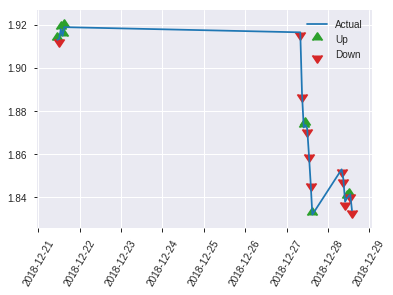


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.21055181512280732
RMSE: 0.45885925415404594
LogLoss: 0.613369754604781
Mean Per-Class Error: 0.30629355400696867
AUC: 0.7280052264808362
pr_auc: 0.6179532689928473
Gini: 0.4560104529616724
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26698172092437744: 


,0,1,Error,Rate
0,55.0,57.0,0.5089,(57.0/112.0)
1,14.0,68.0,0.1707,(14.0/82.0)
Total,69.0,125.0,0.366,(71.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2669817,0.6570048,124.0
max f2,0.1674450,0.7975460,160.0
max f0point5,0.5501094,0.6737589,49.0
max accuracy,0.5501094,0.7113402,49.0
max precision,0.9252648,1.0,0.0
max recall,0.1047267,1.0,187.0
max specificity,0.9252648,1.0,0.0
max absolute_mcc,0.5501094,0.4023751,49.0
max min_per_class_accuracy,0.3797554,0.6696429,91.0
max mean_per_class_accuracy,0.4061057,0.6937064,81.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 39.44 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9044962,1.1829268,1.1829268,0.5,0.9191887,0.5,0.9191887,0.0121951,0.0121951,18.2926829,18.2926829
,2,0.0206186,0.8661465,1.1829268,1.1829268,0.5,0.8892387,0.5,0.9042137,0.0121951,0.0243902,18.2926829,18.2926829
,3,0.0309278,0.8437414,2.3658537,1.5772358,1.0,0.8549363,0.6666667,0.8877879,0.0243902,0.0487805,136.5853659,57.7235772
,4,0.0412371,0.8299352,1.1829268,1.4786585,0.5,0.8377727,0.625,0.8752841,0.0121951,0.0609756,18.2926829,47.8658537
,5,0.0515464,0.8265564,1.1829268,1.4195122,0.5,0.8288149,0.6,0.8659903,0.0121951,0.0731707,18.2926829,41.9512195
,6,0.1030928,0.7065167,1.8926829,1.6560976,0.8,0.7618339,0.7,0.8139121,0.0975610,0.1707317,89.2682927,65.6097561
,7,0.1494845,0.6635719,1.8401084,1.7132044,0.7777778,0.6806464,0.7241379,0.7725538,0.0853659,0.2560976,84.0108401,71.3204373
,8,0.2010309,0.5954304,1.8926829,1.7592245,0.8,0.6244967,0.7435897,0.7345904,0.0975610,0.3536585,89.2682927,75.9224515
,9,0.2989691,0.5105073,1.1206675,1.5500421,0.4736842,0.5543327,0.6551724,0.6755405,0.1097561,0.4634146,12.0667522,55.0042052
,10,0.4020619,0.4204974,1.4195122,1.5165729,0.6,0.4683322,0.6410256,0.6224101,0.1463415,0.6097561,41.9512195,51.6572858


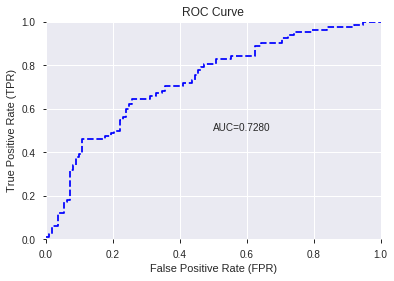

This function is available for GLM models only


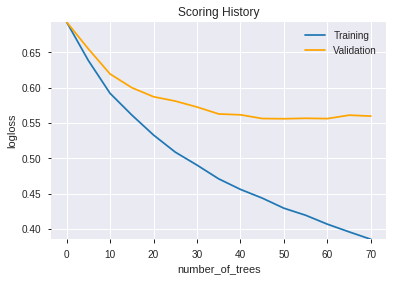

--2019-09-06 02:10:22--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.162.115
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.162.115|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190906_020924_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190906_020924_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

In [18]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190906_021119_model_8,0.729530,0.601164,0.297692,0.455118,0.207133
1,DeepLearning_grid_1_AutoML_20190906_021119_model_7,0.725828,0.806861,0.305422,0.481775,0.232107
2,DeepLearning_grid_1_AutoML_20190906_021119_model_9,0.714721,0.620833,0.334495,0.463555,0.214883
3,DeepLearning_grid_1_AutoML_20190906_021119_model_5,0.703071,0.669606,0.328833,0.468946,0.219910
4,DeepLearning_grid_1_AutoML_20190906_021119_model_6,0.700348,0.652812,0.341790,0.473571,0.224269
5,DeepLearning_grid_1_AutoML_20190906_021119_model_3,0.696973,0.752743,0.359647,0.485363,0.235578
6,DeepLearning_grid_1_AutoML_20190906_021119_model_4,0.693489,0.877954,0.332099,0.517497,0.267803
7,DeepLearning_grid_1_AutoML_20190906_021119_model_2,0.678680,0.807082,0.343859,0.502609,0.252615
8,DeepLearning_grid_1_AutoML_20190906_021119_model_1,0.669425,1.098700,0.327744,0.512757,0.262919
9,DeepLearning_1_AutoML_20190906_021119,0.652112,0.693210,0.407121,0.493335,0.243380


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.035867
1,CDLCLOSINGMARUBOZU,0.826267,0.826267,0.029636
2,hour,0.703296,0.703296,0.025225
3,DIV,0.656622,0.656622,0.023551
4,Volume,0.618477,0.618477,0.022183
5,CDLSHORTLINE,0.613001,0.613001,0.021987
6,CDLHAMMER,0.602536,0.602536,0.021611
7,SUB,0.599805,0.599805,0.021513
8,TRANGE,0.596536,0.596536,0.021396
9,HT_PHASOR_inphase,0.589479,0.589479,0.021143


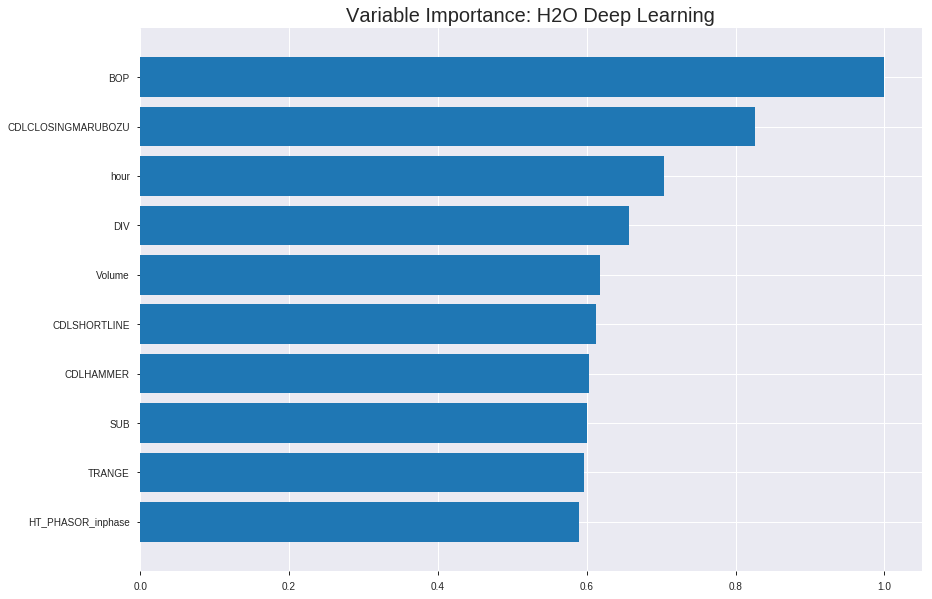

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190906_021119_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18419254480279054
RMSE: 0.4291765892995453
LogLoss: 0.5433849558036078
Mean Per-Class Error: 0.27505276747025187
AUC: 0.7970682546953733
pr_auc: 0.7801606628795835
Gini: 0.5941365093907467
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4280713248596418: 


,0,1,Error,Rate
0,417.0,286.0,0.4068,(286.0/703.0)
1,115.0,534.0,0.1772,(115.0/649.0)
Total,532.0,820.0,0.2966,(401.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4280713,0.7270252,228.0
max f2,0.2002506,0.8475027,331.0
max f0point5,0.5459221,0.7201646,162.0
max accuracy,0.4908195,0.7263314,190.0
max precision,0.9548231,1.0,0.0
max recall,0.0928425,1.0,371.0
max specificity,0.9548231,1.0,0.0
max absolute_mcc,0.4908195,0.4512575,190.0
max min_per_class_accuracy,0.4737711,0.7180277,200.0
max mean_per_class_accuracy,0.4908195,0.7249472,190.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.48 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9138376,2.0832049,2.0832049,1.0,0.9272903,1.0,0.9272903,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9090104,1.7856042,1.9344046,0.8571429,0.9114212,0.9285714,0.9193557,0.0184900,0.0400616,78.5604226,93.4404578
,3,0.0303254,0.9041842,2.0832049,1.9815852,1.0,0.9064954,0.9512195,0.9152781,0.0200308,0.0600924,108.3204931,98.1585178
,4,0.0406805,0.8960776,1.9344046,1.9695756,0.9285714,0.8995616,0.9454545,0.9112775,0.0200308,0.0801233,93.4404578,96.9575571
,5,0.0502959,0.8779524,1.7627119,1.9300281,0.8461538,0.8886713,0.9264706,0.9069557,0.0169492,0.0970724,76.2711864,93.0028098
,6,0.1005917,0.8049568,1.8381220,1.8840750,0.8823529,0.8485020,0.9044118,0.8777289,0.0924499,0.1895223,83.8121998,88.4075048
,7,0.1501479,0.7481815,1.7411862,1.8369147,0.8358209,0.7722792,0.8817734,0.8429253,0.0862866,0.2758089,74.1186211,83.6914693
,8,0.2004438,0.7050798,1.6849452,1.7987821,0.8088235,0.7278902,0.8634686,0.8140604,0.0847458,0.3605547,68.4945165,79.8782117
,9,0.3002959,0.6029230,1.3579410,1.6521970,0.6518519,0.6532640,0.7931034,0.7605936,0.1355932,0.4961479,35.7940992,65.2197014
,10,0.4001479,0.5235725,1.2499230,1.5518144,0.6,0.5622536,0.7449168,0.7111003,0.1248074,0.6209553,24.9922958,55.1814394




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.17971329510567935
RMSE: 0.4239260491001695
LogLoss: 0.5331791080124056
Mean Per-Class Error: 0.2729569892473118
AUC: 0.8055913978494624
pr_auc: 0.7839454224179313
Gini: 0.6111827956989249
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36282285756786464: 


,0,1,Error,Rate
0,101.0,99.0,0.495,(99.0/200.0)
1,16.0,170.0,0.086,(16.0/186.0)
Total,117.0,269.0,0.2979,(115.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3628229,0.7472527,268.0
max f2,0.2626372,0.8548233,302.0
max f0point5,0.5645864,0.7521490,127.0
max accuracy,0.5645864,0.7305699,127.0
max precision,0.9417660,1.0,0.0
max recall,0.0755865,1.0,365.0
max specificity,0.9417660,1.0,0.0
max absolute_mcc,0.5645864,0.4770918,127.0
max min_per_class_accuracy,0.4810007,0.6935484,185.0
max mean_per_class_accuracy,0.4049034,0.7270430,234.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 46.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9161674,2.0752688,2.0752688,1.0,0.9314533,1.0,0.9314533,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9093896,2.0752688,2.0752688,1.0,0.9127427,1.0,0.9220980,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.8938312,1.5564516,1.9023297,0.75,0.9046271,0.9166667,0.9162744,0.0161290,0.0591398,55.6451613,90.2329749
,4,0.0414508,0.8825394,2.0752688,1.9455645,1.0,0.8877148,0.9375,0.9091345,0.0215054,0.0806452,107.5268817,94.5564516
,5,0.0518135,0.8691928,1.5564516,1.8677419,0.75,0.8756001,0.9,0.9024276,0.0161290,0.0967742,55.6451613,86.7741935
,6,0.1010363,0.7903545,1.8568195,1.8624207,0.8947368,0.8333597,0.8974359,0.8687791,0.0913978,0.1881720,85.6819468,86.2420733
,7,0.1502591,0.7417228,1.7475948,1.8248053,0.8421053,0.7669050,0.8793103,0.8354066,0.0860215,0.2741935,74.7594793,82.4805339
,8,0.2020725,0.6956441,1.5564516,1.7559967,0.75,0.7196849,0.8461538,0.8057343,0.0806452,0.3548387,55.6451613,75.5996691
,9,0.3005181,0.5921790,1.6383701,1.7174638,0.7894737,0.6442713,0.8275862,0.7528413,0.1612903,0.5161290,63.8370119,71.7463849
,10,0.4015544,0.5157159,1.0642404,1.5531044,0.5128205,0.5505280,0.7483871,0.7019366,0.1075269,0.6236559,6.4240419,55.3104405



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:17:37,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-09-06 02:17:39,1 min 27.596 sec,607 obs/sec,0.9082840,1,1228.0,0.5058892,0.8428330,-0.0253314,0.7642691,0.7385247,1.9344046,0.3402367,0.5111779,0.8434702,-0.0465880,0.7956452,0.7596090,2.0752688,0.2668394
,2019-09-06 02:17:49,1 min 38.104 sec,850 obs/sec,7.2329882,8,9779.0,0.4291766,0.5433850,0.2620526,0.7970683,0.7801607,2.0832049,0.2965976,0.4239260,0.5331791,0.2801999,0.8055914,0.7839454,2.0752688,0.2979275
,2019-09-06 02:18:00,1 min 48.616 sec,930 obs/sec,14.4504438,16,19537.0,0.4251714,0.5330722,0.2757619,0.8120985,0.7982485,2.0832049,0.3136095,0.4273709,0.5442553,0.2684542,0.8109140,0.7884310,2.0752688,0.2720207
,2019-09-06 02:18:10,1 min 59.277 sec,997 obs/sec,22.6183432,25,30580.0,0.4194984,0.5218992,0.2949597,0.8237030,0.8095818,2.0832049,0.2751479,0.4291977,0.5556446,0.2621868,0.8081989,0.7802869,2.0752688,0.2564767
,2019-09-06 02:18:21,2 min 9.561 sec,1011 obs/sec,29.8786982,33,40396.0,0.4071014,0.4935297,0.3360147,0.8395102,0.8287682,2.0832049,0.2455621,0.4304506,0.5673402,0.2578728,0.8072312,0.7709901,1.5564516,0.2487047
,2019-09-06 02:18:31,2 min 20.330 sec,1058 obs/sec,38.8779586,43,52563.0,0.3991986,0.4723296,0.3615435,0.8518500,0.8496234,2.0832049,0.2707101,0.4375856,0.6009599,0.2330665,0.7908065,0.7430070,2.0752688,0.3082902
,2019-09-06 02:18:43,2 min 31.770 sec,1098 obs/sec,48.7980769,54,65975.0,0.3866408,0.4510304,0.4010802,0.8757855,0.8667606,2.0832049,0.2144970,0.4445262,0.6352387,0.2085445,0.7953226,0.7348926,1.5564516,0.2746114
,2019-09-06 02:18:44,2 min 32.813 sec,1098 obs/sec,48.7980769,54,65975.0,0.4291766,0.5433850,0.2620526,0.7970683,0.7801607,2.0832049,0.2965976,0.4239260,0.5331791,0.2801999,0.8055914,0.7839454,2.0752688,0.2979275


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0358671
CDLCLOSINGMARUBOZU,0.8262672,0.8262672,0.0296358
hour,0.7032956,0.7032956,0.0252251
DIV,0.6566217,0.6566217,0.0235511
Volume,0.6184769,0.6184769,0.0221830
---,---,---,---
CDL3LINESTRIKE,0.4824590,0.4824590,0.0173044
CDLINVERTEDHAMMER,0.4670460,0.4670460,0.0167516
CDLHIKKAKEMOD,0.4656568,0.4656568,0.0167017
CDLSEPARATINGLINES,0.4596567,0.4596567,0.0164865



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6958762886597938)

('F1', 0.6740331491712708)

('auc', 0.7295296167247386)

('logloss', 0.6011637336420125)

('mean_per_class_error', 0.297691637630662)

('rmse', 0.4551184204177022)

('mse', 0.2071327766035043)

deeplearning prediction progress: |███████████████████████████████████████| 100%


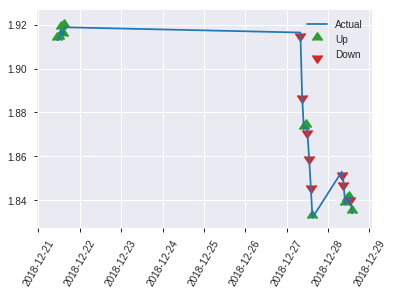


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2071327766035043
RMSE: 0.4551184204177022
LogLoss: 0.6011637336420125
Mean Per-Class Error: 0.297691637630662
AUC: 0.7295296167247386
pr_auc: 0.6394938695961911
Gini: 0.4590592334494772
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.430591847187589: 


,0,1,Error,Rate
0,74.0,38.0,0.3393,(38.0/112.0)
1,21.0,61.0,0.2561,(21.0/82.0)
Total,95.0,99.0,0.3041,(59.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4305918,0.6740331,98.0
max f2,0.2805248,0.8088235,147.0
max f0point5,0.4305918,0.6380753,98.0
max accuracy,0.4305918,0.6958763,98.0
max precision,0.9187227,1.0,0.0
max recall,0.0502185,1.0,186.0
max specificity,0.9187227,1.0,0.0
max absolute_mcc,0.4305918,0.3998346,98.0
max min_per_class_accuracy,0.4399648,0.6607143,92.0
max mean_per_class_accuracy,0.4305918,0.7023084,98.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 43.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9066798,2.3658537,2.3658537,1.0,0.9185943,1.0,0.9185943,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9036516,1.1829268,1.7743902,0.5,0.9055734,0.75,0.9120838,0.0121951,0.0365854,18.2926829,77.4390244
,3,0.0309278,0.9001826,1.1829268,1.5772358,0.5,0.9025806,0.6666667,0.9089161,0.0121951,0.0487805,18.2926829,57.7235772
,4,0.0412371,0.8746825,2.3658537,1.7743902,1.0,0.8911818,0.75,0.9044825,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.8620371,2.3658537,1.8926829,1.0,0.8712224,0.8,0.8978305,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.7814644,2.1292683,2.0109756,0.9,0.8152342,0.85,0.8565323,0.1097561,0.2073171,112.9268293,101.0975610
,7,0.1494845,0.7008966,1.3143631,1.7947855,0.5555556,0.7334029,0.7586207,0.8183198,0.0609756,0.2682927,31.4363144,79.4785534
,8,0.2010309,0.6064377,0.9463415,1.5772358,0.4,0.6598697,0.6666667,0.7776915,0.0487805,0.3170732,-5.3658537,57.7235772
,9,0.2989691,0.5062893,1.2451861,1.4684609,0.5263158,0.5504341,0.6206897,0.7032451,0.1219512,0.4390244,24.5186136,46.8460892
,10,0.4020619,0.4653582,1.3012195,1.4255785,0.55,0.4846680,0.6025641,0.6471997,0.1341463,0.5731707,30.1219512,42.5578487


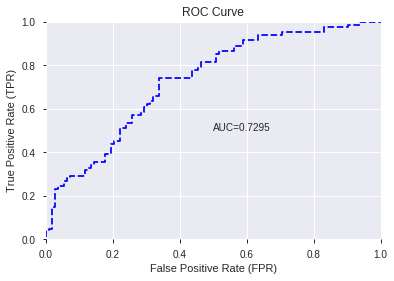

This function is available for GLM models only


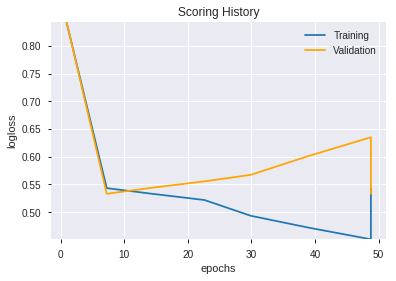

--2019-09-06 02:20:17--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.109.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.109.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190906_021119_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190906_021119_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'hour',
 'DIV',
 'Volume',
 'CDLSHORTLINE',
 'CDLHAMMER',
 'SUB',
 'TRANGE',
 'HT_PHASOR_inphase',
 'CDLTAKURI',
 'CDLLONGLINE',
 'TAN',
 'CDLIDENTICAL3CROWS',
 'weekday_name',
 'CDLRISEFALL3METHODS',
 'CDL3BLACKCROWS',
 'CDLDRAGONFLYDOJI',
 'CDLHIKKAKE',
 'CDLTASUKIGAP',
 'CDLEVENINGSTAR',
 'CDLSTALLEDPATTERN',
 'HT_TRENDMODE',
 'CDLHOMINGPIGEON',
 'CDLENGULFING',
 'CORREL_8',
 'is_month_start',
 'CDLRICKSHAWMAN',
 'CDLGRAVESTONEDOJI',
 'CDLHARAMI',
 'CDLMORNINGSTAR',
 'CDLMARUBOZU',
 'CDLADVANCEBLOCK',
 'CDLTHRUSTING',
 'CDLHANGINGMAN',
 'CDLSPINNINGTOP',
 'is_month_end',
 'CDLHARAMICROSS',
 'CDLSTICKSANDWICH',
 'CDLGAPSIDESIDEWHITE',
 'CDL3INSIDE',
 'CDLDARKCLOUDCOVER',
 'CDLSHOOTINGSTAR',
 'CDLDOJISTAR',
 'CDLMATCHINGLOW',
 'CDL3LINESTRIKE',
 'CDLINVERTEDHAMMER',
 'CDLHIKKAKEMOD',
 'CDLSEPARATINGLINES',
 'CDLMORNINGDOJISTAR']

In [19]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190906_022113_model_1,0.72855,0.601235,0.293554,0.454913,0.206945


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.810757,1.000000,0.152435
1,CDLCLOSINGMARUBOZU,0.518198,0.639153,0.097429
2,CDLSTALLEDPATTERN,0.268643,0.331349,0.050509
3,TAN,0.258455,0.318782,0.048594
4,CDLHAMMER,0.217470,0.268231,0.040888
5,CDLTAKURI,0.196896,0.242855,0.037020
6,DIV,0.172828,0.213169,0.032494
7,hour,0.168491,0.207820,0.031679
8,CDLMORNINGSTAR,0.168121,0.207363,0.031610
9,Volume,0.142552,0.175826,0.026802


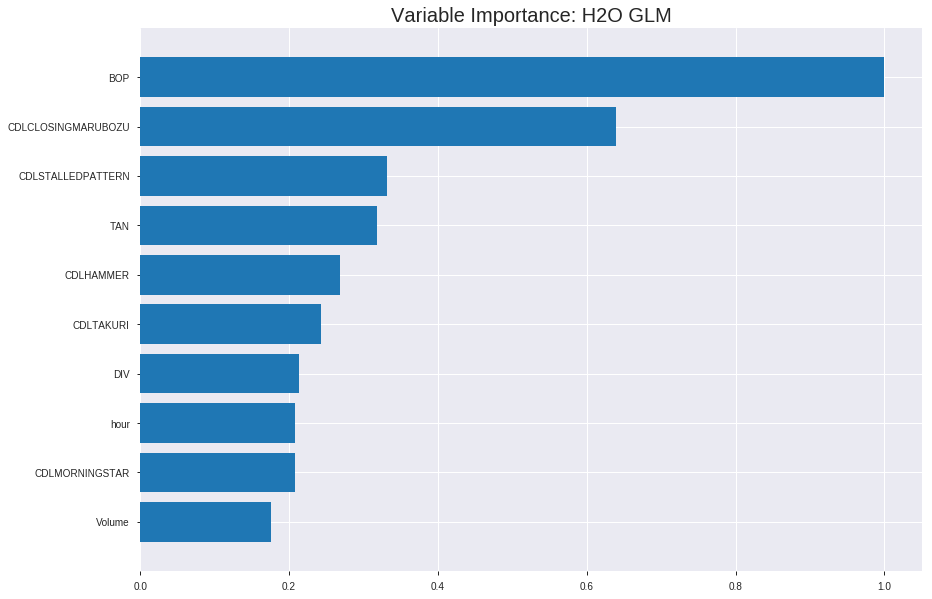

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190906_022113_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18593195288419423
RMSE: 0.4311982756043839
LogLoss: 0.5494455885382857
Null degrees of freedom: 1351
Residual degrees of freedom: 1301
Null deviance: 1872.112597686563
Residual deviance: 1485.7008714075243
AIC: 1587.7008714075243
AUC: 0.7920008241150078
pr_auc: 0.7690779799148849
Gini: 0.5840016482300157
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32520014621483373: 


,0,1,Error,Rate
0,333.0,370.0,0.5263,(370.0/703.0)
1,62.0,587.0,0.0955,(62.0/649.0)
Total,395.0,957.0,0.3195,(432.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3252001,0.7310087,272.0
max f2,0.1376562,0.8396547,352.0
max f0point5,0.6061716,0.7187113,139.0
max accuracy,0.4937193,0.7174556,191.0
max precision,0.9946103,1.0,0.0
max recall,0.0598607,1.0,380.0
max specificity,0.9946103,1.0,0.0
max absolute_mcc,0.4937193,0.4335940,191.0
max min_per_class_accuracy,0.4749460,0.7072419,199.0
max mean_per_class_accuracy,0.4937193,0.7165307,191.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9483589,1.6368039,1.6368039,0.7857143,0.9676563,0.7857143,0.9676563,0.0169492,0.0169492,63.6803874,63.6803874
,2,0.0207101,0.9329993,2.0832049,1.8600044,1.0,0.9401779,0.8928571,0.9539171,0.0215716,0.0385208,108.3204931,86.0004402
,3,0.0303254,0.9123876,2.0832049,1.9307753,1.0,0.9199058,0.9268293,0.9431330,0.0200308,0.0585516,108.3204931,93.0775302
,4,0.0406805,0.8943761,1.9344046,1.9316991,0.9285714,0.9035998,0.9272727,0.9330700,0.0200308,0.0785824,93.4404578,93.1699118
,5,0.0502959,0.8869421,1.7627119,1.8993927,0.8461538,0.8905649,0.9117647,0.9249440,0.0169492,0.0955316,76.2711864,89.9392731
,6,0.1005917,0.8283215,1.7768513,1.8381220,0.8529412,0.8595395,0.8823529,0.8922418,0.0893683,0.1848998,77.6851264,83.8121998
,7,0.1501479,0.7662826,1.7411862,1.8061284,0.8358209,0.7994632,0.8669951,0.8616203,0.0862866,0.2711864,74.1186211,80.6128413
,8,0.2004438,0.7059247,1.5930391,1.7526595,0.7647059,0.7388856,0.8413284,0.8308234,0.0801233,0.3513097,59.3039065,75.2659499
,9,0.3002959,0.6317799,1.4659590,1.6573281,0.7037037,0.6673280,0.7955665,0.7764591,0.1463790,0.4976888,46.5959025,65.7328061
,10,0.4001479,0.5536719,1.1727672,1.5364118,0.5629630,0.5912642,0.7375231,0.7302460,0.1171032,0.6147920,17.2767220,53.6411770




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1835355874005481
RMSE: 0.4284105360522172
LogLoss: 0.5445522085826078
Null degrees of freedom: 385
Residual degrees of freedom: 335
Null deviance: 534.6069507592587
Residual deviance: 420.3943050257732
AIC: 522.3943050257732
AUC: 0.8000268817204301
pr_auc: 0.7840440261340734
Gini: 0.6000537634408603
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32757101240697156: 


,0,1,Error,Rate
0,109.0,91.0,0.455,(91.0/200.0)
1,20.0,166.0,0.1075,(20.0/186.0)
Total,129.0,257.0,0.2876,(111.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3275710,0.7494357,256.0
max f2,0.2091452,0.8451369,314.0
max f0point5,0.6423563,0.7395498,108.0
max accuracy,0.5823994,0.7253886,139.0
max precision,0.9928043,1.0,0.0
max recall,0.0474715,1.0,376.0
max specificity,0.9928043,1.0,0.0
max absolute_mcc,0.3275710,0.4634058,256.0
max min_per_class_accuracy,0.4629565,0.7150538,188.0
max mean_per_class_accuracy,0.5392960,0.7225806,159.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 46.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9436845,2.0752688,2.0752688,1.0,0.9674487,1.0,0.9674487,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9273808,2.0752688,2.0752688,1.0,0.9363278,1.0,0.9518883,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9002271,2.0752688,2.0752688,1.0,0.9137700,1.0,0.9391822,0.0215054,0.0645161,107.5268817,107.5268817
,4,0.0414508,0.8894999,1.5564516,1.9455645,0.75,0.8933188,0.9375,0.9277164,0.0161290,0.0806452,55.6451613,94.5564516
,5,0.0518135,0.8775178,2.0752688,1.9715054,1.0,0.8838145,0.95,0.9189360,0.0215054,0.1021505,107.5268817,97.1505376
,6,0.1010363,0.8178075,1.6383701,1.8092087,0.7894737,0.8469631,0.8717949,0.8838723,0.0806452,0.1827957,63.8370119,80.9208712
,7,0.1502591,0.7540634,1.8568195,1.8248053,0.8947368,0.7833827,0.8793103,0.8509533,0.0913978,0.2741935,85.6819468,82.4805339
,8,0.2020725,0.7084537,1.7639785,1.8092087,0.85,0.7270226,0.8717949,0.8191762,0.0913978,0.3655914,76.3978495,80.9208712
,9,0.3005181,0.6311072,1.4745331,1.6995736,0.7105263,0.6694729,0.8189655,0.7701355,0.1451613,0.5107527,47.4533107,69.9573600
,10,0.4015544,0.5478798,1.1174524,1.5531044,0.5384615,0.5895731,0.7483871,0.7247036,0.1129032,0.6236559,11.7452440,55.3104405



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-09-06 02:21:14,0.000 sec,2,.19E2,51,1.3699509,1.3682448
,2019-09-06 02:21:14,0.010 sec,4,.12E2,51,1.3617362,1.3589162
,2019-09-06 02:21:14,0.019 sec,6,.72E1,51,1.3496011,1.3451418
,2019-09-06 02:21:14,0.028 sec,8,.45E1,51,1.3324330,1.3256541
,2019-09-06 02:21:14,0.038 sec,10,.28E1,51,1.3096308,1.2998057
---,---,---,---,---,---,---,---
,2019-09-06 02:21:14,0.143 sec,38,.35E-2,51,1.0982126,1.0893321
,2019-09-06 02:21:14,0.150 sec,39,.22E-2,51,1.0978477,1.0896269
,2019-09-06 02:21:14,0.155 sec,40,.14E-2,51,1.0976280,1.0898957
,2019-09-06 02:21:14,0.158 sec,41,.85E-3,51,1.0974928,1.0900932



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6855670103092784)

('F1', 0.6934673366834171)

('auc', 0.7285496515679443)

('logloss', 0.6012347046383374)

('mean_per_class_error', 0.2935540069686411)

('rmse', 0.4549125171066972)

('mse', 0.20694539822035107)

glm prediction progress: |████████████████████████████████████████████████| 100%


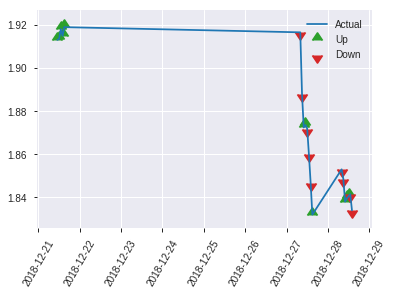


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20694539822035107
RMSE: 0.4549125171066972
LogLoss: 0.6012347046383374
Null degrees of freedom: 193
Residual degrees of freedom: 143
Null deviance: 266.85311025686934
Residual deviance: 233.27906539967492
AIC: 335.2790653996749
AUC: 0.7285496515679443
pr_auc: 0.6601360467221407
Gini: 0.45709930313588854
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35388726121591174: 


,0,1,Error,Rate
0,64.0,48.0,0.4286,(48.0/112.0)
1,13.0,69.0,0.1585,(13.0/82.0)
Total,77.0,117.0,0.3144,(61.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3538873,0.6934673,116.0
max f2,0.2029093,0.8041237,156.0
max f0point5,0.3538873,0.6272727,116.0
max accuracy,0.3538873,0.6855670,116.0
max precision,0.9549296,1.0,0.0
max recall,0.0261607,1.0,190.0
max specificity,0.9549296,1.0,0.0
max absolute_mcc,0.3538873,0.4168829,116.0
max min_per_class_accuracy,0.4474358,0.6463415,88.0
max mean_per_class_accuracy,0.3538873,0.7064460,116.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 43.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9242139,2.3658537,2.3658537,1.0,0.9529468,1.0,0.9529468,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9088858,2.3658537,2.3658537,1.0,0.9155649,1.0,0.9342559,0.0243902,0.0487805,136.5853659,136.5853659
,3,0.0309278,0.8987144,2.3658537,2.3658537,1.0,0.9076323,1.0,0.9253813,0.0243902,0.0731707,136.5853659,136.5853659
,4,0.0412371,0.8948631,1.1829268,2.0701220,0.5,0.8958089,0.875,0.9179882,0.0121951,0.0853659,18.2926829,107.0121951
,5,0.0515464,0.8835573,2.3658537,2.1292683,1.0,0.8921777,0.9,0.9128261,0.0243902,0.1097561,136.5853659,112.9268293
,6,0.1030928,0.8049042,2.1292683,2.1292683,0.9,0.8423681,0.9,0.8775971,0.1097561,0.2195122,112.9268293,112.9268293
,7,0.1494845,0.7025618,1.0514905,1.7947855,0.4444444,0.7380100,0.7586207,0.8342770,0.0487805,0.2682927,5.1490515,79.4785534
,8,0.2010309,0.6264787,0.9463415,1.5772358,0.4,0.6591705,0.6666667,0.7893779,0.0487805,0.3170732,-5.3658537,57.7235772
,9,0.2989691,0.5486903,1.3697047,1.5092515,0.5789474,0.5844785,0.6379310,0.7222557,0.1341463,0.4512195,36.9704750,50.9251472
,10,0.4020619,0.4833139,1.1829268,1.4255785,0.5,0.5159238,0.6025641,0.6693501,0.1219512,0.5731707,18.2926829,42.5578487


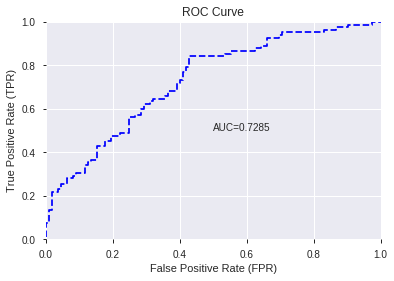

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


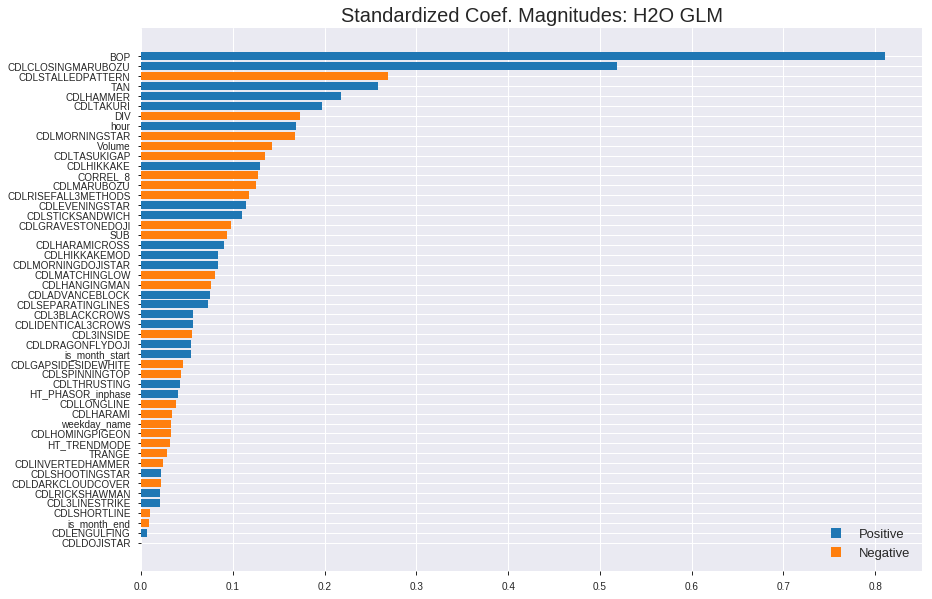

'log_likelihood'
--2019-09-06 02:21:23--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.21.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.21.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190906_022113_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190906_022113_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLSTALLEDPATTERN',
 'TAN',
 'CDLHAMMER',
 'CDLTAKURI',
 'DIV',
 'hour',
 'CDLMORNINGSTAR',
 'Volume',
 'CDLTASUKIGAP',
 'CDLHIKKAKE',
 'CORREL_8',
 'CDLMARUBOZU',
 'CDLRISEFALL3METHODS',
 'CDLEVENINGSTAR',
 'CDLSTICKSANDWICH',
 'CDLGRAVESTONEDOJI',
 'SUB',
 'CDLHARAMICROSS',
 'CDLHIKKAKEMOD',
 'CDLMORNINGDOJISTAR',
 'CDLMATCHINGLOW',
 'CDLHANGINGMAN',
 'CDLADVANCEBLOCK',
 'CDLSEPARATINGLINES',
 'CDL3BLACKCROWS',
 'CDLIDENTICAL3CROWS',
 'CDL3INSIDE',
 'CDLDRAGONFLYDOJI',
 'is_month_start',
 'CDLGAPSIDESIDEWHITE',
 'CDLSPINNINGTOP',
 'CDLTHRUSTING',
 'HT_PHASOR_inphase',
 'CDLLONGLINE',
 'CDLHARAMI',
 'weekday_name',
 'CDLHOMINGPIGEON',
 'HT_TRENDMODE',
 'TRANGE',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLDARKCLOUDCOVER',
 'CDLRICKSHAWMAN',
 'CDL3LINESTRIKE',
 'CDLSHORTLINE',
 'is_month_end',
 'CDLENGULFING',
 'CDLDOJISTAR']

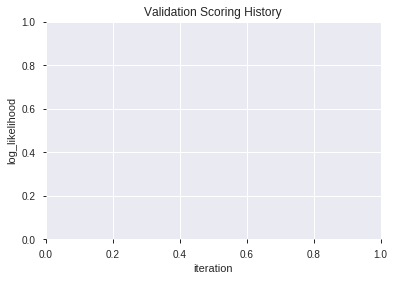

In [20]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190906_022220_model_3,0.718532,0.618768,0.340157,0.463591,0.214916
1,XGBoost_grid_1_AutoML_20190906_022220_model_1,0.718206,0.619456,0.340157,0.463355,0.214698
2,XGBoost_grid_1_AutoML_20190906_022220_model_5,0.713632,0.646666,0.302918,0.474282,0.224943
3,XGBoost_grid_1_AutoML_20190906_022220_model_2,0.712435,0.622355,0.326437,0.464452,0.215716
4,XGBoost_1_AutoML_20190906_022220,0.711672,0.631931,0.343423,0.467998,0.219022
5,XGBoost_grid_1_AutoML_20190906_022220_model_6,0.711346,0.623665,0.351154,0.463898,0.215201
6,XGBoost_3_AutoML_20190906_022220,0.702417,0.631748,0.326873,0.468814,0.219787
7,XGBoost_grid_1_AutoML_20190906_022220_model_7,0.700893,0.645686,0.361280,0.474339,0.224998
8,XGBoost_2_AutoML_20190906_022220,0.688480,0.640486,0.356381,0.473975,0.224653
9,XGBoost_grid_1_AutoML_20190906_022220_model_4,0.683471,0.641345,0.361280,0.474757,0.225394


,variable,relative_importance,scaled_importance,percentage
0,BOP,1248.309692,1.000000,0.229208
1,DIV,575.162109,0.460753,0.105608
2,TAN,573.769958,0.459638,0.105352
3,TRANGE,365.431030,0.292741,0.067098
4,CORREL_8,363.978851,0.291577,0.066832
5,CDLCLOSINGMARUBOZU,352.654175,0.282505,0.064752
6,HT_PHASOR_inphase,302.078094,0.241990,0.055466
7,hour,292.470825,0.234293,0.053702
8,Volume,292.400452,0.234237,0.053689
9,SUB,258.067017,0.206733,0.047385


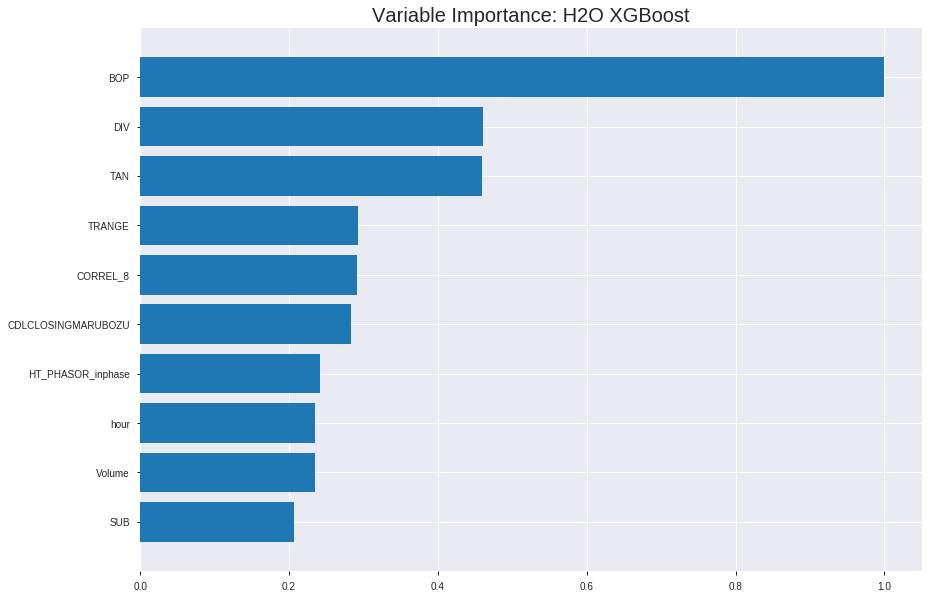

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190906_022220_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1445952116757106
RMSE: 0.38025677071646025
LogLoss: 0.45524869707873317
Mean Per-Class Error: 0.18478916025749215
AUC: 0.8926283350904225
pr_auc: 0.8842477855036412
Gini: 0.785256670180845
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4608303904533386: 


,0,1,Error,Rate
0,552.0,151.0,0.2148,(151.0/703.0)
1,104.0,545.0,0.1602,(104.0/649.0)
Total,656.0,696.0,0.1886,(255.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4608304,0.8104089,216.0
max f2,0.2807921,0.8756592,297.0
max f0point5,0.5583184,0.8294931,173.0
max accuracy,0.5287194,0.8173077,186.0
max precision,0.9554555,1.0,0.0
max recall,0.1700332,1.0,350.0
max specificity,0.9554555,1.0,0.0
max absolute_mcc,0.5287194,0.6353248,186.0
max min_per_class_accuracy,0.4878604,0.8089368,205.0
max mean_per_class_accuracy,0.5287194,0.8152108,186.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9216470,2.0832049,2.0832049,1.0,0.9362584,1.0,0.9362584,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9085283,2.0832049,2.0832049,1.0,0.9153161,1.0,0.9257872,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.8972151,2.0832049,2.0832049,1.0,0.9039276,1.0,0.9188561,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.8820530,2.0832049,2.0832049,1.0,0.8859018,1.0,0.9104678,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.8702777,2.0832049,2.0832049,1.0,0.8774626,1.0,0.9041579,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.8221543,1.9912988,2.0372519,0.9558824,0.8459732,0.9779412,0.8750656,0.1001541,0.2049307,99.1298831,103.7251881
,7,0.1501479,0.7704361,1.8344640,1.9703219,0.8805970,0.7955871,0.9458128,0.8488338,0.0909091,0.2958398,83.4464043,97.0321905
,8,0.2004438,0.7267374,1.9300281,1.9602113,0.9264706,0.7505340,0.9409594,0.8241682,0.0970724,0.3929122,93.0028098,96.0211282
,9,0.3002959,0.6401415,1.6819951,1.8677010,0.8074074,0.6810968,0.8965517,0.7765952,0.1679507,0.5608629,68.1995092,86.7700972
,10,0.4001479,0.5586576,1.5739771,1.7944057,0.7555556,0.5976150,0.8613678,0.7319328,0.1571649,0.7180277,57.3977059,79.4405726




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17357985467150058
RMSE: 0.4166291572507865
LogLoss: 0.5254787851219543
Mean Per-Class Error: 0.24658602150537634
AUC: 0.8225
pr_auc: 0.7682660881193323
Gini: 0.645
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35038870573043823: 


,0,1,Error,Rate
0,126.0,74.0,0.37,(74.0/200.0)
1,24.0,162.0,0.129,(24.0/186.0)
Total,150.0,236.0,0.2539,(98.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3503887,0.7677725,235.0
max f2,0.2143710,0.8548233,302.0
max f0point5,0.5269169,0.7553957,161.0
max accuracy,0.5269169,0.7512953,161.0
max precision,0.9381143,1.0,0.0
max recall,0.0803744,1.0,377.0
max specificity,0.9381143,1.0,0.0
max absolute_mcc,0.3503887,0.5135463,235.0
max min_per_class_accuracy,0.4621707,0.7473118,188.0
max mean_per_class_accuracy,0.4059602,0.7534140,211.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 46.44 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9149870,1.5564516,1.5564516,0.75,0.9274925,0.75,0.9274925,0.0161290,0.0161290,55.6451613,55.6451613
,2,0.0207254,0.8980336,2.0752688,1.8158602,1.0,0.9067547,0.875,0.9171236,0.0215054,0.0376344,107.5268817,81.5860215
,3,0.0310881,0.8831821,1.0376344,1.5564516,0.5,0.8937820,0.75,0.9093431,0.0107527,0.0483871,3.7634409,55.6451613
,4,0.0414508,0.8651029,2.0752688,1.6861559,1.0,0.8732053,0.8125,0.9003086,0.0215054,0.0698925,107.5268817,68.6155914
,5,0.0518135,0.8514303,1.0376344,1.5564516,0.5,0.8589960,0.75,0.8920461,0.0107527,0.0806452,3.7634409,55.6451613
,6,0.1010363,0.7977607,2.0752688,1.8092087,1.0,0.8238109,0.8717949,0.8588033,0.1021505,0.1827957,107.5268817,80.9208712
,7,0.1502591,0.7586946,1.6383701,1.7532443,0.7894737,0.7814651,0.8448276,0.8334684,0.0806452,0.2634409,63.8370119,75.3244346
,8,0.2020725,0.7223051,1.5564516,1.7027847,0.75,0.7408495,0.8205128,0.8097199,0.0806452,0.3440860,55.6451613,70.2784671
,9,0.3005181,0.6452481,1.7475948,1.7174638,0.8421053,0.6855327,0.8275862,0.7690379,0.1720430,0.5161290,74.7594793,71.7463849
,10,0.4015544,0.5350132,1.2770885,1.6066597,0.6153846,0.5989303,0.7741935,0.7262366,0.1290323,0.6451613,27.7088503,60.6659729



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:22:25,1.701 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5199704,0.5,0.6931472,0.5,0.0,1.0,0.5181347
,2019-09-06 02:22:25,1.757 sec,5.0,0.4743983,0.6428970,0.8133336,0.8002529,2.0832049,0.2803254,0.4723394,0.6389613,0.8215591,0.7733285,1.5564516,0.2331606
,2019-09-06 02:22:25,1.796 sec,10.0,0.4561793,0.6076688,0.8300109,0.8171029,2.0832049,0.2588757,0.4566814,0.6086082,0.8233468,0.7810115,2.0752688,0.2538860
,2019-09-06 02:22:25,1.840 sec,15.0,0.4409268,0.5779371,0.8411672,0.8301767,2.0832049,0.2514793,0.4421245,0.5802456,0.8270699,0.7823791,2.0752688,0.2435233
,2019-09-06 02:22:25,1.886 sec,20.0,0.4287055,0.5536963,0.8473327,0.8379261,2.0832049,0.2433432,0.4335846,0.5629413,0.8241532,0.7770137,2.0752688,0.2461140
,2019-09-06 02:22:25,1.937 sec,25.0,0.4197386,0.5355374,0.8530938,0.8408572,2.0832049,0.2226331,0.4270686,0.5493465,0.8259274,0.7818692,1.5564516,0.2538860
,2019-09-06 02:22:25,1.980 sec,30.0,0.4139761,0.5235749,0.8568758,0.8459549,2.0832049,0.2307692,0.4228028,0.5406687,0.8292608,0.7854708,1.5564516,0.2409326
,2019-09-06 02:22:25,2.051 sec,35.0,0.4080432,0.5114435,0.8627344,0.8525297,2.0832049,0.2159763,0.4206060,0.5357217,0.8290860,0.7810885,1.5564516,0.2409326
,2019-09-06 02:22:25,2.116 sec,40.0,0.4041362,0.5031264,0.8660101,0.8557549,2.0832049,0.2181953,0.4188770,0.5320555,0.8294355,0.7827462,2.0752688,0.2435233
,2019-09-06 02:22:25,2.197 sec,45.0,0.3986008,0.4919449,0.8725570,0.8628348,2.0832049,0.2204142,0.4182176,0.5300457,0.8272849,0.7788288,1.5564516,0.2409326


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1248.3096924,1.0,0.2292076
DIV,575.1621094,0.4607527,0.1056080
TAN,573.7699585,0.4596375,0.1053524
TRANGE,365.4310303,0.2927407,0.0670984
CORREL_8,363.9788513,0.2915774,0.0668317
---,---,---,---
CDLENGULFING,11.4629211,0.0091828,0.0021048
CDLHANGINGMAN,7.5882740,0.0060788,0.0013933
is_month_end,3.6872106,0.0029538,0.0006770
CDLHARAMICROSS,3.6132209,0.0028945,0.0006634



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6752577319587629)

('F1', 0.672566371681416)

('auc', 0.7185322299651568)

('logloss', 0.6187683041543005)

('mean_per_class_error', 0.3155487804878049)

('rmse', 0.4635908071218106)

('mse', 0.2149164364478518)

xgboost prediction progress: |████████████████████████████████████████████| 100%


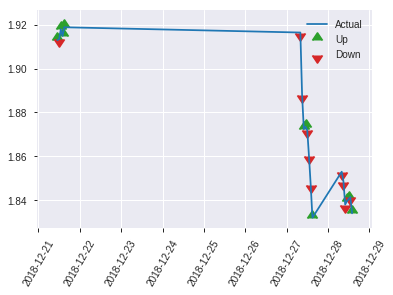


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2149164364478518
RMSE: 0.4635908071218106
LogLoss: 0.6187683041543005
Mean Per-Class Error: 0.3155487804878049
AUC: 0.7185322299651568
pr_auc: 0.6038268845061007
Gini: 0.4370644599303135
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24645066261291504: 


,0,1,Error,Rate
0,44.0,68.0,0.6071,(68.0/112.0)
1,6.0,76.0,0.0732,(6.0/82.0)
Total,50.0,144.0,0.3814,(74.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2464507,0.6725664,143.0
max f2,0.1980506,0.8074534,154.0
max f0point5,0.3766719,0.6174089,102.0
max accuracy,0.3811484,0.6752577,100.0
max precision,0.9298251,1.0,0.0
max recall,0.1107816,1.0,181.0
max specificity,0.9298251,1.0,0.0
max absolute_mcc,0.3228440,0.3693743,114.0
max min_per_class_accuracy,0.4101056,0.6696429,91.0
max mean_per_class_accuracy,0.3766719,0.6844512,102.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 41.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9175415,2.3658537,2.3658537,1.0,0.9277814,1.0,0.9277814,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9040850,0.0,1.1829268,0.0,0.9160696,0.5,0.9219255,0.0,0.0243902,-100.0,18.2926829
,3,0.0309278,0.8998883,2.3658537,1.5772358,1.0,0.9019991,0.6666667,0.9152834,0.0243902,0.0487805,136.5853659,57.7235772
,4,0.0412371,0.8776497,1.1829268,1.4786585,0.5,0.8899015,0.625,0.9089379,0.0121951,0.0609756,18.2926829,47.8658537
,5,0.0515464,0.8716855,2.3658537,1.6560976,1.0,0.8742115,0.7,0.9019926,0.0243902,0.0853659,136.5853659,65.6097561
,6,0.1030928,0.7644826,1.6560976,1.6560976,0.7,0.8189366,0.7,0.8604646,0.0853659,0.1707317,65.6097561,65.6097561
,7,0.1494845,0.7194908,1.5772358,1.6316232,0.6666667,0.7349888,0.6896552,0.8215238,0.0731707,0.2439024,57.7235772,63.1623213
,8,0.2010309,0.6482032,1.4195122,1.5772358,0.6,0.6758644,0.6666667,0.7841753,0.0731707,0.3170732,41.9512195,57.7235772
,9,0.2989691,0.5136359,1.1206675,1.4276703,0.4736842,0.5760965,0.6034483,0.7160115,0.1097561,0.4268293,12.0667522,42.7670311
,10,0.4020619,0.4532745,1.3012195,1.3952470,0.55,0.4784530,0.5897436,0.6550991,0.1341463,0.5609756,30.1219512,39.5247029


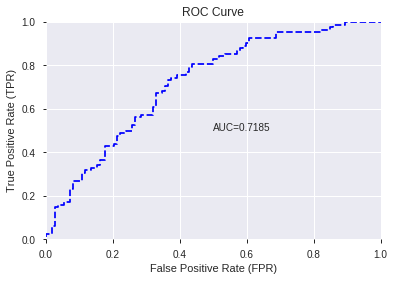

This function is available for GLM models only


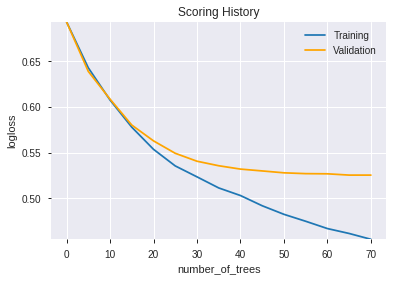

--2019-09-06 02:22:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.178.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.178.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at he

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190906_022220_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190906_022220_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'TAN',
 'TRANGE',
 'CORREL_8',
 'CDLCLOSINGMARUBOZU',
 'HT_PHASOR_inphase',
 'hour',
 'Volume',
 'SUB',
 'CDLHAMMER',
 'CDLLONGLINE',
 'CDLSHORTLINE',
 'weekday_name',
 'CDLTAKURI',
 'CDLHARAMI',
 'CDLDRAGONFLYDOJI',
 'CDLHIKKAKE',
 'CDLSPINNINGTOP',
 'CDLDOJISTAR',
 'CDLGRAVESTONEDOJI',
 'HT_TRENDMODE',
 'CDLMARUBOZU',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'is_month_end',
 'CDLHARAMICROSS',
 'is_month_start']

In [21]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [23]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [24]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [25]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [27]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [28]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [29]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [31]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [32]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [33]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [35]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [36]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [37]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [39]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [40]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [41]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [43]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [44]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [45]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [46]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [ 12 895 904 917 919 926 994 998] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


32

['Volume',
 'hour',
 'BOP',
 'CMO_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CMO_12',
 'RSI_12',
 'WILLR_12',
 'WILLR_14',
 'WILLR_20',
 'WILLR_24',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'ULTOSC',
 'ADOSC',
 'TRANGE',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLHAMMER',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'CDLTAKURI',
 'DIV',
 'SUB']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190906_022339_model_2,0.733014,0.639091,0.308253,0.461625,0.213098
1,DeepLearning_grid_1_AutoML_20190906_022339_model_4,0.728005,0.751387,0.304225,0.481539,0.231879
2,DeepLearning_grid_1_AutoML_20190906_022339_model_1,0.723214,0.854490,0.353550,0.480297,0.230686
3,DeepLearning_grid_1_AutoML_20190906_022339_model_8,0.720383,0.622584,0.345928,0.458463,0.210188
4,DeepLearning_grid_1_AutoML_20190906_022339_model_6,0.720166,0.633758,0.333297,0.462368,0.213784
5,DeepLearning_grid_1_AutoML_20190906_022339_model_9,0.716899,0.611102,0.332535,0.459999,0.211599
6,DeepLearning_grid_1_AutoML_20190906_022339_model_7,0.710801,0.814266,0.364111,0.496655,0.246666
7,DeepLearning_grid_1_AutoML_20190906_022339_model_5,0.707535,0.667634,0.362478,0.470112,0.221006
8,DeepLearning_1_AutoML_20190906_022339,0.701982,0.659349,0.361716,0.476803,0.227341
9,DeepLearning_grid_1_AutoML_20190906_022339_model_3,0.697626,0.690969,0.359647,0.478168,0.228645


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.044378
1,hour,0.986930,0.986930,0.043798
2,Volume,0.824186,0.824186,0.036575
3,STOCHRSI_fastk,0.807618,0.807618,0.035840
4,ULTOSC,0.758435,0.758435,0.033658
5,WILLR_8,0.744076,0.744076,0.033020
6,SUB,0.739858,0.739858,0.032833
7,CDLCLOSINGMARUBOZU,0.738984,0.738984,0.032794
8,STOCHF_fastk,0.732896,0.732896,0.032524
9,WILLR_24,0.728860,0.728860,0.032345


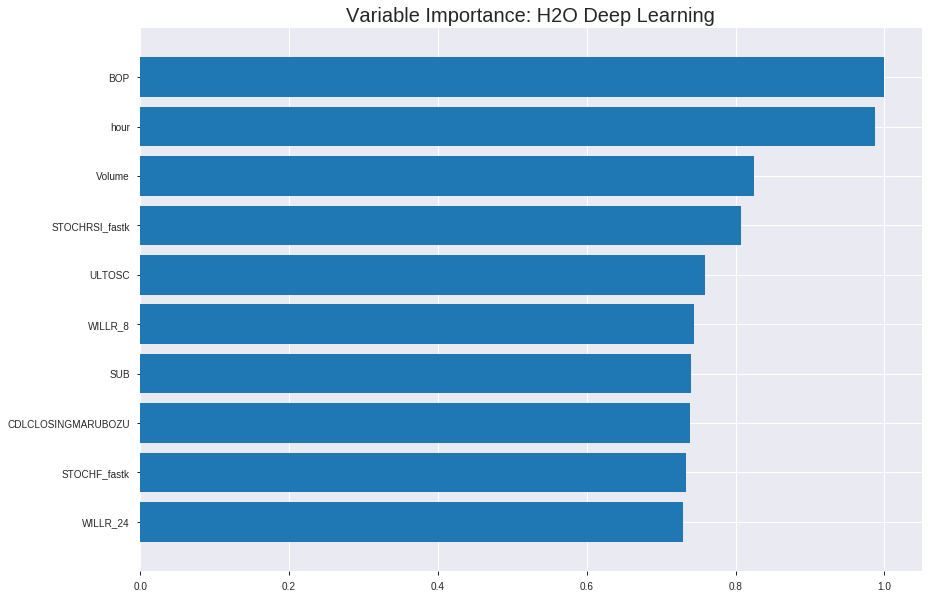

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190906_022339_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19034362052181464
RMSE: 0.4362838760736118
LogLoss: 0.5616064123495244
Mean Per-Class Error: 0.2867832555611325
AUC: 0.7879350439564534
pr_auc: 0.7684214687996456
Gini: 0.5758700879129068
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36725392492723746: 


,0,1,Error,Rate
0,345.0,358.0,0.5092,(358.0/703.0)
1,86.0,563.0,0.1325,(86.0/649.0)
Total,431.0,921.0,0.3284,(444.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3672539,0.7171975,259.0
max f2,0.1530249,0.8428306,339.0
max f0point5,0.6769906,0.7254418,126.0
max accuracy,0.6324667,0.7174556,147.0
max precision,0.9950206,1.0,0.0
max recall,0.0509045,1.0,378.0
max specificity,0.9950206,1.0,0.0
max absolute_mcc,0.6324667,0.4387729,147.0
max min_per_class_accuracy,0.5434317,0.7087827,187.0
max mean_per_class_accuracy,0.6257313,0.7132167,149.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 52.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9889686,2.0832049,2.0832049,1.0,0.9917913,1.0,0.9917913,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9857148,1.7856042,1.9344046,0.8571429,0.9871679,0.9285714,0.9894796,0.0184900,0.0400616,78.5604226,93.4404578
,3,0.0303254,0.9800715,1.7627119,1.8799654,0.8461538,0.9826119,0.9024390,0.9873020,0.0169492,0.0570108,76.2711864,87.9965425
,4,0.0406805,0.9739306,2.0832049,1.9316991,1.0,0.9776300,0.9272727,0.9848401,0.0215716,0.0785824,108.3204931,93.1699118
,5,0.0502959,0.9627567,1.6024653,1.8687574,0.7692308,0.9696262,0.8970588,0.9819315,0.0154083,0.0939908,60.2465331,86.8757364
,6,0.1005917,0.9143725,1.9300281,1.8993927,0.9264706,0.9403495,0.9117647,0.9611405,0.0970724,0.1910632,93.0028098,89.9392731
,7,0.1501479,0.8528260,1.6790010,1.8266526,0.8059701,0.8839863,0.8768473,0.9356758,0.0832049,0.2742681,67.9000989,82.6652599
,8,0.2004438,0.8037869,1.5624037,1.7603466,0.75,0.8275993,0.8450185,0.9085570,0.0785824,0.3528505,56.2403698,76.0346602
,9,0.3002959,0.7020380,1.4659590,1.6624591,0.7037037,0.7515167,0.7980296,0.8563392,0.1463790,0.4992296,46.5959025,66.2459107
,10,0.4001479,0.6180957,1.1881984,1.5441131,0.5703704,0.6549948,0.7412200,0.8060961,0.1186441,0.6178737,18.8198368,54.4113082




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1786310573878104
RMSE: 0.42264767524240615
LogLoss: 0.5364683416715696
Mean Per-Class Error: 0.24970430107526886
AUC: 0.8097043010752688
pr_auc: 0.7809874960416867
Gini: 0.6194086021505376
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4275330756160236: 


,0,1,Error,Rate
0,127.0,73.0,0.365,(73.0/200.0)
1,25.0,161.0,0.1344,(25.0/186.0)
Total,152.0,234.0,0.2539,(98.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4275331,0.7666667,233.0
max f2,0.2642850,0.8558994,289.0
max f0point5,0.6375427,0.7452575,137.0
max accuracy,0.4275331,0.7461140,233.0
max precision,0.9967921,1.0,0.0
max recall,0.0399463,1.0,371.0
max specificity,0.9967921,1.0,0.0
max absolute_mcc,0.4275331,0.5119472,233.0
max min_per_class_accuracy,0.5310480,0.73,189.0
max mean_per_class_accuracy,0.4275331,0.7502957,233.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 50.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9861342,2.0752688,2.0752688,1.0,0.9897961,1.0,0.9897961,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9797864,2.0752688,2.0752688,1.0,0.9836213,1.0,0.9867087,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.9721958,2.0752688,2.0752688,1.0,0.9752359,1.0,0.9828844,0.0215054,0.0645161,107.5268817,107.5268817
,4,0.0414508,0.9628959,2.0752688,2.0752688,1.0,0.9672499,1.0,0.9789758,0.0215054,0.0860215,107.5268817,107.5268817
,5,0.0518135,0.9530940,1.5564516,1.9715054,0.75,0.9594429,0.95,0.9750692,0.0161290,0.1021505,55.6451613,97.1505376
,6,0.1010363,0.9069428,1.6383701,1.8092087,0.7894737,0.9281118,0.8717949,0.9521925,0.0806452,0.1827957,63.8370119,80.9208712
,7,0.1502591,0.8393908,1.7475948,1.7890248,0.8421053,0.8723246,0.8620690,0.9260289,0.0860215,0.2688172,74.7594793,78.9024842
,8,0.2020725,0.7598005,1.4526882,1.7027847,0.7,0.8010999,0.8205128,0.8939958,0.0752688,0.3440860,45.2688172,70.2784671
,9,0.3005181,0.6816233,1.4745331,1.6280126,0.7105263,0.7181593,0.7844828,0.8363942,0.1451613,0.4892473,47.4533107,62.8012607
,10,0.4015544,0.6146200,1.4367246,1.5798821,0.6923077,0.6440269,0.7612903,0.7879921,0.1451613,0.6344086,43.6724566,57.9882067



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:24:18,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-09-06 02:24:20,39.398 sec,7616 obs/sec,10.0,1,13520.0,0.4362839,0.5616064,0.2374090,0.7879350,0.7684215,2.0832049,0.3284024,0.4226477,0.5364683,0.2845346,0.8097043,0.7809875,2.0752688,0.2538860
,2019-09-06 02:24:25,44.650 sec,11630 obs/sec,60.0,6,81120.0,0.4199882,0.5393999,0.2933124,0.8197994,0.7688380,2.0832049,0.2936391,0.4320488,0.5941858,0.2523519,0.8031720,0.7674222,2.0752688,0.2590674
,2019-09-06 02:24:31,50.042 sec,14277 obs/sec,130.0,13,175760.0,0.3946208,0.4923964,0.3761025,0.8578961,0.8092647,2.0832049,0.2322485,0.4651938,0.7375175,0.1332387,0.7792473,0.7425049,2.0752688,0.3134715
,2019-09-06 02:24:36,55.566 sec,15971 obs/sec,210.0,21,283920.0,0.3680770,0.4296891,0.4572113,0.8899774,0.8162420,2.0832049,0.2004438,0.4733699,0.7957165,0.1025030,0.7604839,0.7170010,2.0752688,0.3290155
,2019-09-06 02:24:42,1 min 0.854 sec,17041 obs/sec,290.0,29,392080.0,0.3353080,0.3585894,0.5495557,0.9229113,0.8094866,2.0832049,0.1605030,0.4703550,0.8606934,0.1138992,0.7783602,0.7279332,2.0752688,0.3056995
,2019-09-06 02:24:47,1 min 6.040 sec,17779 obs/sec,370.0,37,500240.0,0.3032017,0.2967250,0.6316873,0.9484271,0.8026385,2.0832049,0.1153846,0.4825696,0.9207083,0.0672792,0.7636828,0.7175338,2.0752688,0.3056995
,2019-09-06 02:24:47,1 min 6.103 sec,17776 obs/sec,370.0,37,500240.0,0.4362839,0.5616064,0.2374090,0.7879350,0.7684215,2.0832049,0.3284024,0.4226477,0.5364683,0.2845346,0.8097043,0.7809875,2.0752688,0.2538860


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0443777
hour,0.9869304,0.9869304,0.0437977
Volume,0.8241857,0.8241857,0.0365755
STOCHRSI_fastk,0.8076177,0.8076177,0.0358402
ULTOSC,0.7584355,0.7584355,0.0336576
---,---,---,---
CDLLONGLINE,0.6169764,0.6169764,0.0273800
ROCR_8,0.6104806,0.6104806,0.0270917
WILLR_20,0.6098704,0.6098704,0.0270646
ROCR100_8,0.6066817,0.6066817,0.0269231



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7061855670103093)

('F1', 0.6629834254143646)

('auc', 0.73301393728223)

('logloss', 0.6390908358920738)

('mean_per_class_error', 0.30825348432055755)

('rmse', 0.4616252320168156)

('mse', 0.21309785483457885)

deeplearning prediction progress: |███████████████████████████████████████| 100%


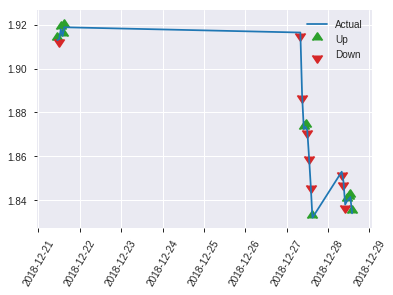


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.21309785483457885
RMSE: 0.4616252320168156
LogLoss: 0.6390908358920738
Mean Per-Class Error: 0.30825348432055755
AUC: 0.73301393728223
pr_auc: 0.6420778623489645
Gini: 0.46602787456445993
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47358478934992787: 


,0,1,Error,Rate
0,73.0,39.0,0.3482,(39.0/112.0)
1,22.0,60.0,0.2683,(22.0/82.0)
Total,95.0,99.0,0.3144,(61.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4735848,0.6629834,98.0
max f2,0.0472974,0.7961165,186.0
max f0point5,0.6197778,0.6578947,64.0
max accuracy,0.6197778,0.7061856,64.0
max precision,0.9976636,1.0,0.0
max recall,0.0472974,1.0,186.0
max specificity,0.9976636,1.0,0.0
max absolute_mcc,0.6044656,0.3887591,68.0
max min_per_class_accuracy,0.4916309,0.6696429,91.0
max mean_per_class_accuracy,0.4735848,0.6917465,98.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 47.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9917639,1.1829268,1.1829268,0.5,0.9955542,0.5,0.9955542,0.0121951,0.0121951,18.2926829,18.2926829
,2,0.0206186,0.9838957,2.3658537,1.7743902,1.0,0.9891692,0.75,0.9923617,0.0243902,0.0365854,136.5853659,77.4390244
,3,0.0309278,0.9787809,1.1829268,1.5772358,0.5,0.9817120,0.6666667,0.9888118,0.0121951,0.0487805,18.2926829,57.7235772
,4,0.0412371,0.9633918,2.3658537,1.7743902,1.0,0.9719010,0.75,0.9845841,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.9414099,2.3658537,1.8926829,1.0,0.9565944,0.8,0.9789862,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.8729447,1.6560976,1.7743902,0.7,0.8969828,0.75,0.9379845,0.0853659,0.1829268,65.6097561,77.4390244
,7,0.1494845,0.7651520,1.5772358,1.7132044,0.6666667,0.8055859,0.7241379,0.8968953,0.0731707,0.2560976,57.7235772,71.3204373
,8,0.2010309,0.7223414,2.3658537,1.8805503,1.0,0.7421300,0.7948718,0.8572119,0.1219512,0.3780488,136.5853659,88.0550344
,9,0.2989691,0.6355580,0.9961489,1.5908326,0.4210526,0.6765170,0.6724138,0.7980187,0.0975610,0.4756098,-0.3851091,59.0832632
,10,0.4020619,0.5454993,1.0646341,1.4559099,0.45,0.5976642,0.6153846,0.7466458,0.1097561,0.5853659,6.4634146,45.5909944


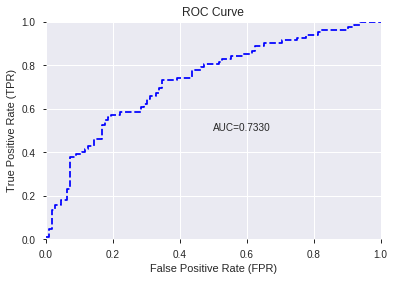

This function is available for GLM models only


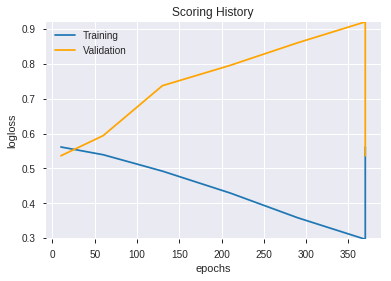

--2019-09-06 02:31:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.185.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.185.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190906_022339_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190906_022339_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'hour',
 'Volume',
 'STOCHRSI_fastk',
 'ULTOSC',
 'WILLR_8',
 'SUB',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastk',
 'WILLR_24',
 'CDLSHORTLINE',
 'DIV',
 'CDLBELTHOLD',
 'TRANGE',
 'CDLDRAGONFLYDOJI',
 'RSI_12',
 'CDLTAKURI',
 'ADOSC',
 'CMO_12',
 'CDLHAMMER',
 'CDLMARUBOZU',
 'WILLR_14',
 'RSI_8',
 'ROCP_8',
 'CDLENGULFING',
 'WILLR_12',
 'ROC_8',
 'CDLLONGLINE',
 'ROCR_8',
 'WILLR_20',
 'ROCR100_8',
 'CMO_8']

In [47]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190906_023210_model_1,0.71973,0.606941,0.339395,0.45942,0.211066


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.856223,1.000000,0.244632
1,CDLCLOSINGMARUBOZU,0.407505,0.475933,0.116429
2,CDLTAKURI,0.229874,0.268475,0.065678
3,CDLHAMMER,0.208665,0.243705,0.059618
4,ADOSC,0.177240,0.207002,0.050639
5,hour,0.168430,0.196713,0.048122
6,CDLBELTHOLD,0.164005,0.191544,0.046858
7,DIV,0.133040,0.155380,0.038011
8,Volume,0.123136,0.143813,0.035181
9,WILLR_24,0.107083,0.125065,0.030595


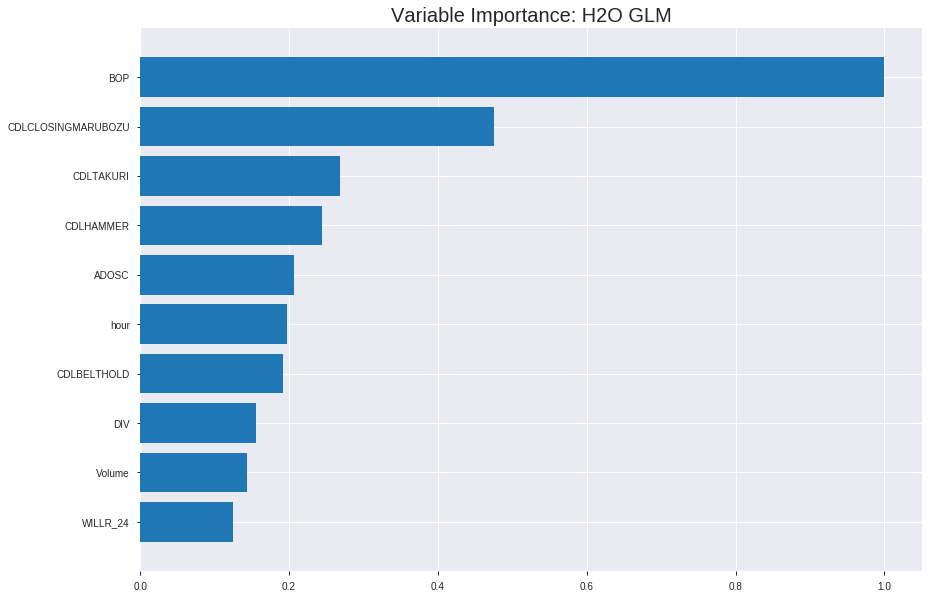

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190906_023210_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1905703841452933
RMSE: 0.4365436795388215
LogLoss: 0.5612664777311943
Null degrees of freedom: 1351
Residual degrees of freedom: 1319
Null deviance: 1872.112597686563
Residual deviance: 1517.6645557851493
AIC: 1583.6645557851493
AUC: 0.7811218484724284
pr_auc: 0.7569474137122012
Gini: 0.5622436969448568
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33944360035329085: 


,0,1,Error,Rate
0,332.0,371.0,0.5277,(371.0/703.0)
1,78.0,571.0,0.1202,(78.0/649.0)
Total,410.0,942.0,0.3321,(449.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3394436,0.7177876,267.0
max f2,0.2415258,0.8375976,314.0
max f0point5,0.5981756,0.7194680,139.0
max accuracy,0.5981756,0.7093195,139.0
max precision,0.9501676,1.0,0.0
max recall,0.0596969,1.0,386.0
max specificity,0.9501676,1.0,0.0
max absolute_mcc,0.5981756,0.4290024,139.0
max min_per_class_accuracy,0.4873062,0.7012802,195.0
max mean_per_class_accuracy,0.4568406,0.7063334,209.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9181072,1.7856042,1.7856042,0.8571429,0.9318145,0.8571429,0.9318145,0.0184900,0.0184900,78.5604226,78.5604226
,2,0.0207101,0.9067940,1.7856042,1.7856042,0.8571429,0.9126255,0.8571429,0.9222200,0.0184900,0.0369800,78.5604226,78.5604226
,3,0.0303254,0.8927183,2.0832049,1.8799654,1.0,0.8985421,0.9024390,0.9147123,0.0200308,0.0570108,108.3204931,87.9965425
,4,0.0406805,0.8840276,1.4880035,1.7801933,0.7142857,0.8891319,0.8545455,0.9082009,0.0154083,0.0724191,48.8003522,78.0193304
,5,0.0502959,0.8701539,1.9229584,1.8074866,0.9230769,0.8777641,0.8676471,0.9023821,0.0184900,0.0909091,92.2958398,80.7486631
,6,0.1005917,0.8075842,1.9300281,1.8687574,0.9264706,0.8397714,0.8970588,0.8710768,0.0970724,0.1879815,93.0028098,86.8757364
,7,0.1501479,0.7435934,1.5546305,1.7650800,0.7462687,0.7779595,0.8472906,0.8403435,0.0770416,0.2650231,55.4630545,76.5080040
,8,0.2004438,0.6892419,1.6849452,1.7449724,0.8088235,0.7159885,0.8376384,0.8091400,0.0847458,0.3497689,68.4945165,74.4972396
,9,0.3002959,0.6239685,1.4505279,1.6470660,0.6962963,0.6570520,0.7906404,0.7585689,0.1448382,0.4946071,45.0527878,64.7065967
,10,0.4001479,0.5495952,1.1264738,1.5171585,0.5407407,0.5876375,0.7282810,0.7159150,0.1124807,0.6070878,12.6473777,51.7158489




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17969996416765407
RMSE: 0.4239103256204714
LogLoss: 0.5373918015605942
Null degrees of freedom: 385
Residual degrees of freedom: 353
Null deviance: 534.6069507592587
Residual deviance: 414.86647080477866
AIC: 480.86647080477866
AUC: 0.8084139784946237
pr_auc: 0.7842763164580382
Gini: 0.6168279569892474
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.329893210141168: 


,0,1,Error,Rate
0,111.0,89.0,0.445,(89.0/200.0)
1,19.0,167.0,0.1022,(19.0/186.0)
Total,130.0,256.0,0.2798,(108.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3298932,0.7556561,255.0
max f2,0.2215897,0.8553875,313.0
max f0point5,0.6225638,0.7507508,119.0
max accuracy,0.5052933,0.7461140,175.0
max precision,0.9285940,1.0,0.0
max recall,0.0555245,1.0,380.0
max specificity,0.9285940,1.0,0.0
max absolute_mcc,0.5052933,0.4912647,175.0
max min_per_class_accuracy,0.4705597,0.7204301,185.0
max mean_per_class_accuracy,0.5052933,0.7448387,175.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 47.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9170374,2.0752688,2.0752688,1.0,0.9222442,1.0,0.9222442,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.9042579,1.5564516,1.8158602,0.75,0.9115443,0.875,0.9168943,0.0161290,0.0376344,55.6451613,81.5860215
,3,0.0310881,0.8889717,2.0752688,1.9023297,1.0,0.8980223,0.9166667,0.9106036,0.0215054,0.0591398,107.5268817,90.2329749
,4,0.0414508,0.8703050,2.0752688,1.9455645,1.0,0.8823497,0.9375,0.9035401,0.0215054,0.0806452,107.5268817,94.5564516
,5,0.0518135,0.8660669,1.5564516,1.8677419,0.75,0.8679217,0.9,0.8964165,0.0161290,0.0967742,55.6451613,86.7741935
,6,0.1010363,0.8149076,1.8568195,1.8624207,0.8947368,0.8428473,0.8974359,0.8703187,0.0913978,0.1881720,85.6819468,86.2420733
,7,0.1502591,0.7508939,1.6383701,1.7890248,0.7894737,0.7823089,0.8620690,0.8414879,0.0806452,0.2688172,63.8370119,78.9024842
,8,0.2020725,0.7125950,1.9715054,1.8358147,0.95,0.7297404,0.8846154,0.8128347,0.1021505,0.3709677,97.1505376,83.5814723
,9,0.3005181,0.6319291,1.4745331,1.7174638,0.7105263,0.6730452,0.8275862,0.7670416,0.1451613,0.5161290,47.4533107,71.7463849
,10,0.4015544,0.5471742,1.1174524,1.5664932,0.5384615,0.5854366,0.7548387,0.7213474,0.1129032,0.6290323,11.7452440,56.6493236



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-09-06 02:32:11,0.000 sec,2,.19E2,33,1.3635466,1.3590463
,2019-09-06 02:32:11,0.005 sec,4,.12E2,33,1.3531358,1.3461795
,2019-09-06 02:32:11,0.014 sec,6,.72E1,33,1.3390166,1.3286476
,2019-09-06 02:32:11,0.024 sec,8,.45E1,33,1.3209106,1.3060243
,2019-09-06 02:32:11,0.031 sec,10,.28E1,33,1.2989719,1.2784476
---,---,---,---,---,---,---,---
,2019-09-06 02:32:11,0.137 sec,36,.57E-2,33,1.1212222,1.0748090
,2019-09-06 02:32:11,0.142 sec,38,.35E-2,33,1.1204477,1.0751044
,2019-09-06 02:32:11,0.145 sec,39,.22E-2,33,1.1199807,1.0754367
,2019-09-06 02:32:11,0.149 sec,40,.14E-2,33,1.1196931,1.0757373



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6752577319587629)

('F1', 0.6635514018691588)

('auc', 0.7197299651567944)

('logloss', 0.6069412878819991)

('mean_per_class_error', 0.32491289198606266)

('rmse', 0.4594196280940987)

('mse', 0.21106639467811994)

glm prediction progress: |████████████████████████████████████████████████| 100%


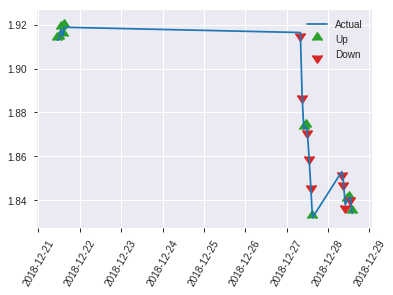


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21106639467811994
RMSE: 0.4594196280940987
LogLoss: 0.6069412878819991
Null degrees of freedom: 193
Residual degrees of freedom: 161
Null deviance: 266.85311025686934
Residual deviance: 235.49321969821568
AIC: 301.4932196982157
AUC: 0.7197299651567944
pr_auc: 0.6435294431842453
Gini: 0.4394599303135889
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31900424176151365: 


,0,1,Error,Rate
0,51.0,61.0,0.5446,(61.0/112.0)
1,11.0,71.0,0.1341,(11.0/82.0)
Total,62.0,132.0,0.3711,(72.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3190042,0.6635514,131.0
max f2,0.1972782,0.8077710,160.0
max f0point5,0.5834914,0.6137725,62.0
max accuracy,0.5967245,0.6752577,58.0
max precision,0.9529773,1.0,0.0
max recall,0.0876287,1.0,181.0
max specificity,0.9529773,1.0,0.0
max absolute_mcc,0.4310189,0.3459804,97.0
max min_per_class_accuracy,0.4442205,0.6585366,91.0
max mean_per_class_accuracy,0.4310189,0.6750871,97.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 44.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9105310,2.3658537,2.3658537,1.0,0.9337981,1.0,0.9337981,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.8892056,2.3658537,2.3658537,1.0,0.9009933,1.0,0.9173957,0.0243902,0.0487805,136.5853659,136.5853659
,3,0.0309278,0.8699463,1.1829268,1.9715447,0.5,0.8807736,0.8333333,0.9051883,0.0121951,0.0609756,18.2926829,97.1544715
,4,0.0412371,0.8643778,2.3658537,2.0701220,1.0,0.8687796,0.875,0.8960862,0.0243902,0.0853659,136.5853659,107.0121951
,5,0.0515464,0.8551077,2.3658537,2.1292683,1.0,0.8623770,0.9,0.8893443,0.0243902,0.1097561,136.5853659,112.9268293
,6,0.1030928,0.7609396,1.6560976,1.8926829,0.7,0.8068289,0.8,0.8480866,0.0853659,0.1951220,65.6097561,89.2682927
,7,0.1494845,0.7102117,1.3143631,1.7132044,0.5555556,0.7344626,0.7241379,0.8128240,0.0609756,0.2560976,31.4363144,71.3204373
,8,0.2010309,0.6448073,1.1829268,1.5772358,0.5,0.6702148,0.6666667,0.7762575,0.0609756,0.3170732,18.2926829,57.7235772
,9,0.2989691,0.5968323,1.4942234,1.5500421,0.6315789,0.6156436,0.6551724,0.7236426,0.1463415,0.4634146,49.4223363,55.0042052
,10,0.4020619,0.4805373,0.9463415,1.3952470,0.4,0.5432513,0.5897436,0.6773885,0.0975610,0.5609756,-5.3658537,39.5247029


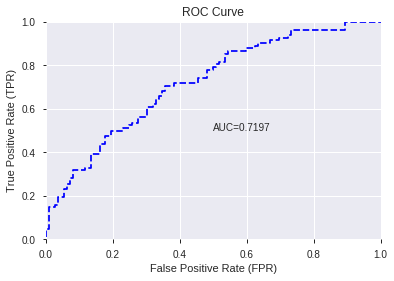

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


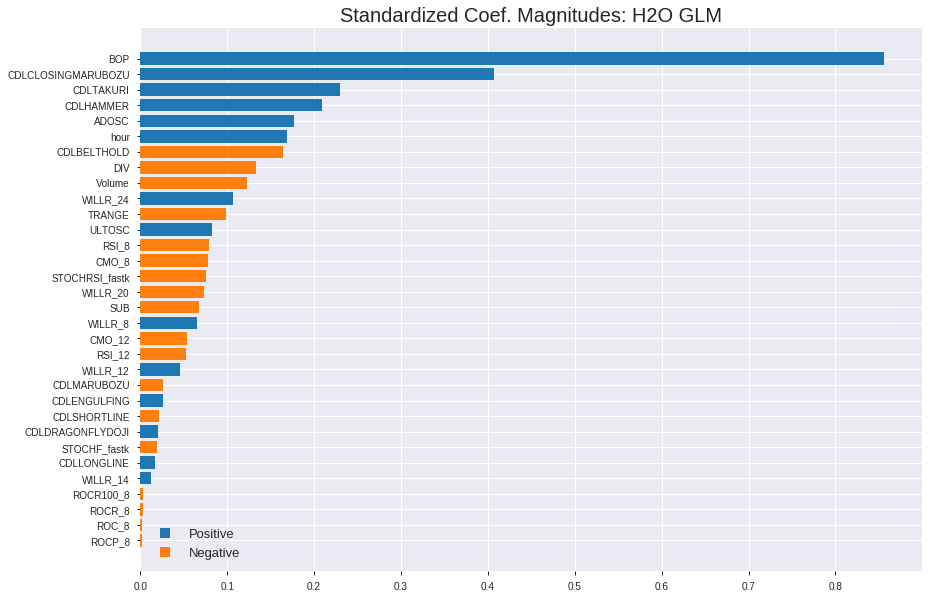

'log_likelihood'
--2019-09-06 02:32:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.137.44
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.137.44|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190906_023210_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190906_023210_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['BOP',
 'CDLCLOSINGMARUBOZU',
 'CDLTAKURI',
 'CDLHAMMER',
 'ADOSC',
 'hour',
 'CDLBELTHOLD',
 'DIV',
 'Volume',
 'WILLR_24',
 'TRANGE',
 'ULTOSC',
 'RSI_8',
 'CMO_8',
 'STOCHRSI_fastk',
 'WILLR_20',
 'SUB',
 'WILLR_8',
 'CMO_12',
 'RSI_12',
 'WILLR_12',
 'CDLMARUBOZU',
 'CDLENGULFING',
 'CDLSHORTLINE',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'WILLR_14',
 'ROCR100_8',
 'ROCR_8',
 'ROC_8',
 'ROCP_8']

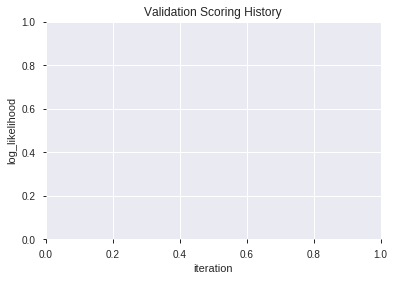

In [48]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190906_023317_model_6,0.726154,0.606986,0.333733,0.456496,0.208389
1,XGBoost_1_AutoML_20190906_023317,0.719839,0.621143,0.305749,0.462233,0.213659
2,XGBoost_grid_1_AutoML_20190906_023317_model_1,0.718641,0.616956,0.365309,0.461580,0.213056
3,XGBoost_grid_1_AutoML_20190906_023317_model_5,0.715592,0.633773,0.327744,0.465264,0.216471
4,XGBoost_3_AutoML_20190906_023317,0.713415,0.622977,0.336999,0.463486,0.214819
5,XGBoost_grid_1_AutoML_20190906_023317_model_3,0.706882,0.629546,0.311520,0.466097,0.217246
6,XGBoost_grid_1_AutoML_20190906_023317_model_2,0.705575,0.622794,0.359321,0.464582,0.215837
7,XGBoost_grid_1_AutoML_20190906_023317_model_7,0.705248,0.636720,0.317182,0.468329,0.219332
8,XGBoost_2_AutoML_20190906_023317,0.698171,0.635496,0.334168,0.469832,0.220742
9,XGBoost_grid_1_AutoML_20190906_023317_model_4,0.694251,0.632053,0.330902,0.469842,0.220751


,variable,relative_importance,scaled_importance,percentage
0,BOP,1769.313354,1.000000,0.205769
1,DIV,774.359802,0.437661,0.090057
2,STOCHF_fastk,733.677979,0.414668,0.085326
3,TRANGE,535.640076,0.302739,0.062294
4,ADOSC,495.896667,0.280276,0.057672
5,Volume,435.338715,0.246050,0.050629
6,hour,391.063416,0.221026,0.045480
7,ULTOSC,358.040710,0.202361,0.041640
8,SUB,299.328796,0.169178,0.034812
9,WILLR_8,279.362823,0.157893,0.032490


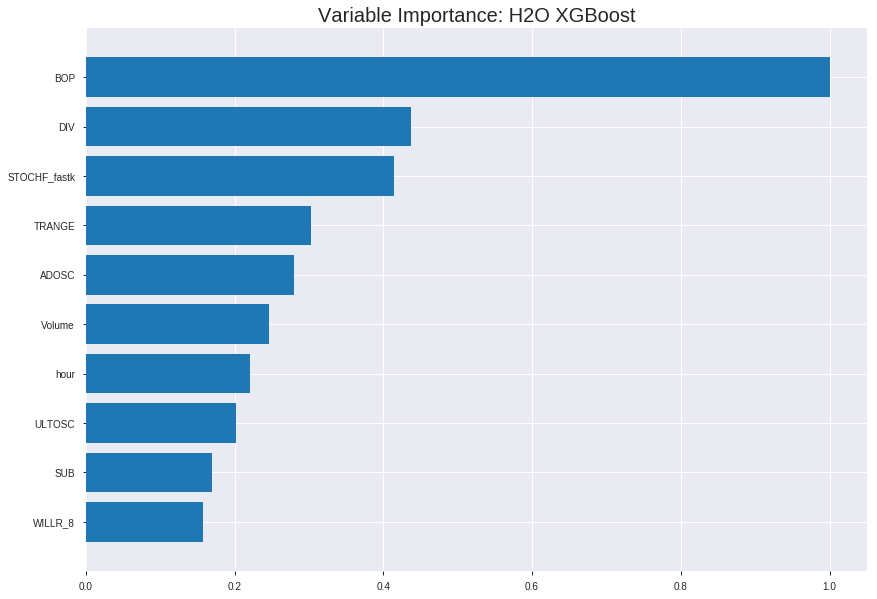

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190906_023317_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.12992739572841577
RMSE: 0.36045442947537176
LogLoss: 0.4197764639064347
Mean Per-Class Error: 0.16380929628030438
AUC: 0.9188805625023287
pr_auc: 0.9194750294486366
Gini: 0.8377611250046575
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48958101123571396: 


,0,1,Error,Rate
0,596.0,107.0,0.1522,(107.0/703.0)
1,118.0,531.0,0.1818,(118.0/649.0)
Total,714.0,638.0,0.1664,(225.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4895810,0.8251748,196.0
max f2,0.2757314,0.8894164,294.0
max f0point5,0.6187077,0.8632243,146.0
max accuracy,0.5196734,0.8380178,184.0
max precision,0.9579593,1.0,0.0
max recall,0.1453507,1.0,358.0
max specificity,0.9579593,1.0,0.0
max absolute_mcc,0.5598457,0.6788773,169.0
max min_per_class_accuracy,0.4806872,0.8258860,200.0
max mean_per_class_accuracy,0.5196734,0.8361907,184.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 47.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9340364,2.0832049,2.0832049,1.0,0.9417750,1.0,0.9417750,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9155741,2.0832049,2.0832049,1.0,0.9248420,1.0,0.9333085,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.9022368,2.0832049,2.0832049,1.0,0.9092427,1.0,0.9256779,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.8920022,2.0832049,2.0832049,1.0,0.8979861,1.0,0.9186291,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.8820718,2.0832049,2.0832049,1.0,0.8843106,1.0,0.9120682,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.8374527,2.0832049,2.0832049,1.0,0.8597331,1.0,0.8859006,0.1047766,0.2095532,108.3204931,108.3204931
,7,0.1501479,0.7815221,2.0210197,2.0626807,0.9701493,0.8096989,0.9901478,0.8607503,0.1001541,0.3097072,102.1019709,106.2680744
,8,0.2004438,0.7443038,2.0525696,2.0601436,0.9852941,0.7623541,0.9889299,0.8360605,0.1032357,0.4129430,105.2569564,106.0143621
,9,0.3002959,0.6568823,1.8517377,1.9908461,0.8888889,0.7003514,0.9556650,0.7909355,0.1848998,0.5978428,85.1737716,99.0846091
,10,0.4001479,0.5599898,1.4659590,1.8598669,0.7037037,0.6130074,0.8927911,0.7465357,0.1463790,0.7442219,46.5959025,85.9866879




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1687486433082779
RMSE: 0.4107902668129783
LogLoss: 0.514352081098923
Mean Per-Class Error: 0.21776881720430108
AUC: 0.8286290322580645
pr_auc: 0.7818546707507675
Gini: 0.657258064516129
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40805307030677795: 


,0,1,Error,Rate
0,143.0,57.0,0.285,(57.0/200.0)
1,28.0,158.0,0.1505,(28.0/186.0)
Total,171.0,215.0,0.2202,(85.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4080531,0.7880299,214.0
max f2,0.2629204,0.8585366,280.0
max f0point5,0.5325246,0.7696897,162.0
max accuracy,0.4080531,0.7797927,214.0
max precision,0.9465932,1.0,0.0
max recall,0.1055299,1.0,361.0
max specificity,0.9465932,1.0,0.0
max absolute_mcc,0.4080531,0.5677919,214.0
max min_per_class_accuracy,0.4599501,0.7688172,188.0
max mean_per_class_accuracy,0.4080531,0.7822312,214.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 47.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9142061,2.0752688,2.0752688,1.0,0.9385226,1.0,0.9385226,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.8966460,2.0752688,2.0752688,1.0,0.9077368,1.0,0.9231297,0.0215054,0.0430108,107.5268817,107.5268817
,3,0.0310881,0.8743800,1.5564516,1.9023297,0.75,0.8850880,0.9166667,0.9104492,0.0161290,0.0591398,55.6451613,90.2329749
,4,0.0414508,0.8673411,1.5564516,1.8158602,0.75,0.8719092,0.875,0.9008142,0.0161290,0.0752688,55.6451613,81.5860215
,5,0.0518135,0.8610132,2.0752688,1.8677419,1.0,0.8643324,0.9,0.8935178,0.0215054,0.0967742,107.5268817,86.7741935
,6,0.1010363,0.8227888,1.4199208,1.6495726,0.6842105,0.8385343,0.7948718,0.8667310,0.0698925,0.1666667,41.9920770,64.9572650
,7,0.1502591,0.7879295,1.6383701,1.6459029,0.7894737,0.8074339,0.7931034,0.8473061,0.0806452,0.2473118,63.8370119,64.5902855
,8,0.2020725,0.7492034,1.8677419,1.7027847,0.9,0.7675929,0.8205128,0.8268668,0.0967742,0.3440860,86.7741935,70.2784671
,9,0.3005181,0.6621166,1.6929825,1.6995736,0.8157895,0.7035377,0.8189655,0.7864659,0.1666667,0.5107527,69.2982456,69.9573600
,10,0.4015544,0.5530546,1.3835125,1.6200486,0.6666667,0.6046346,0.7806452,0.7407148,0.1397849,0.6505376,38.3512545,62.0048561



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:33:27,6.535 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5199704,0.5,0.6931472,0.5,0.0,1.0,0.5181347
,2019-09-06 02:33:27,6.585 sec,5.0,0.4701651,0.6348359,0.8451760,0.8456750,2.0832049,0.2381657,0.4710756,0.6365559,0.8256317,0.7874660,2.0752688,0.2564767
,2019-09-06 02:33:28,6.620 sec,10.0,0.4477085,0.5919846,0.8577810,0.8605274,2.0832049,0.2374260,0.4517872,0.5995506,0.8263575,0.7901939,2.0752688,0.2279793
,2019-09-06 02:33:28,6.659 sec,15.0,0.4313150,0.5605543,0.8653843,0.8721570,2.0832049,0.2174556,0.4374074,0.5716518,0.8337231,0.8025760,2.0752688,0.2176166
,2019-09-06 02:33:28,6.697 sec,20.0,0.4200258,0.5385015,0.8716079,0.8780699,2.0832049,0.2344675,0.4298957,0.5564744,0.8334677,0.7983241,2.0752688,0.2435233
,2019-09-06 02:33:28,6.738 sec,25.0,0.4096227,0.5178847,0.8778107,0.8842289,2.0832049,0.2107988,0.4242816,0.5443815,0.8316935,0.7938508,2.0752688,0.2383420
,2019-09-06 02:33:28,6.780 sec,30.0,0.4022801,0.5028010,0.8806315,0.8862862,2.0832049,0.2085799,0.4202185,0.5355746,0.8306720,0.7896629,2.0752688,0.2227979
,2019-09-06 02:33:28,6.818 sec,35.0,0.3961544,0.4901251,0.8845044,0.8892056,2.0832049,0.2218935,0.4171401,0.5286169,0.8318011,0.7916513,2.0752688,0.2202073
,2019-09-06 02:33:28,6.868 sec,40.0,0.3901090,0.4775154,0.8889943,0.8928904,2.0832049,0.2189349,0.4148485,0.5235137,0.8322312,0.7918370,2.0752688,0.2150259
,2019-09-06 02:33:28,6.910 sec,45.0,0.3862250,0.4694372,0.8914009,0.8953574,2.0832049,0.2071006,0.4125300,0.5185797,0.8339516,0.7959161,2.0752688,0.2227979


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1769.3133545,1.0,0.2057694
DIV,774.3598022,0.4376612,0.0900573
STOCHF_fastk,733.6779785,0.4146682,0.0853260
TRANGE,535.6400757,0.3027390,0.0622944
ADOSC,495.8966675,0.2802763,0.0576723
---,---,---,---
RSI_12,27.6773643,0.0156430,0.0032189
CDLENGULFING,25.8372860,0.0146030,0.0030049
CDLLONGLINE,15.5081377,0.0087651,0.0018036
ROCR_8,8.9196415,0.0050413,0.0010373



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.711340206185567)

('F1', 0.6634615384615384)

('auc', 0.726154181184669)

('logloss', 0.6069857541414376)

('mean_per_class_error', 0.30226480836236935)

('rmse', 0.45649610884301267)

('mse', 0.2083886973888117)

xgboost prediction progress: |████████████████████████████████████████████| 100%


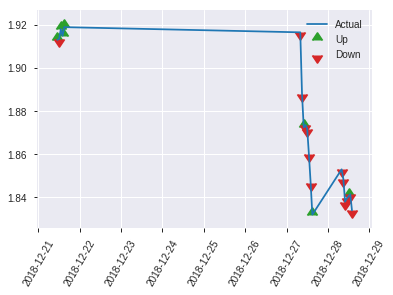


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2083886973888117
RMSE: 0.45649610884301267
LogLoss: 0.6069857541414376
Mean Per-Class Error: 0.30226480836236935
AUC: 0.726154181184669
pr_auc: 0.6295910644942968
Gini: 0.452308362369338
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2983850836753845: 


,0,1,Error,Rate
0,55.0,57.0,0.5089,(57.0/112.0)
1,13.0,69.0,0.1585,(13.0/82.0)
Total,68.0,126.0,0.3608,(70.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2983851,0.6634615,125.0
max f2,0.1979420,0.8094262,159.0
max f0point5,0.5151665,0.6629834,69.0
max accuracy,0.5151665,0.7113402,69.0
max precision,0.8869714,0.8571429,6.0
max recall,0.0848416,1.0,187.0
max specificity,0.9410233,0.9910714,0.0
max absolute_mcc,0.4958769,0.4021827,73.0
max min_per_class_accuracy,0.4242088,0.6585366,90.0
max mean_per_class_accuracy,0.4958769,0.6977352,73.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 42.91 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9353867,1.1829268,1.1829268,0.5,0.9398195,0.5,0.9398195,0.0121951,0.0121951,18.2926829,18.2926829
,2,0.0206186,0.9044112,2.3658537,1.7743902,1.0,0.9216018,0.75,0.9307106,0.0243902,0.0365854,136.5853659,77.4390244
,3,0.0309278,0.8898802,2.3658537,1.9715447,1.0,0.9023201,0.8333333,0.9212471,0.0243902,0.0609756,136.5853659,97.1544715
,4,0.0412371,0.8632159,1.1829268,1.7743902,0.5,0.8837295,0.75,0.9118677,0.0121951,0.0731707,18.2926829,77.4390244
,5,0.0515464,0.8479417,2.3658537,1.8926829,1.0,0.8544250,0.8,0.9003792,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.7575730,1.4195122,1.6560976,0.6,0.7974758,0.7,0.8489275,0.0731707,0.1707317,41.9512195,65.6097561
,7,0.1494845,0.7037317,1.5772358,1.6316232,0.6666667,0.7354267,0.6896552,0.8137031,0.0731707,0.2439024,57.7235772,63.1623213
,8,0.2010309,0.6524542,1.6560976,1.6378987,0.7,0.6780788,0.6923077,0.7789276,0.0853659,0.3292683,65.6097561,63.7898687
,9,0.2989691,0.5662216,1.6187420,1.6316232,0.6842105,0.6025780,0.6896552,0.7211579,0.1585366,0.4878049,61.8741977,63.1623213
,10,0.4020619,0.4746587,1.3012195,1.5469043,0.55,0.5226542,0.6538462,0.6702595,0.1341463,0.6219512,30.1219512,54.6904315


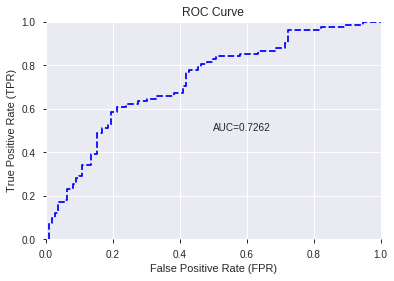

This function is available for GLM models only


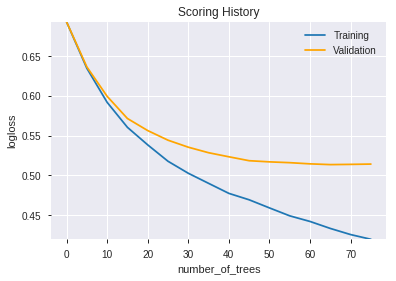

--2019-09-06 02:33:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.100.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.100.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190906_023317_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190906_023317_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BOP',
 'DIV',
 'STOCHF_fastk',
 'TRANGE',
 'ADOSC',
 'Volume',
 'hour',
 'ULTOSC',
 'SUB',
 'WILLR_8',
 'ROC_8',
 'CMO_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_14',
 'CMO_12',
 'CDLHAMMER',
 'WILLR_12',
 'WILLR_20',
 'STOCHRSI_fastk',
 'WILLR_24',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'ROCP_8',
 'CDLBELTHOLD',
 'RSI_8',
 'CDLSHORTLINE',
 'RSI_12',
 'CDLENGULFING',
 'CDLLONGLINE',
 'ROCR_8',
 'ROCR100_8']

In [49]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [50]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BBANDS_lowerband_20_1_4',
 'BBANDS_upperband_20_2_5',
 'BBANDS_upperband_20_5_3',
 'BBANDS_upperband_20_6_3',
 'BBANDS_lowerband_30_0_4',
 'BOP',
 'aroondown_8',
 'aroonup_8',
 'AROONOSC_8',
 'PLUS_DM_8',
 'RSI_8',
 'aroondown_12',
 'aroonup_12',
 'CCI_12',
 'WILLR_12',
 'ADX_14',
 'PLUS_DM_14',
 'ROCR100_14',
 'DX_20',
 'ROCR_20',
 'WILLR_20',
 'DX_24',
 'MACDFIX_signal_24',
 'MFI_24',
 'WILLR_24',
 'AROONOSC_30',
 'PLUS_DI_30',
 'PLUS_DM_30',
 'ROC_30',
 'ROCR_30',
 'MACDEXT_signal',
 'STOCH_slowd',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'ULTOSC',
 'ADOSC',
 'OBV',
 'ATR_8',
 'NATR_30',
 'TRANGE',
 'HT_DCPERIOD',
 'HT_PHASOR_inphase',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDOJI',
 'CDLHAMMER',
 'BETA_8',
 'LINEARREG_INTERCEPT_8',
 'LINEARREG_SLOPE_8',
 'VAR_8']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190906_023526_model_8,0.680749,0.674610,0.342661,0.476490,0.227042
1,DeepLearning_grid_1_AutoML_20190906_023526_model_9,0.678571,0.633218,0.353550,0.469624,0.220547
2,DeepLearning_grid_1_AutoML_20190906_023526_model_6,0.673454,0.667089,0.386433,0.480644,0.231019
3,DeepLearning_grid_1_AutoML_20190906_023526_model_7,0.672583,0.739613,0.358885,0.494776,0.244803
4,DeepLearning_grid_1_AutoML_20190906_023526_model_5,0.663436,0.648129,0.376307,0.475453,0.226056
5,DeepLearning_grid_1_AutoML_20190906_023526_model_4,0.655597,0.970273,0.412783,0.534291,0.285467
6,DeepLearning_grid_1_AutoML_20190906_023526_model_3,0.637848,0.892374,0.385235,0.533818,0.284961
7,DeepLearning_grid_1_AutoML_20190906_023526_model_2,0.636215,0.895184,0.418881,0.533433,0.284551
8,DeepLearning_grid_1_AutoML_20190906_023526_model_1,0.634037,1.048550,0.376307,0.554388,0.307346
9,DeepLearning_1_AutoML_20190906_023526,0.620536,0.795604,0.495536,0.514245,0.264448


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.044671
1,CDLCLOSINGMARUBOZU,0.939434,0.939434,0.041965
2,TRANGE,0.898799,0.898799,0.040150
3,aroondown_8,0.568285,0.568285,0.025386
4,ADX_14,0.566960,0.566960,0.025327
5,HT_DCPERIOD,0.551696,0.551696,0.024645
6,CDLHAMMER,0.526546,0.526546,0.023521
7,CDLDOJI,0.516541,0.516541,0.023074
8,OBV,0.503542,0.503542,0.022494
9,STOCHRSI_fastk,0.498563,0.498563,0.022271


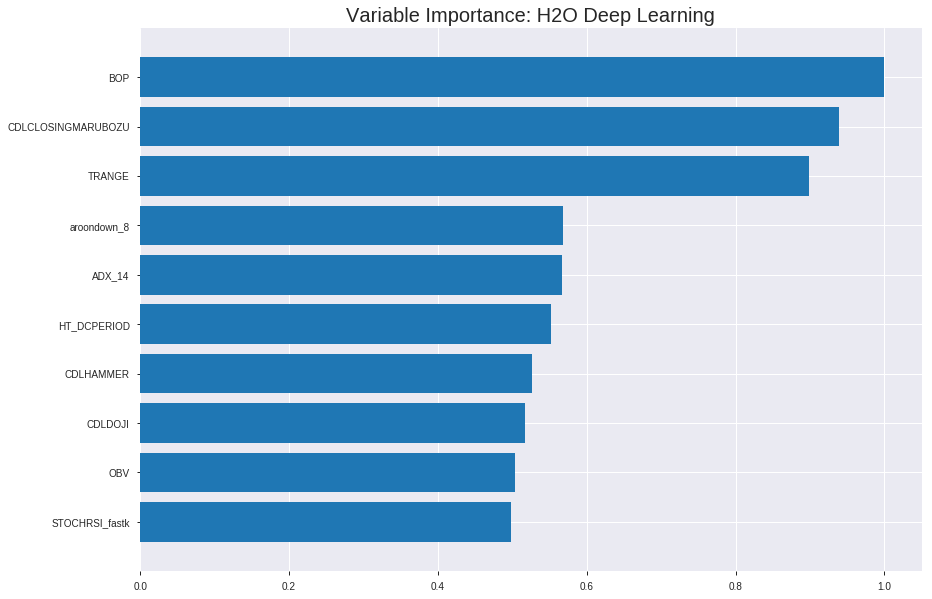

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190906_023526_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.16178154830140504
RMSE: 0.40222077059918854
LogLoss: 0.4816538151856963
Mean Per-Class Error: 0.2541331778619914
AUC: 0.8465962515917913
pr_auc: 0.8436180095868988
Gini: 0.6931925031835826
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4346175942159868: 


,0,1,Error,Rate
0,394.0,309.0,0.4395,(309.0/703.0)
1,59.0,590.0,0.0909,(59.0/649.0)
Total,453.0,899.0,0.2722,(368.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4346176,0.7622739,241.0
max f2,0.3170551,0.8647237,289.0
max f0point5,0.6353206,0.7751938,128.0
max accuracy,0.5276306,0.7463018,181.0
max precision,0.9971974,1.0,0.0
max recall,0.0457355,1.0,377.0
max specificity,0.9971974,1.0,0.0
max absolute_mcc,0.6353206,0.5071178,128.0
max min_per_class_accuracy,0.5112825,0.7425320,191.0
max mean_per_class_accuracy,0.5173975,0.7458668,187.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 50.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9869076,2.0832049,2.0832049,1.0,0.9917466,1.0,0.9917466,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9787982,2.0832049,2.0832049,1.0,0.9832737,1.0,0.9875102,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.9709659,2.0832049,2.0832049,1.0,0.9755798,1.0,0.9837274,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.9549815,2.0832049,2.0832049,1.0,0.9642920,1.0,0.9787802,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.9466718,1.9229584,2.0525696,0.9230769,0.9510795,0.9852941,0.9734845,0.0184900,0.1032357,92.2958398,105.2569564
,6,0.1005917,0.8812275,2.0525696,2.0525696,0.9852941,0.9182400,0.9852941,0.9458622,0.1032357,0.2064715,105.2569564,105.2569564
,7,0.1501479,0.7787106,1.9899271,2.0318945,0.9552239,0.8302955,0.9753695,0.9077195,0.0986133,0.3050847,98.9927098,103.1894464
,8,0.2004438,0.7103918,1.7768513,1.9678984,0.8529412,0.7421555,0.9446494,0.8661758,0.0893683,0.3944530,77.6851264,96.7898385
,9,0.3002959,0.6233361,1.4505279,1.7958663,0.6962963,0.6639315,0.8620690,0.7989270,0.1448382,0.5392912,45.0527878,79.5866320
,10,0.4001479,0.5618632,1.0493180,1.6095742,0.5037037,0.5915922,0.7726433,0.7471891,0.1047766,0.6440678,4.9318039,60.9574235




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1971923456934574
RMSE: 0.44406344782413404
LogLoss: 0.5824884843894061
Mean Per-Class Error: 0.29809139784946237
AUC: 0.7659139784946237
pr_auc: 0.7332004608132552
Gini: 0.5318279569892475
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34460437347192135: 


,0,1,Error,Rate
0,99.0,101.0,0.505,(101.0/200.0)
1,22.0,164.0,0.1183,(22.0/186.0)
Total,121.0,265.0,0.3187,(123.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3446044,0.7272727,264.0
max f2,0.0817651,0.8440959,339.0
max f0point5,0.5228226,0.6954436,161.0
max accuracy,0.5228226,0.6994819,161.0
max precision,0.8875351,0.9411765,16.0
max recall,0.0146796,1.0,374.0
max specificity,0.9936758,0.995,0.0
max absolute_mcc,0.4670158,0.4064480,215.0
max min_per_class_accuracy,0.4884544,0.685,190.0
max mean_per_class_accuracy,0.4670158,0.7019086,215.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 44.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.9737447,1.5564516,1.5564516,0.75,0.9822875,0.75,0.9822875,0.0161290,0.0161290,55.6451613,55.6451613
,2,0.0207254,0.9650397,2.0752688,1.8158602,1.0,0.9708590,0.875,0.9765732,0.0215054,0.0376344,107.5268817,81.5860215
,3,0.0310881,0.9338077,2.0752688,1.9023297,1.0,0.9533945,0.9166667,0.9688470,0.0215054,0.0591398,107.5268817,90.2329749
,4,0.0414508,0.8881890,2.0752688,1.9455645,1.0,0.9050275,0.9375,0.9528921,0.0215054,0.0806452,107.5268817,94.5564516
,5,0.0518135,0.8778865,1.5564516,1.8677419,0.75,0.8834015,0.9,0.9389940,0.0161290,0.0967742,55.6451613,86.7741935
,6,0.1010363,0.7339840,1.8568195,1.8624207,0.8947368,0.7938125,0.8974359,0.8682645,0.0913978,0.1881720,85.6819468,86.2420733
,7,0.1502591,0.6713671,1.6383701,1.7890248,0.7894737,0.7047064,0.8620690,0.8146852,0.0806452,0.2688172,63.8370119,78.9024842
,8,0.2020725,0.6186517,1.0376344,1.5963606,0.5,0.6466332,0.7692308,0.7715949,0.0537634,0.3225806,3.7634409,59.6360629
,9,0.3005181,0.5707546,1.3653084,1.5206711,0.6578947,0.5901181,0.7327586,0.7121456,0.1344086,0.4569892,36.5308432,52.0671116
,10,0.4015544,0.5294746,1.2770885,1.4593826,0.6153846,0.5451618,0.7032258,0.6701304,0.1290323,0.5860215,27.7088503,45.9382588



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:40:44,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-09-06 02:40:46,1 min 16.366 sec,656 obs/sec,0.9164201,1,1239.0,0.5830952,1.0470143,-0.3621729,0.7267379,0.6852311,1.7856042,0.3454142,0.5932321,1.0740440,-0.4095516,0.7444355,0.6909059,2.0752688,0.3134715
,2019-09-06 02:40:57,1 min 27.390 sec,1035 obs/sec,9.1042899,10,12309.0,0.4406164,0.5693170,0.2221880,0.7841191,0.7715696,2.0832049,0.3321006,0.4556184,0.6022485,0.1685536,0.7695161,0.7300105,1.5564516,0.2746114
,2019-09-06 02:41:08,1 min 37.853 sec,1153 obs/sec,18.2189349,20,24632.0,0.4261496,0.5361877,0.2724253,0.8100590,0.8033956,2.0832049,0.2995562,0.4556026,0.6026106,0.1686113,0.7722043,0.7469103,1.5564516,0.3290155
,2019-09-06 02:41:19,1 min 48.446 sec,1230 obs/sec,28.1937870,31,38118.0,0.4208526,0.5246203,0.2904002,0.8203736,0.8145103,2.0832049,0.2884615,0.4527429,0.5970274,0.1790154,0.7647312,0.7312652,1.5564516,0.2979275
,2019-09-06 02:41:29,1 min 58.767 sec,1281 obs/sec,38.2019231,42,51649.0,0.4022208,0.4816538,0.3518398,0.8465963,0.8436180,2.0832049,0.2721893,0.4440634,0.5824885,0.2101916,0.7659140,0.7332005,1.5564516,0.3186528
,2019-09-06 02:41:39,2 min 9.113 sec,1311 obs/sec,48.1804734,53,65140.0,0.3934276,0.4630265,0.3798696,0.8711575,0.8682966,2.0832049,0.2307692,0.4639475,0.6382327,0.1378769,0.7578226,0.7118751,1.5564516,0.3082902
,2019-09-06 02:41:49,2 min 19.311 sec,1336 obs/sec,58.1575444,64,78629.0,0.3768499,0.4285134,0.4310289,0.8836891,0.8660633,2.0832049,0.2300296,0.4661547,0.6576211,0.1296544,0.7483333,0.7069055,1.5564516,0.3393782
,2019-09-06 02:41:50,2 min 20.359 sec,1335 obs/sec,58.1575444,64,78629.0,0.4022208,0.4816538,0.3518398,0.8465963,0.8436180,2.0832049,0.2721893,0.4440634,0.5824885,0.2101916,0.7659140,0.7332005,1.5564516,0.3186528


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0446710
CDLCLOSINGMARUBOZU,0.9394341,0.9394341,0.0419655
TRANGE,0.8987988,0.8987988,0.0401503
aroondown_8,0.5682853,0.5682853,0.0253859
ADX_14,0.5669599,0.5669599,0.0253267
---,---,---,---
LINEARREG_INTERCEPT_8,0.3190417,0.3190417,0.0142519
ROCR_30,0.3178005,0.3178005,0.0141965
BBANDS_lowerband_30_0_4,0.3123384,0.3123384,0.0139525
ROC_30,0.3113768,0.3113768,0.0139095



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.654639175257732)

('F1', 0.6571428571428573)

('auc', 0.6807491289198607)

('logloss', 0.6746096312868748)

('mean_per_class_error', 0.342661149825784)

('rmse', 0.4764895432809679)

('mse', 0.22704228485610534)

deeplearning prediction progress: |███████████████████████████████████████| 100%


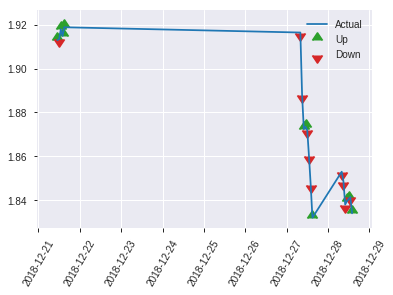


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.22704228485610534
RMSE: 0.4764895432809679
LogLoss: 0.6746096312868748
Mean Per-Class Error: 0.342661149825784
AUC: 0.6807491289198607
pr_auc: 0.5740109975755042
Gini: 0.36149825783972145
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4128354606672242: 


,0,1,Error,Rate
0,53.0,59.0,0.5268,(59.0/112.0)
1,13.0,69.0,0.1585,(13.0/82.0)
Total,66.0,128.0,0.3711,(72.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4128355,0.6571429,127.0
max f2,0.0119396,0.7930368,188.0
max f0point5,0.5024060,0.5917874,82.0
max accuracy,0.5081198,0.6546392,78.0
max precision,0.9806086,1.0,0.0
max recall,0.0119396,1.0,188.0
max specificity,0.9806086,1.0,0.0
max absolute_mcc,0.4128355,0.3280990,127.0
max min_per_class_accuracy,0.4918990,0.6341463,90.0
max mean_per_class_accuracy,0.4128355,0.6573389,127.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 44.21 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.9731728,2.3658537,2.3658537,1.0,0.9805742,1.0,0.9805742,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.9357254,0.0,1.1829268,0.0,0.9698779,0.5,0.9752261,0.0,0.0243902,-100.0,18.2926829
,3,0.0309278,0.9136139,2.3658537,1.5772358,1.0,0.9242859,0.6666667,0.9582460,0.0243902,0.0487805,136.5853659,57.7235772
,4,0.0412371,0.8791433,2.3658537,1.7743902,1.0,0.9098554,0.75,0.9461484,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.8500081,2.3658537,1.8926829,1.0,0.8609680,0.8,0.9291123,0.0243902,0.0975610,136.5853659,89.2682927
,6,0.1030928,0.6884161,1.1829268,1.5378049,0.5,0.7776426,0.65,0.8533774,0.0609756,0.1585366,18.2926829,53.7804878
,7,0.1494845,0.6274730,1.3143631,1.4684609,0.5555556,0.6609362,0.6206897,0.7936543,0.0609756,0.2195122,31.4363144,46.8460892
,8,0.2010309,0.6116691,1.4195122,1.4559099,0.6,0.6199258,0.6153846,0.7491085,0.0731707,0.2926829,41.9512195,45.5909944
,9,0.2989691,0.5608852,1.1206675,1.3460892,0.4736842,0.5858345,0.5689655,0.6956222,0.1097561,0.4024390,12.0667522,34.6089151
,10,0.4020619,0.5093765,1.5378049,1.3952470,0.65,0.5376672,0.5897436,0.6551209,0.1585366,0.5609756,53.7804878,39.5247029


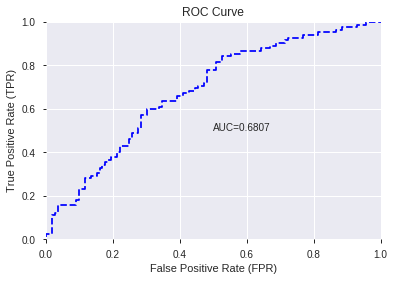

This function is available for GLM models only


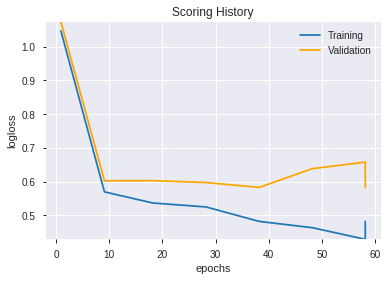

--2019-09-06 02:43:29--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.171
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.171|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190906_023526_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190906_023526_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'TRANGE',
 'aroondown_8',
 'ADX_14',
 'HT_DCPERIOD',
 'CDLHAMMER',
 'CDLDOJI',
 'OBV',
 'STOCHRSI_fastk',
 'CCI_12',
 'STOCH_slowd',
 'DX_20',
 'AROONOSC_30',
 'BETA_8',
 'ATR_8',
 'aroonup_12',
 'NATR_30',
 'ULTOSC',
 'VAR_8',
 'CDLBELTHOLD',
 'MACDFIX_signal_24',
 'AROONOSC_8',
 'STOCHF_fastk',
 'PLUS_DM_8',
 'DX_24',
 'aroondown_12',
 'aroonup_8',
 'PLUS_DM_30',
 'ADOSC',
 'ROCR_20',
 'WILLR_24',
 'PLUS_DI_30',
 'MFI_24',
 'ROCR100_14',
 'WILLR_12',
 'LINEARREG_SLOPE_8',
 'MACDEXT_signal',
 'BBANDS_lowerband_20_1_4',
 'HT_PHASOR_inphase',
 'PLUS_DM_14',
 'WILLR_20',
 'BBANDS_upperband_20_5_3',
 'BBANDS_upperband_20_6_3',
 'BBANDS_upperband_20_2_5',
 'LINEARREG_INTERCEPT_8',
 'ROCR_30',
 'BBANDS_lowerband_30_0_4',
 'ROC_30',
 'RSI_8']

In [51]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190906_024426_model_1,0.696755,0.620803,0.343097,0.465274,0.21648


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.591535,1.000000,0.153081
1,CDLCLOSINGMARUBOZU,0.337527,0.570595,0.087347
2,TRANGE,0.329910,0.557718,0.085376
3,CDLHAMMER,0.228253,0.385866,0.059069
4,PLUS_DM_8,0.158319,0.267640,0.040971
5,STOCH_slowd,0.153503,0.259500,0.039725
6,ULTOSC,0.151572,0.256235,0.039225
7,ADOSC,0.145113,0.245317,0.037553
8,VAR_8,0.134939,0.228116,0.034920
9,MACDEXT_signal,0.125080,0.211449,0.032369


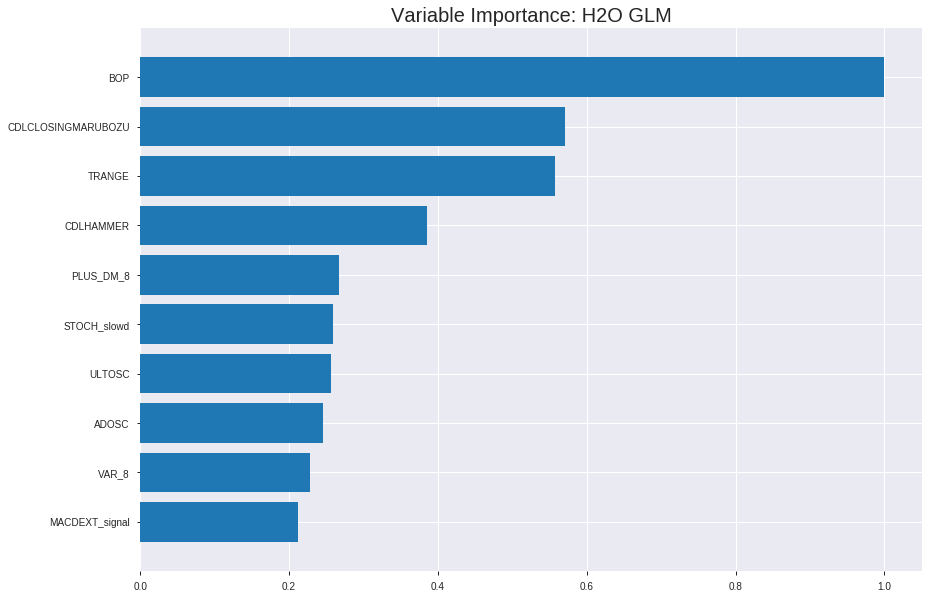

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190906_024426_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19297743453895796
RMSE: 0.43929196958168715
LogLoss: 0.5671814072397008
Null degrees of freedom: 1351
Residual degrees of freedom: 1301
Null deviance: 1872.112597686563
Residual deviance: 1533.658525176151
AIC: 1635.658525176151
AUC: 0.7775097699272543
pr_auc: 0.7573839227635338
Gini: 0.5550195398545086
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3425823238674077: 


,0,1,Error,Rate
0,291.0,412.0,0.5861,(412.0/703.0)
1,62.0,587.0,0.0955,(62.0/649.0)
Total,353.0,999.0,0.3506,(474.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3425823,0.7123786,277.0
max f2,0.2542607,0.8397864,321.0
max f0point5,0.5626785,0.7040393,154.0
max accuracy,0.5134879,0.7100592,181.0
max precision,0.8725372,0.9545455,10.0
max recall,0.0768047,1.0,386.0
max specificity,0.9092629,0.9985775,0.0
max absolute_mcc,0.5117903,0.4185623,182.0
max min_per_class_accuracy,0.4923488,0.7012802,194.0
max mean_per_class_accuracy,0.5117903,0.7086490,182.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.8781732,1.9344046,1.9344046,0.9285714,0.8943290,0.9285714,0.8943290,0.0200308,0.0200308,93.4404578,93.4404578
,2,0.0207101,0.8656038,1.9344046,1.9344046,0.9285714,0.8721080,0.9285714,0.8832185,0.0200308,0.0400616,93.4404578,93.4404578
,3,0.0303254,0.8554114,1.9229584,1.9307753,0.9230769,0.8597792,0.9268293,0.8757865,0.0184900,0.0585516,92.2958398,93.0775302
,4,0.0406805,0.8437341,1.9344046,1.9316991,0.9285714,0.8493769,0.9272727,0.8690641,0.0200308,0.0785824,93.4404578,93.1699118
,5,0.0502959,0.8241447,1.9229584,1.9300281,0.9230769,0.8343131,0.9264706,0.8624205,0.0184900,0.0970724,92.2958398,93.0028098
,6,0.1005917,0.7481656,1.8381220,1.8840750,0.8823529,0.7866735,0.9044118,0.8245470,0.0924499,0.1895223,83.8121998,88.4075048
,7,0.1501479,0.7012556,1.6479084,1.8061284,0.7910448,0.7228418,0.8669951,0.7909793,0.0816641,0.2711864,64.7908378,80.6128413
,8,0.2004438,0.6646034,1.3785915,1.6988498,0.6617647,0.6830700,0.8154982,0.7639024,0.0693374,0.3405239,37.8591498,69.8849777
,9,0.3002959,0.5966837,1.4042344,1.6008865,0.6740741,0.6306615,0.7684729,0.7195982,0.1402157,0.4807396,40.4234435,60.0886548
,10,0.4001479,0.5456764,1.2344918,1.5094572,0.5925926,0.5728013,0.7245841,0.6829668,0.1232666,0.6040062,23.4491811,50.9457177




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1931160634460561
RMSE: 0.4394497280077166
LogLoss: 0.568448230082442
Null degrees of freedom: 385
Residual degrees of freedom: 335
Null deviance: 534.6069507592587
Residual deviance: 438.8420336236452
AIC: 540.8420336236452
AUC: 0.7814516129032257
pr_auc: 0.7585203956048988
Gini: 0.5629032258064515
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30991635762400926: 


,0,1,Error,Rate
0,104.0,96.0,0.48,(96.0/200.0)
1,23.0,163.0,0.1237,(23.0/186.0)
Total,127.0,259.0,0.3083,(119.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3099164,0.7325843,258.0
max f2,0.2621340,0.8357488,290.0
max f0point5,0.4946058,0.7142857,159.0
max accuracy,0.4946058,0.7150259,159.0
max precision,0.8906098,1.0,0.0
max recall,0.0767511,1.0,371.0
max specificity,0.8906098,1.0,0.0
max absolute_mcc,0.4946058,0.4304686,159.0
max min_per_class_accuracy,0.4364971,0.71,190.0
max mean_per_class_accuracy,0.4334689,0.7152151,191.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 43.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.8715456,2.0752688,2.0752688,1.0,0.8787608,1.0,0.8787608,0.0215054,0.0215054,107.5268817,107.5268817
,2,0.0207254,0.8656172,1.5564516,1.8158602,0.75,0.8689338,0.875,0.8738473,0.0161290,0.0376344,55.6451613,81.5860215
,3,0.0310881,0.8273668,1.5564516,1.7293907,0.75,0.8425878,0.8333333,0.8634275,0.0161290,0.0537634,55.6451613,72.9390681
,4,0.0414508,0.8211044,2.0752688,1.8158602,1.0,0.8239585,0.875,0.8535603,0.0215054,0.0752688,107.5268817,81.5860215
,5,0.0518135,0.8103475,2.0752688,1.8677419,1.0,0.8142794,0.9,0.8457041,0.0215054,0.0967742,107.5268817,86.7741935
,6,0.1010363,0.7304734,1.8568195,1.8624207,0.8947368,0.7604691,0.8974359,0.8041794,0.0913978,0.1881720,85.6819468,86.2420733
,7,0.1502591,0.6770761,1.7475948,1.8248053,0.8421053,0.7068281,0.8793103,0.7722884,0.0860215,0.2741935,74.7594793,82.4805339
,8,0.2020725,0.6350036,1.7639785,1.8092087,0.85,0.6572203,0.8717949,0.7427838,0.0913978,0.3655914,76.3978495,80.9208712
,9,0.3005181,0.5586352,1.0922467,1.5743419,0.5263158,0.5919036,0.7586207,0.6933575,0.1075269,0.4731183,9.2246746,57.4341861
,10,0.4015544,0.5022767,1.3303005,1.5129379,0.6410256,0.5301128,0.7290323,0.6522830,0.1344086,0.6075269,33.0300524,51.2937912



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-09-06 02:44:26,0.000 sec,2,.19E2,50,1.3716429,1.3695385
,2019-09-06 02:44:26,0.010 sec,4,.12E2,51,1.3647885,1.3615331
,2019-09-06 02:44:26,0.019 sec,6,.72E1,51,1.3549793,1.3501960
,2019-09-06 02:44:26,0.028 sec,8,.45E1,51,1.3415572,1.3348770
,2019-09-06 02:44:26,0.036 sec,10,.28E1,51,1.3239943,1.3150924
,2019-09-06 02:44:26,0.044 sec,12,.17E1,51,1.3023116,1.2910078
,2019-09-06 02:44:26,0.053 sec,14,.11E1,51,1.2773473,1.2637180
,2019-09-06 02:44:26,0.061 sec,16,.67E0,51,1.2506039,1.2350736
,2019-09-06 02:44:26,0.069 sec,18,.42E0,51,1.2239678,1.2074410
,2019-09-06 02:44:26,0.077 sec,20,.26E0,51,1.1991547,1.1829933


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6701030927835051)

('F1', 0.6502463054187192)

('auc', 0.6967552264808362)

('logloss', 0.6208033768034058)

('mean_per_class_error', 0.34026567944250874)

('rmse', 0.46527399730767627)

('mse', 0.21647989257066355)

glm prediction progress: |████████████████████████████████████████████████| 100%


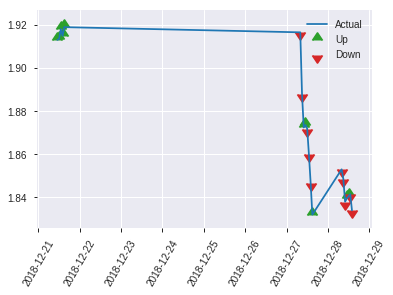


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21647989257066355
RMSE: 0.46527399730767627
LogLoss: 0.6208033768034058
Null degrees of freedom: 193
Residual degrees of freedom: 143
Null deviance: 266.85311025686934
Residual deviance: 240.87171019972146
AIC: 342.87171019972146
AUC: 0.6967552264808362
pr_auc: 0.6128384897622466
Gini: 0.3935104529616724
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.34511999105917857: 


,0,1,Error,Rate
0,57.0,55.0,0.4911,(55.0/112.0)
1,16.0,66.0,0.1951,(16.0/82.0)
Total,73.0,121.0,0.366,(71.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3451200,0.6502463,120.0
max f2,0.0932888,0.8023483,182.0
max f0point5,0.5261529,0.6045752,55.0
max accuracy,0.5261529,0.6701031,55.0
max precision,0.8711797,1.0,0.0
max recall,0.0932888,1.0,182.0
max specificity,0.8711797,1.0,0.0
max absolute_mcc,0.3463855,0.3232931,117.0
max min_per_class_accuracy,0.4296486,0.6428571,92.0
max mean_per_class_accuracy,0.3463855,0.6597343,117.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 41.84 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.8694949,2.3658537,2.3658537,1.0,0.8710163,1.0,0.8710163,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.8484829,2.3658537,2.3658537,1.0,0.8628246,1.0,0.8669205,0.0243902,0.0487805,136.5853659,136.5853659
,3,0.0309278,0.8146652,1.1829268,1.9715447,0.5,0.8311324,0.8333333,0.8549911,0.0121951,0.0609756,18.2926829,97.1544715
,4,0.0412371,0.7886766,1.1829268,1.7743902,0.5,0.8036170,0.75,0.8421476,0.0121951,0.0731707,18.2926829,77.4390244
,5,0.0515464,0.7713929,1.1829268,1.6560976,0.5,0.7802693,0.7,0.8297719,0.0121951,0.0853659,18.2926829,65.6097561
,6,0.1030928,0.6819058,1.8926829,1.7743902,0.8,0.7277539,0.75,0.7787629,0.0975610,0.1829268,89.2682927,77.4390244
,7,0.1494845,0.6083731,1.3143631,1.6316232,0.5555556,0.6532248,0.6896552,0.7398028,0.0609756,0.2439024,31.4363144,63.1623213
,8,0.2010309,0.5838606,1.1829268,1.5165729,0.5,0.5937547,0.6410256,0.7023546,0.0609756,0.3048780,18.2926829,51.6572858
,9,0.2989691,0.5251390,1.4942234,1.5092515,0.6315789,0.5514476,0.6379310,0.6529195,0.1463415,0.4512195,49.4223363,50.9251472
,10,0.4020619,0.4738749,0.9463415,1.3649156,0.4,0.5063686,0.5769231,0.6153424,0.0975610,0.5487805,-5.3658537,36.4915572


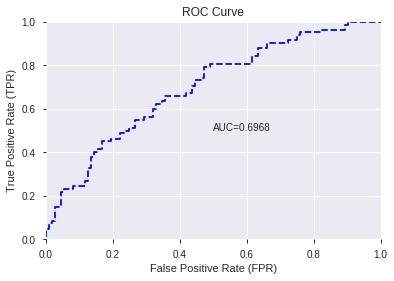

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


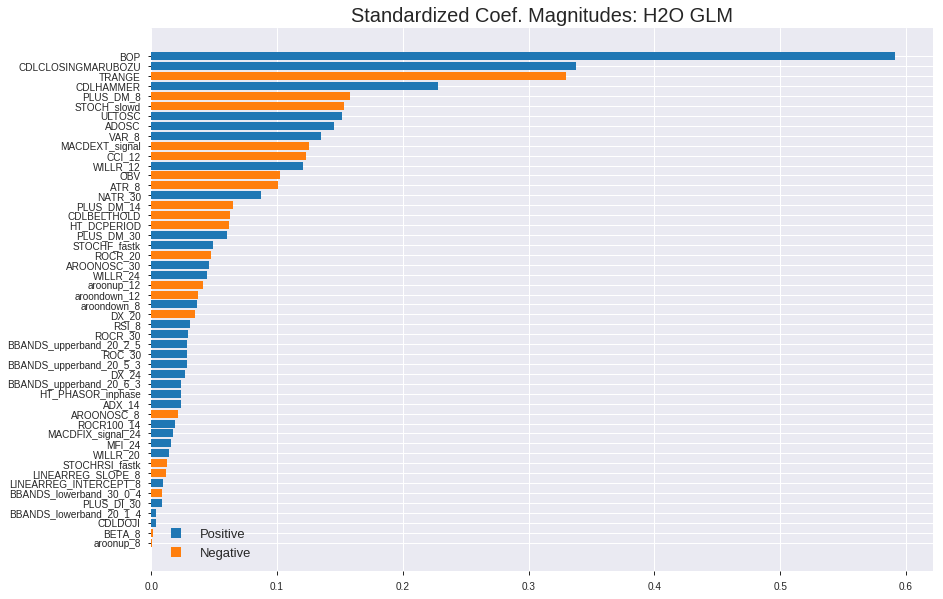

'log_likelihood'
--2019-09-06 02:44:36--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.17.216
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.17.216|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190906_024426_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190906_024426_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'CDLCLOSINGMARUBOZU',
 'TRANGE',
 'CDLHAMMER',
 'PLUS_DM_8',
 'STOCH_slowd',
 'ULTOSC',
 'ADOSC',
 'VAR_8',
 'MACDEXT_signal',
 'CCI_12',
 'WILLR_12',
 'OBV',
 'ATR_8',
 'NATR_30',
 'PLUS_DM_14',
 'CDLBELTHOLD',
 'HT_DCPERIOD',
 'PLUS_DM_30',
 'STOCHF_fastk',
 'ROCR_20',
 'AROONOSC_30',
 'WILLR_24',
 'aroonup_12',
 'aroondown_12',
 'aroondown_8',
 'DX_20',
 'RSI_8',
 'ROCR_30',
 'BBANDS_upperband_20_2_5',
 'ROC_30',
 'BBANDS_upperband_20_5_3',
 'DX_24',
 'BBANDS_upperband_20_6_3',
 'HT_PHASOR_inphase',
 'ADX_14',
 'AROONOSC_8',
 'ROCR100_14',
 'MACDFIX_signal_24',
 'MFI_24',
 'WILLR_20',
 'STOCHRSI_fastk',
 'LINEARREG_SLOPE_8',
 'LINEARREG_INTERCEPT_8',
 'BBANDS_lowerband_30_0_4',
 'PLUS_DI_30',
 'BBANDS_lowerband_20_1_4',
 'CDLDOJI',
 'BETA_8',
 'aroonup_8']

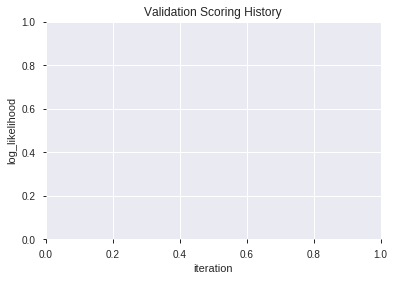

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190906_024533_model_7,0.716137,0.619898,0.331664,0.464218,0.215499
1,XGBoost_grid_1_AutoML_20190906_024533_model_3,0.715810,0.614615,0.314242,0.461653,0.213124
2,XGBoost_grid_1_AutoML_20190906_024533_model_1,0.705793,0.622420,0.330902,0.465128,0.216344
3,XGBoost_2_AutoML_20190906_024533,0.704159,0.619438,0.351154,0.464125,0.215412
4,XGBoost_grid_1_AutoML_20190906_024533_model_4,0.702091,0.625790,0.344294,0.467189,0.218266
5,XGBoost_3_AutoML_20190906_024533,0.701437,0.622387,0.341790,0.465483,0.216674
6,XGBoost_grid_1_AutoML_20190906_024533_model_6,0.696537,0.629709,0.362478,0.468595,0.219581
7,XGBoost_grid_1_AutoML_20190906_024533_model_2,0.693706,0.623073,0.353985,0.466105,0.217254
8,XGBoost_1_AutoML_20190906_024533,0.687936,0.637852,0.362914,0.472305,0.223072
9,XGBoost_grid_1_AutoML_20190906_024533_model_5,0.676503,0.633385,0.360954,0.469795,0.220707


,variable,relative_importance,scaled_importance,percentage
0,BOP,1339.856812,1.000000,0.154300
1,TRANGE,902.968628,0.673929,0.103987
2,STOCHF_fastk,400.453461,0.298878,0.046117
3,BETA_8,280.584229,0.209414,0.032313
4,ATR_8,271.614990,0.202719,0.031280
5,ADOSC,247.596909,0.184794,0.028514
6,ADX_14,243.112442,0.181447,0.027997
7,STOCH_slowd,233.006073,0.173904,0.026833
8,CDLCLOSINGMARUBOZU,215.923721,0.161154,0.024866
9,CCI_12,204.546127,0.152663,0.023556


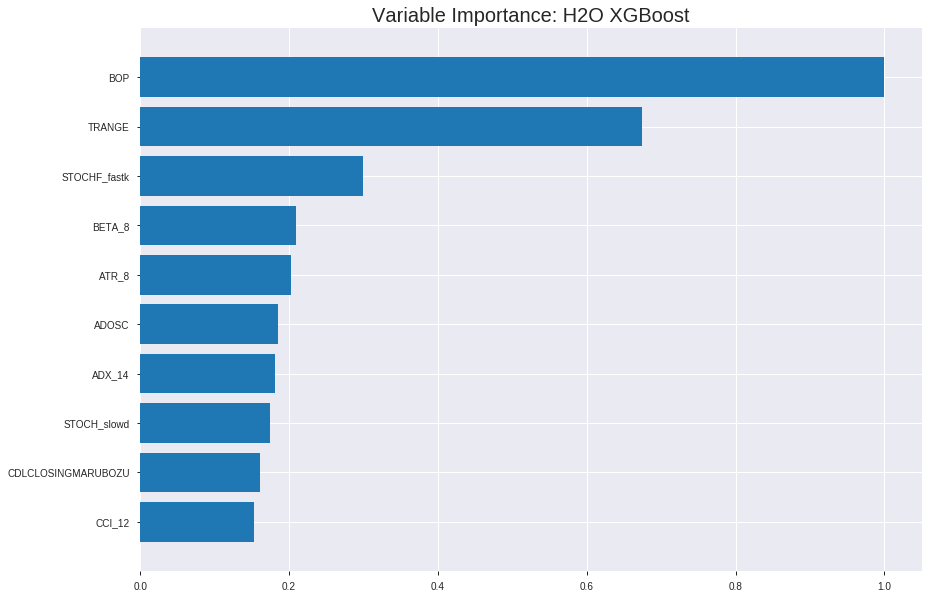

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190906_024533_model_7


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.10356530142586948
RMSE: 0.32181563266235136
LogLoss: 0.36220846195574535
Mean Per-Class Error: 0.09061867804062274
AUC: 0.9665674514024201
pr_auc: 0.9610463417640482
Gini: 0.9331349028048401
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.48349645733833313: 


,0,1,Error,Rate
0,633.0,70.0,0.0996,(70.0/703.0)
1,53.0,596.0,0.0817,(53.0/649.0)
Total,686.0,666.0,0.091,(123.0/1352.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4834965,0.9064639,194.0
max f2,0.4017644,0.9316493,227.0
max f0point5,0.5506819,0.9203897,171.0
max accuracy,0.4834965,0.9090237,194.0
max precision,0.9457468,1.0,0.0
max recall,0.2250253,1.0,308.0
max specificity,0.9457468,1.0,0.0
max absolute_mcc,0.4834965,0.8181988,194.0
max min_per_class_accuracy,0.4890869,0.9032717,191.0
max mean_per_class_accuracy,0.4834965,0.9093813,194.0


Gains/Lift Table: Avg response rate: 48.00 %, avg score: 48.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103550,0.9222961,2.0832049,2.0832049,1.0,0.9308873,1.0,0.9308873,0.0215716,0.0215716,108.3204931,108.3204931
,2,0.0207101,0.9109240,2.0832049,2.0832049,1.0,0.9172087,1.0,0.9240480,0.0215716,0.0431433,108.3204931,108.3204931
,3,0.0303254,0.8994872,2.0832049,2.0832049,1.0,0.9046017,1.0,0.9178821,0.0200308,0.0631741,108.3204931,108.3204931
,4,0.0406805,0.8894852,2.0832049,2.0832049,1.0,0.8944682,1.0,0.9119222,0.0215716,0.0847458,108.3204931,108.3204931
,5,0.0502959,0.8798808,2.0832049,2.0832049,1.0,0.8848103,1.0,0.9067390,0.0200308,0.1047766,108.3204931,108.3204931
,6,0.1005917,0.8254883,2.0832049,2.0832049,1.0,0.8538149,1.0,0.8802770,0.1047766,0.2095532,108.3204931,108.3204931
,7,0.1501479,0.7881950,2.0210197,2.0626807,0.9701493,0.8079239,0.9901478,0.8563969,0.1001541,0.3097072,102.1019709,106.2680744
,8,0.2004438,0.7580697,2.0525696,2.0601436,0.9852941,0.7729316,0.9889299,0.8354536,0.1032357,0.4129430,105.2569564,106.0143621
,9,0.3002959,0.6856568,1.9443246,2.0216324,0.9333333,0.7221855,0.9704433,0.7977905,0.1941448,0.6070878,94.4324602,102.1632371
,10,0.4001479,0.5855827,1.8671689,1.9830879,0.8962963,0.6397581,0.9519409,0.7583555,0.1864407,0.7935285,86.7168864,98.3087873




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1921388552591442
RMSE: 0.4383364635290386
LogLoss: 0.5654802547948098
Mean Per-Class Error: 0.2667204301075269
AUC: 0.7911290322580645
pr_auc: 0.7546097882274403
Gini: 0.582258064516129
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3242272138595581: 


,0,1,Error,Rate
0,121.0,79.0,0.395,(79.0/200.0)
1,29.0,157.0,0.1559,(29.0/186.0)
Total,150.0,236.0,0.2798,(108.0/386.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3242272,0.7440758,235.0
max f2,0.1496855,0.8465856,324.0
max f0point5,0.4001395,0.7210526,190.0
max accuracy,0.4001395,0.7331606,190.0
max precision,0.9253305,1.0,0.0
max recall,0.0965796,1.0,374.0
max specificity,0.9253305,1.0,0.0
max absolute_mcc,0.4001395,0.4662772,190.0
max min_per_class_accuracy,0.4004797,0.73,189.0
max mean_per_class_accuracy,0.4001395,0.7332796,190.0


Gains/Lift Table: Avg response rate: 48.19 %, avg score: 42.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103627,0.8842384,1.5564516,1.5564516,0.75,0.9029387,0.75,0.9029387,0.0161290,0.0161290,55.6451613,55.6451613
,2,0.0207254,0.8700877,2.0752688,1.8158602,1.0,0.8780046,0.875,0.8904717,0.0215054,0.0376344,107.5268817,81.5860215
,3,0.0310881,0.8585771,2.0752688,1.9023297,1.0,0.8654439,0.9166667,0.8821291,0.0215054,0.0591398,107.5268817,90.2329749
,4,0.0414508,0.8496091,2.0752688,1.9455645,1.0,0.8535671,0.9375,0.8749886,0.0215054,0.0806452,107.5268817,94.5564516
,5,0.0518135,0.8344837,1.5564516,1.8677419,0.75,0.8423117,0.9,0.8684532,0.0161290,0.0967742,55.6451613,86.7741935
,6,0.1010363,0.7696976,1.7475948,1.8092087,0.8421053,0.8020034,0.8717949,0.8360802,0.0860215,0.1827957,74.7594793,80.9208712
,7,0.1502591,0.7070229,1.5291454,1.7174638,0.7368421,0.7324453,0.8275862,0.8021308,0.0752688,0.2580645,52.9145444,71.7463849
,8,0.2020725,0.6512681,1.6602151,1.7027847,0.8,0.6767908,0.8205128,0.7699924,0.0860215,0.3440860,66.0215054,70.2784671
,9,0.3005181,0.5778524,1.5291454,1.6459029,0.7368421,0.6122761,0.7931034,0.7183267,0.1505376,0.4946237,52.9145444,64.5902855
,10,0.4015544,0.4552586,1.2238765,1.5397156,0.5897436,0.5157289,0.7419355,0.6673505,0.1236559,0.6182796,22.3876482,53.9715574



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-09-06 02:45:43,6.778 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5199704,0.5,0.6931472,0.5,0.0,1.0,0.5181347
,2019-09-06 02:45:43,6.846 sec,5.0,0.4688491,0.6323675,0.8628912,0.8400063,2.0832049,0.2071006,0.4759218,0.6457715,0.7714382,0.7264616,1.5564516,0.3186528
,2019-09-06 02:45:43,6.909 sec,10.0,0.4439099,0.5850925,0.8881604,0.8753396,2.0832049,0.2100592,0.4633508,0.6209952,0.7775806,0.7349230,2.0752688,0.2564767
,2019-09-06 02:45:43,6.965 sec,15.0,0.4237620,0.5472368,0.9004772,0.8910060,2.0832049,0.1812130,0.4539437,0.6022147,0.7788172,0.7420070,2.0752688,0.2694301
,2019-09-06 02:45:43,7.026 sec,20.0,0.4069892,0.5159123,0.9136093,0.9030780,2.0832049,0.1738166,0.4468487,0.5874229,0.7832796,0.7461200,2.0752688,0.2590674
,2019-09-06 02:45:43,7.086 sec,25.0,0.3919607,0.4876482,0.9215688,0.9141695,2.0832049,0.1568047,0.4424556,0.5774617,0.7837366,0.7537250,2.0752688,0.2616580
,2019-09-06 02:45:43,7.140 sec,30.0,0.3795729,0.4644974,0.9285080,0.9217431,2.0832049,0.1434911,0.4397318,0.5710131,0.7856452,0.7497218,2.0752688,0.2823834
,2019-09-06 02:45:43,7.387 sec,35.0,0.3687703,0.4448962,0.9364566,0.9271309,2.0832049,0.1309172,0.4372432,0.5646300,0.7899731,0.7592158,2.0752688,0.2772021
,2019-09-06 02:45:43,7.445 sec,40.0,0.3598933,0.4285961,0.9410265,0.9338227,2.0832049,0.1383136,0.4350423,0.5601585,0.7949731,0.7643932,2.0752688,0.2590674
,2019-09-06 02:45:43,7.503 sec,45.0,0.3511519,0.4129491,0.9475931,0.9409688,2.0832049,0.1242604,0.4353678,0.5596877,0.7947581,0.7629526,2.0752688,0.2564767


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1339.8568115,1.0,0.1543003
TRANGE,902.9686279,0.6739292,0.1039875
STOCHF_fastk,400.4534607,0.2988778,0.0461169
BETA_8,280.5842285,0.2094136,0.0323126
ATR_8,271.6149902,0.2027194,0.0312797
---,---,---,---
BBANDS_upperband_20_6_3,40.1687317,0.0299799,0.0046259
aroonup_12,28.8101044,0.0215024,0.0033178
aroondown_8,23.8827152,0.0178248,0.0027504
CDLBELTHOLD,14.4902277,0.0108148,0.0016687



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6752577319587629)

('F1', 0.6728110599078342)

('auc', 0.7161367595818815)

('logloss', 0.6198980259958321)

('mean_per_class_error', 0.31718205574912894)

('rmse', 0.4642184664679686)

('mse', 0.2154987846098725)

xgboost prediction progress: |████████████████████████████████████████████| 100%


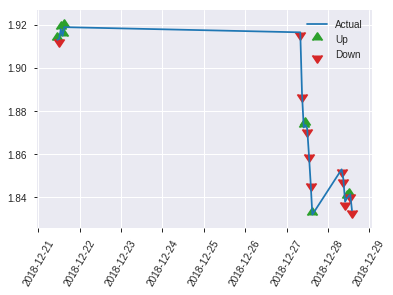


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2154987846098725
RMSE: 0.4642184664679686
LogLoss: 0.6198980259958321
Mean Per-Class Error: 0.31718205574912894
AUC: 0.7161367595818815
pr_auc: 0.605535344970567
Gini: 0.432273519163763
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.241099014878273: 


,0,1,Error,Rate
0,50.0,62.0,0.5536,(62.0/112.0)
1,9.0,73.0,0.1098,(9.0/82.0)
Total,59.0,135.0,0.366,(71.0/194.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2410990,0.6728111,134.0
max f2,0.1613312,0.8178054,154.0
max f0point5,0.3751744,0.6172840,100.0
max accuracy,0.5516962,0.6752577,48.0
max precision,0.9170958,1.0,0.0
max recall,0.0824759,1.0,192.0
max specificity,0.9170958,1.0,0.0
max absolute_mcc,0.3751744,0.3615452,100.0
max min_per_class_accuracy,0.3929254,0.6428571,92.0
max mean_per_class_accuracy,0.3751744,0.6828179,100.0


Gains/Lift Table: Avg response rate: 42.27 %, avg score: 39.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0103093,0.8903170,2.3658537,2.3658537,1.0,0.9074310,1.0,0.9074310,0.0243902,0.0243902,136.5853659,136.5853659
,2,0.0206186,0.8646881,1.1829268,1.7743902,0.5,0.8829251,0.75,0.8951781,0.0121951,0.0365854,18.2926829,77.4390244
,3,0.0309278,0.8578885,1.1829268,1.5772358,0.5,0.8627324,0.6666667,0.8843628,0.0121951,0.0487805,18.2926829,57.7235772
,4,0.0412371,0.8474436,2.3658537,1.7743902,1.0,0.8555914,0.75,0.8771700,0.0243902,0.0731707,136.5853659,77.4390244
,5,0.0515464,0.8213914,1.1829268,1.6560976,0.5,0.8384849,0.7,0.8694330,0.0121951,0.0853659,18.2926829,65.6097561
,6,0.1030928,0.7307010,1.4195122,1.5378049,0.6,0.7678237,0.65,0.8186283,0.0731707,0.1585366,41.9512195,53.7804878
,7,0.1494845,0.6423536,1.3143631,1.4684609,0.5555556,0.6971510,0.6206897,0.7809285,0.0609756,0.2195122,31.4363144,46.8460892
,8,0.2010309,0.5840297,1.8926829,1.5772358,0.8,0.6218719,0.6666667,0.7401447,0.0975610,0.3170732,89.2682927,57.7235772
,9,0.2989691,0.5160741,1.3697047,1.5092515,0.5789474,0.5534783,0.6379310,0.6789954,0.1341463,0.4512195,36.9704750,50.9251472
,10,0.4020619,0.4349193,1.0646341,1.3952470,0.45,0.4659408,0.5897436,0.6243660,0.1097561,0.5609756,6.4634146,39.5247029


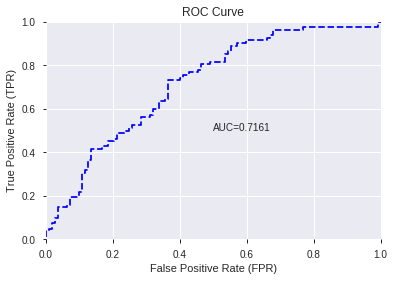

This function is available for GLM models only


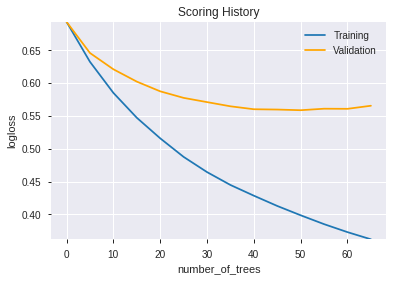

--2019-09-06 02:45:53--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.177.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.177.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190906_024533_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190906_024533_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_91d3',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'TRANGE',
 'STOCHF_fastk',
 'BETA_8',
 'ATR_8',
 'ADOSC',
 'ADX_14',
 'STOCH_slowd',
 'CDLCLOSINGMARUBOZU',
 'CCI_12',
 'HT_PHASOR_inphase',
 'HT_DCPERIOD',
 'ULTOSC',
 'VAR_8',
 'MFI_24',
 'PLUS_DM_8',
 'MACDFIX_signal_24',
 'NATR_30',
 'OBV',
 'BBANDS_upperband_20_2_5',
 'PLUS_DM_30',
 'WILLR_12',
 'ROCR_20',
 'MACDEXT_signal',
 'CDLHAMMER',
 'ROC_30',
 'PLUS_DM_14',
 'BBANDS_lowerband_20_1_4',
 'PLUS_DI_30',
 'STOCHRSI_fastk',
 'DX_20',
 'WILLR_24',
 'LINEARREG_INTERCEPT_8',
 'BBANDS_lowerband_30_0_4',
 'DX_24',
 'LINEARREG_SLOPE_8',
 'WILLR_20',
 'ROCR_30',
 'aroonup_8',
 'ROCR100_14',
 'RSI_8',
 'AROONOSC_30',
 'BBANDS_upperband_20_5_3',
 'AROONOSC_8',
 'aroondown_12',
 'BBANDS_upperband_20_6_3',
 'aroonup_12',
 'aroondown_8',
 'CDLBELTHOLD',
 'CDLDOJI']

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [54]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.706
GLM             0.686
XGBoost         0.711
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.696,0.686,0.711
DLF,0.675,0.686,0.675
Fwe,0.706,0.675,0.711
RFE,0.655,0.670,0.675
XGBF,0.696,0.686,0.675






F1


DeepLearning    0.686
GLM             0.693
XGBoost         0.673
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.673,0.663,0.657
DLF,0.686,0.693,0.673
Fwe,0.663,0.664,0.663
RFE,0.657,0.650,0.673
XGBF,0.674,0.693,0.673






auc


DeepLearning    0.733
GLM             0.729
XGBoost         0.728
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.729,0.722,0.728
DLF,0.729,0.729,0.719
Fwe,0.733,0.720,0.726
RFE,0.681,0.697,0.716
XGBF,0.730,0.729,0.719






logloss


DeepLearning    0.692
GLM             0.621
XGBoost         0.620
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.692,0.620,0.613
DLF,0.643,0.601,0.619
Fwe,0.639,0.607,0.607
RFE,0.675,0.621,0.620
XGBF,0.601,0.601,0.619






mean_per_class_error


DeepLearning    0.343
GLM             0.340
XGBoost         0.317
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.309,0.321,0.306
DLF,0.305,0.294,0.316
Fwe,0.308,0.325,0.302
RFE,0.343,0.340,0.317
XGBF,0.298,0.294,0.316






rmse


DeepLearning    0.476
GLM             0.465
XGBoost         0.464
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.468,0.463,0.459
DLF,0.462,0.455,0.464
Fwe,0.462,0.459,0.456
RFE,0.476,0.465,0.464
XGBF,0.455,0.455,0.464






mse


DeepLearning    0.227
GLM             0.216
XGBoost         0.215
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.219,0.214,0.211
DLF,0.214,0.207,0.215
Fwe,0.213,0.211,0.208
RFE,0.227,0.216,0.215
XGBF,0.207,0.207,0.215


{'F1':       DeepLearning    GLM  XGBoost
 All          0.673    NaN      NaN
 DLF          0.686    NaN      NaN
 DLF            NaN  0.693      NaN
 DLF            NaN    NaN    0.673
 All            NaN  0.663      NaN
 All            NaN    NaN    0.657
 XGBF         0.674    NaN      NaN
 XGBF           NaN  0.693      NaN
 XGBF           NaN    NaN    0.673
 Fwe          0.663    NaN      NaN
 Fwe            NaN  0.664      NaN
 Fwe            NaN    NaN    0.663
 RFE          0.657    NaN      NaN
 RFE            NaN  0.650      NaN
 RFE            NaN    NaN    0.673,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.696    NaN      NaN
 DLF          0.675    NaN      NaN
 DLF            NaN  0.686      NaN
 DLF            NaN    NaN    0.675
 All            NaN  0.686      NaN
 All            NaN    NaN    0.711
 XGBF         0.696    NaN      NaN
 XGBF           NaN  0.686      NaN
 XGBF           NaN    NaN    0.675
 Fwe          0.706    NaN      NaN
 Fwe     